In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
!pip install -q sentence-transformers


=== Missing Values per Column ===
id                         0
name                       3
album_name                20
artists                    0
danceability               0
energy                     0
key                        0
loudness                   0
mode                       0
speechiness                0
acousticness               0
instrumentalness           0
liveness                   0
valence                    0
tempo                      0
duration_ms                0
lyrics                     0
year                       0
genre                      0
popularity                 0
total_artist_followers     0
avg_artist_popularity      0
artist_ids                 0
niche_genres               0
dtype: int64
=== After Replacing Missing Values ===
name                      0
album_name                0
artists                   0
danceability              0
energy                    0
key                       0
loudness                  0
mode                  

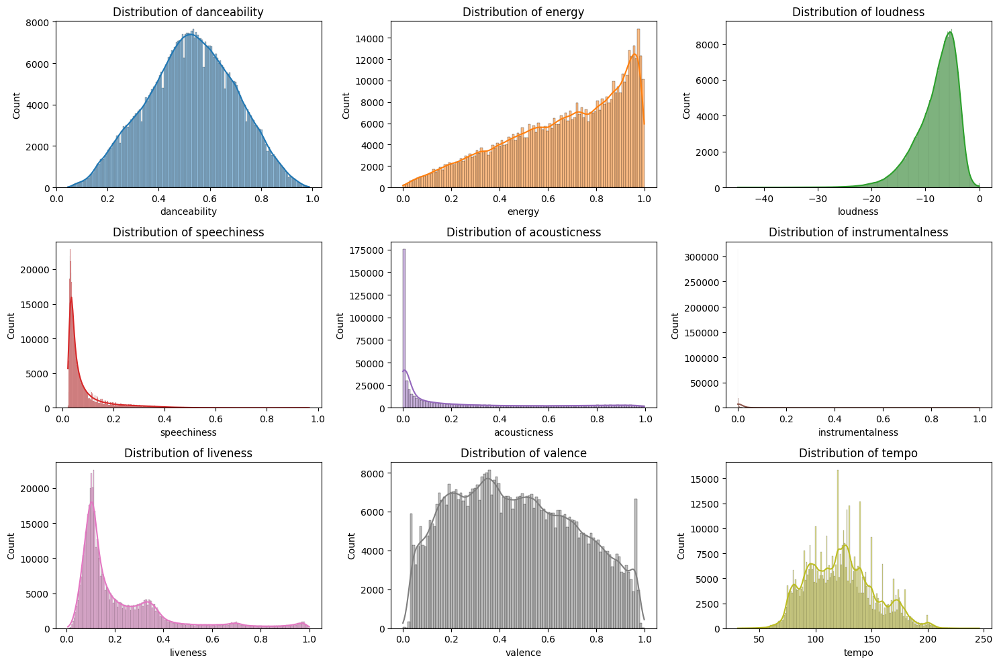

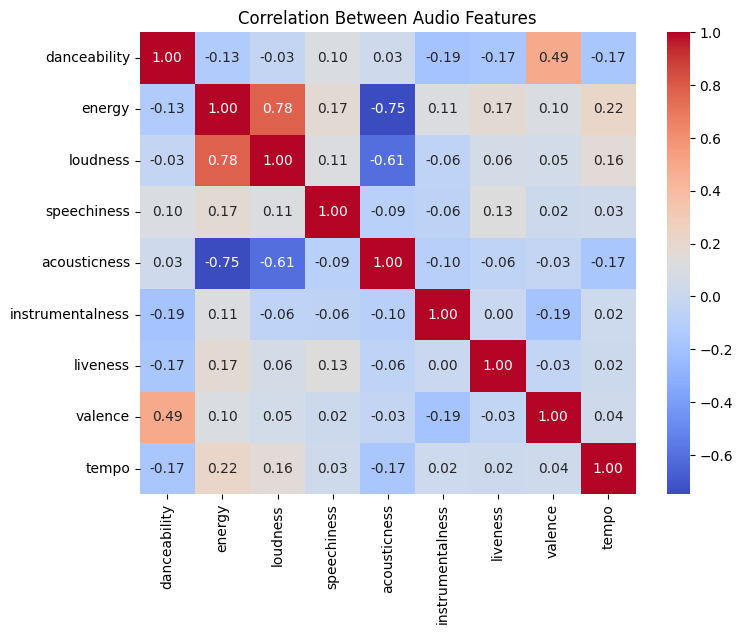

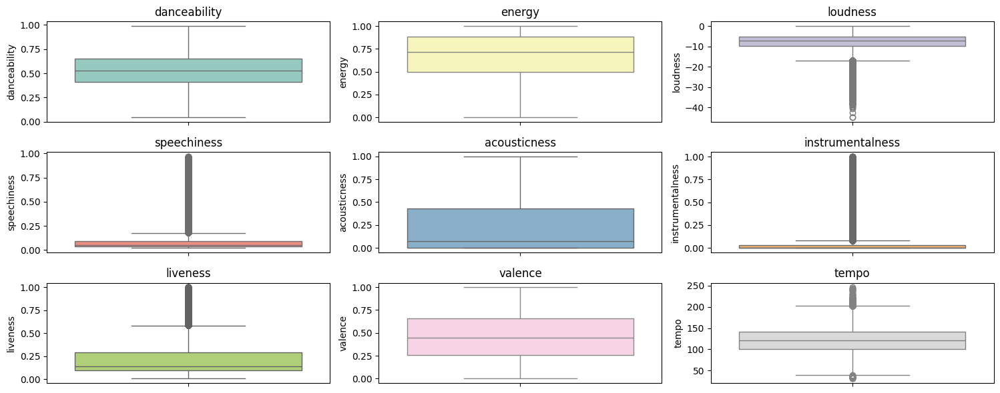

In [3]:
# Load Dataset
df = pd.read_csv("/kaggle/input/datasets/sabrina001/550k-music-dataset/songs.csv")  

# Keep only relevant numeric/audio features for this analysis and also they are the input dimension
audio_cols = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']

# Check for missing/null values
print("=== Missing Values per Column ===")
#print(df[audio_cols + ['lyrics','genre']].isnull().sum())
print(df.isnull().sum())

print("=== After Replacing Missing Values ===")
# Drop the 'id' column
df = df.drop(columns=['id'])

# Handling 'name' missing values (Replacing with "Unknown")
df['name'] = df['name'].fillna("Unknown Name")

# Handling 'album_name' missing values (Replacing with most common album)
df['album_name'] = df['album_name'].fillna(df['album_name'].mode()[0])

# Verify the results
print(df.isnull().sum())
print(df.head())

# Descriptive statistics
desc_stats = df[audio_cols].describe().T
print("=== Descriptive Statistics ===")
print(desc_stats)

# Add range (max - min) for each column
desc_stats['range'] = desc_stats['max'] - desc_stats['min']
print("\n=== Descriptive Stats with Range ===")
print(desc_stats)

# Feature Distribution Plots
plt.figure(figsize=(15,10))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Feature Distribution Plots (for all cols)
'''
cols = ['release_date','len']
plt.figure(figsize=(15,10))
for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()
'''

# Correlation Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df[audio_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Audio Features")
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(15,6))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df[col], color=sns.color_palette("Set3")[i])
    plt.title(col)
plt.tight_layout()
plt.show()


In [4]:
# Take small subset
df = df.sample(25000, random_state=42)

print(df.shape)
df.head

(25000, 23)


<bound method NDFrame.head of                             name  \
313554             Naive Monarch   
210119  I Can't Live Without You   
136837              Erase It All   
460801              The Majestic   
19995   Ain't What It Used To Be   
...                          ...   
425787          Stone Cold Fever   
385951                Satellites   
141658      Exhaustion & Disgust   
191135                      Heat   
54212                  Big Girls   

                                               album_name  \
313554                                           Versions   
210119                           I Can't Live Without You   
136837                                          Hail Mary   
460801                         Cup of Sand (2017 Reissue)   
19995                                    Billy Currington   
...                                                   ...   
425787  20th Century Masters:The Millennium Collection...   
385951                            Periphery IV: H

In [5]:
df = df.dropna(subset=audio_cols + ['lyrics', 'genre'])
df = df.reset_index(drop=True)

print("Dataset shape:", df.shape)

Dataset shape: (25000, 23)


In [6]:
scaler = StandardScaler()
X_audio = scaler.fit_transform(df[audio_cols])
X_audio = np.expand_dims(X_audio, axis=1)  # (N, 1, features)

print("Audio shape:", X_audio.shape)


Audio shape: (25000, 1, 9)


In [7]:
class ConvVAE(nn.Module):
    def __init__(self, input_dim, latent_dim=16):
        super(ConvVAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.Conv1d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.Flatten()
        )

        self.fc_mu = nn.Linear(32 * input_dim, latent_dim)
        self.fc_logvar = nn.Linear(32 * input_dim, latent_dim)

        self.fc_decode = nn.Linear(latent_dim, 32 * input_dim)

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (32, input_dim)),
            nn.ConvTranspose1d(32, 16, 3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose1d(16, 1, 3, padding=1)
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        enc = self.encoder(x)
        mu = self.fc_mu(enc)
        logvar = self.fc_logvar(enc)
        z = self.reparameterize(mu, logvar)

        dec_input = self.fc_decode(z)
        recon = self.decoder(dec_input)

        return recon, mu, logvar, z


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_dim = X_audio.shape[2]
latent_dim = 16
epochs = 50
model = ConvVAE(input_dim, latent_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

dataset = TensorDataset(torch.tensor(X_audio, dtype=torch.float32))
loader = DataLoader(dataset, batch_size=256, shuffle=True)

def vae_loss(recon_x, x, mu, logvar):
    recon_loss = nn.MSELoss()(recon_x, x)
    kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    total = recon_loss + kld
    return total, recon_loss, kld

for epoch in range(epochs):
    total = 0
    mse = 0
    kld = 0
    for batch in loader:
        x = batch[0].to(device)

        optimizer.zero_grad()
        recon, mu, logvar, _ = model(x)
        total_loss, mse_loss, kld_loss = vae_loss(recon, x, mu, logvar)

        total_loss.backward()
        optimizer.step()
        total += total_loss.item()
        mse += mse_loss.item()
        kld += kld_loss.item()

    print(f"Epoch {epoch+1}/{epochs}-> MSE Loss : {mse:.4f}, kld Loss: {kld:.4f}, Total Loss: {total:.4f}")


Epoch 1/50-> MSE Loss : 75.3957, kld Loss: 15.1925, Total Loss: 90.5881
Epoch 2/50-> MSE Loss : 33.6961, kld Loss: 25.5649, Total Loss: 59.2610
Epoch 3/50-> MSE Loss : 27.9313, kld Loss: 26.6437, Total Loss: 54.5751
Epoch 4/50-> MSE Loss : 25.5420, kld Loss: 26.9027, Total Loss: 52.4446
Epoch 5/50-> MSE Loss : 23.9647, kld Loss: 26.7453, Total Loss: 50.7100
Epoch 6/50-> MSE Loss : 23.2684, kld Loss: 26.7487, Total Loss: 50.0171
Epoch 7/50-> MSE Loss : 22.6337, kld Loss: 26.8617, Total Loss: 49.4953
Epoch 8/50-> MSE Loss : 22.3436, kld Loss: 26.8931, Total Loss: 49.2367
Epoch 9/50-> MSE Loss : 22.1019, kld Loss: 26.7509, Total Loss: 48.8528
Epoch 10/50-> MSE Loss : 21.9502, kld Loss: 26.6946, Total Loss: 48.6447
Epoch 11/50-> MSE Loss : 21.7457, kld Loss: 26.6264, Total Loss: 48.3721
Epoch 12/50-> MSE Loss : 21.7360, kld Loss: 26.6354, Total Loss: 48.3714
Epoch 13/50-> MSE Loss : 21.5887, kld Loss: 26.7312, Total Loss: 48.3199
Epoch 14/50-> MSE Loss : 21.4083, kld Loss: 26.6856, Total L

In [9]:
model.eval()

# Convert audio data to tensor and move to device
X_tensor = torch.tensor(X_audio, dtype=torch.float32).to(device)

with torch.no_grad():
    recon, mu, logvar, _ = model(X_tensor)

z_audio = mu.cpu().numpy()

print("Audio latent shape:", z_audio.shape)


Audio latent shape: (25000, 16)


In [10]:
from sentence_transformers import SentenceTransformer
model_st = SentenceTransformer('all-MiniLM-L6-v2')

lyrics_list = df['lyrics'].tolist()

X_lyrics = model_st.encode(
    lyrics_list,
    batch_size=64,
    show_progress_bar=True,
    convert_to_numpy=True
)

print("Lyrics embedding shape:", X_lyrics.shape)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/391 [00:00<?, ?it/s]

Lyrics embedding shape: (25000, 384)


In [11]:
X_hybrid = np.concatenate([z_audio, X_lyrics], axis=1)
print("Hybrid shape:", X_hybrid.shape) #Expected shape:( N , 16 + 384 )
scaler = StandardScaler()
X_hybrid_scaled = scaler.fit_transform(X_hybrid)

Hybrid shape: (25000, 400)


In [12]:
print(df['genre'].unique())
print("Number of unique genres:", df['genre'].nunique())
df.head

['Rock' 'Pop' 'Country' 'Classical' 'Blues' 'Electronic' 'Folk' 'Jazz'
 'Hip-Hop' 'R&B']
Number of unique genres: 10


<bound method NDFrame.head of                            name  \
0                 Naive Monarch   
1      I Can't Live Without You   
2                  Erase It All   
3                  The Majestic   
4      Ain't What It Used To Be   
...                         ...   
24995          Stone Cold Fever   
24996                Satellites   
24997      Exhaustion & Disgust   
24998                      Heat   
24999                 Big Girls   

                                              album_name  \
0                                               Versions   
1                               I Can't Live Without You   
2                                              Hail Mary   
3                             Cup of Sand (2017 Reissue)   
4                                       Billy Currington   
...                                                  ...   
24995  20th Century Masters:The Millennium Collection...   
24996                            Periphery IV: HAIL STAN   
24997    

In [13]:
le = LabelEncoder()
true_labels = le.fit_transform(df['genre'])
n_clusters = len(np.unique(true_labels))
print(n_clusters)

10


In [14]:
pca = PCA(n_components=50, random_state=42)
X_hybrid_pca = pca.fit_transform(X_hybrid_scaled)

X_cluster = X_hybrid_pca  # use PCA-reduced features

pca_db = PCA(n_components=5, random_state=42)
X_dbscan = pca_db.fit_transform(X_hybrid_scaled)

In [48]:
results = {}

# KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
results["KMeans"] = kmeans.fit_predict(X_cluster)

# Agglomerative
agg = AgglomerativeClustering(n_clusters=n_clusters)
results["Agglomerative"] = agg.fit_predict(X_cluster)

# DBSCAN
dbscan = DBSCAN(eps=2.5, min_samples=5)  
results["DBSCAN"] = dbscan.fit_predict(X_dbscan)

In [49]:
for name, labels in results.items():
    print(f"\n VAE + {name}")
    
    if name == "DBSCAN":
        mask = labels != -1  # ignore noise points
        n_clusters_db = len(np.unique(labels[mask]))
        if np.sum(mask) > 1 and n_clusters_db > 1:
            sil = silhouette_score(X_dbscan[mask], labels[mask])
            dbi = davies_bouldin_score(X_dbscan[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:
        n_clusters_alg = len(np.unique(labels))
        if n_clusters_alg > 1:
            sil = silhouette_score(X_cluster, labels)
            dbi = davies_bouldin_score(X_cluster, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")


 VAE + KMeans
Silhouette Score: 0.035524
Davies-Bouldin Index: 3.444274
Adjusted Rand Index: 0.042256

 VAE + Agglomerative
Silhouette Score: 0.008482
Davies-Bouldin Index: 4.509796
Adjusted Rand Index: 0.033676

 VAE + DBSCAN
Silhouette Score: 0.000000
Davies-Bouldin Index: 0.000000
Adjusted Rand Index: 0.000000


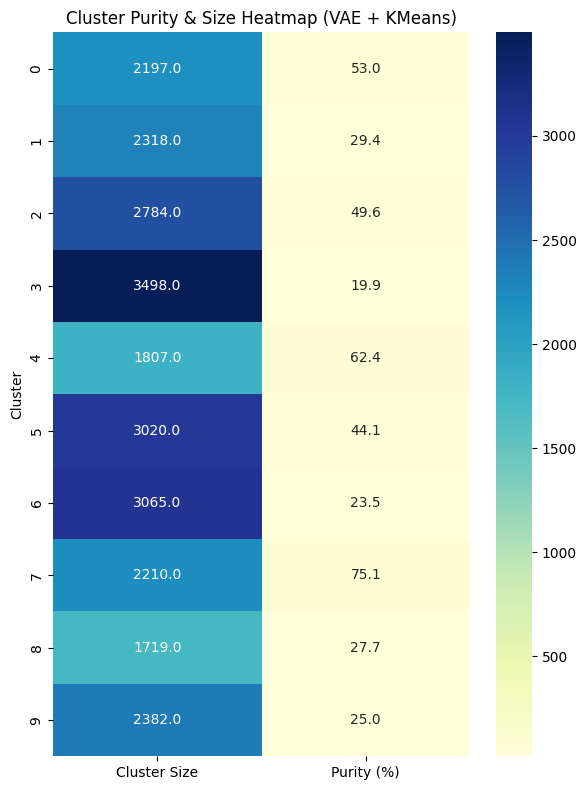


Cluster Purity & Size (VAE + KMeans):
         Cluster Size  Purity (%)
Cluster                          
0                2197   52.981338
1                2318   29.378775
2                2784   49.640805
3                3498   19.925672
4                1807   62.423907
5                3020   44.139073
6                3065   23.491028
7                2210   75.113122
8                1719   27.690518
9                2382   25.020991


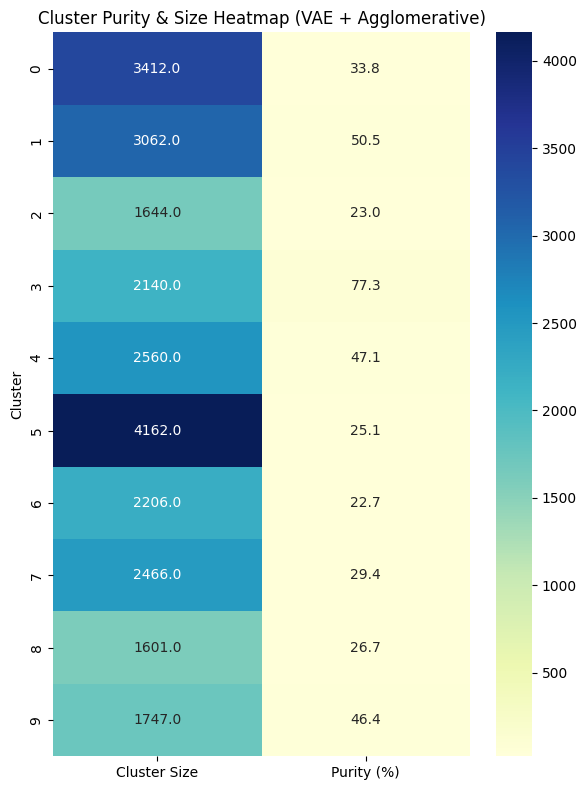


Cluster Purity & Size (VAE + Agglomerative):
         Cluster Size  Purity (%)
Cluster                          
0                3412   33.763189
1                3062   50.489876
2                1644   22.992701
3                2140   77.336449
4                2560   47.148438
5                4162   25.132148
6                2206   22.710789
7                2466   29.440389
8                1601   26.670831
9                1747   46.365197


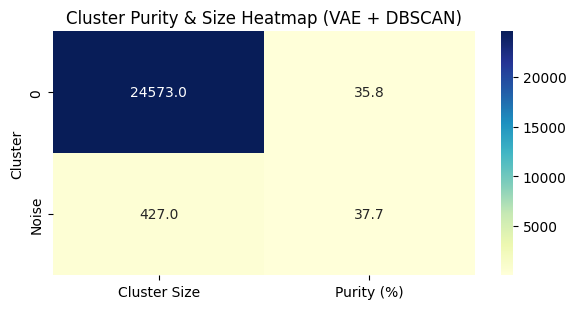


Cluster Purity & Size (VAE + DBSCAN):
         Cluster Size  Purity (%)
Cluster                          
0               24573   35.807594
Noise             427   37.704918


In [ ]:
def cluster_purity_heatmap(clusters, true_labels, method_name="KMeans", le=None):
    # Convert cluster labels to string for DBSCAN noise handling
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])

    # Map true labels to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels

    # Create a DataFrame
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": genres})

    # Cluster size
    cluster_size = df.groupby("Cluster").size()

    # Purity per cluster (% of majority genre)
    cluster_purity = df.groupby("Cluster")['Genre'].apply(lambda x: x.value_counts().max() / len(x) * 100)

    # Combine metrics in one DataFrame
    metrics_df = pd.DataFrame({
        "Cluster Size": cluster_size,
        "Purity (%)": cluster_purity
    }).sort_index()

    # Plot heatmap
    plt.figure(figsize=(6, len(metrics_df)*0.6 + 2))
    sns.heatmap(metrics_df, annot=True, fmt=".1f", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster Purity & Size Heatmap ({method_name})")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

    print(f"\nCluster Purity & Size ({method_name}):")
    print(metrics_df)


for name, labels in results.items():  # results = VAE + clustering
    cluster_purity_heatmap(labels, true_labels, method_name=f"VAE + {name}", le=le)

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




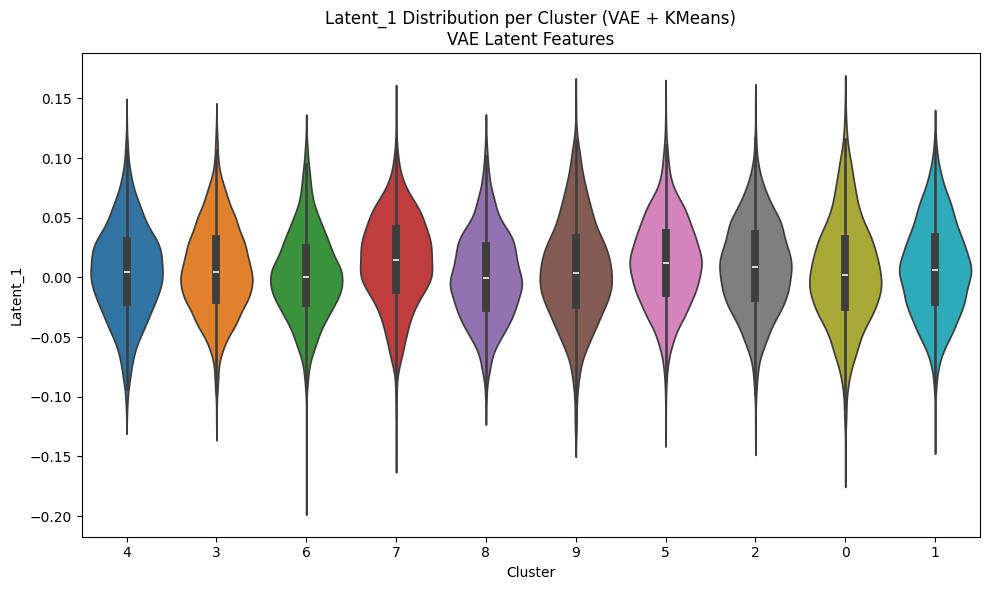

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




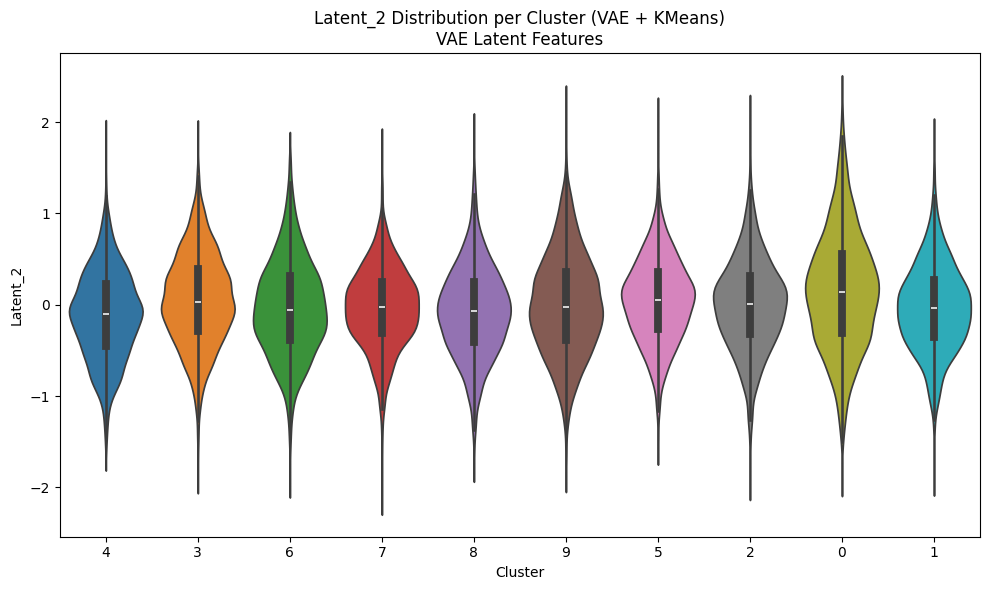

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




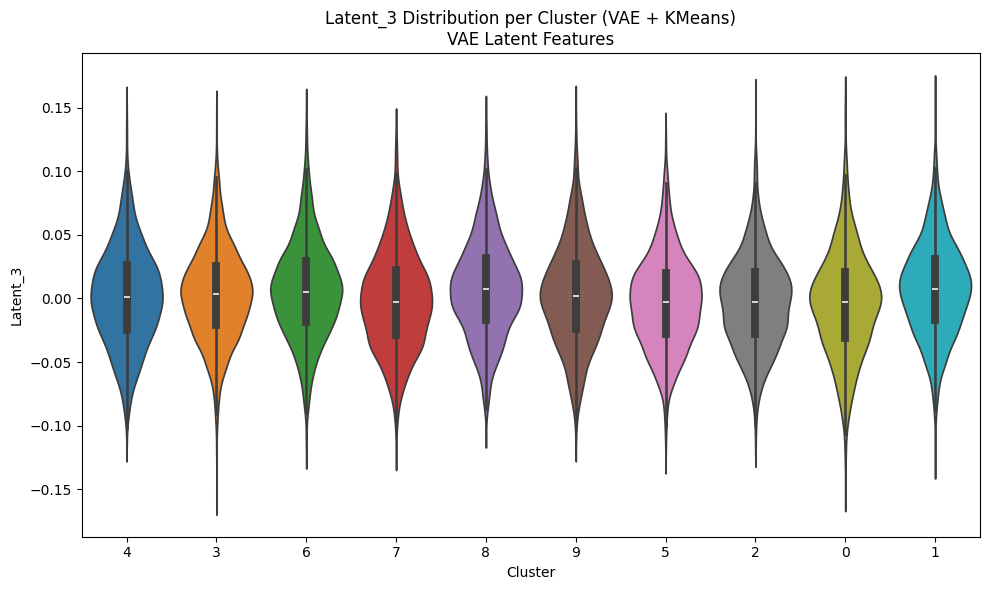

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




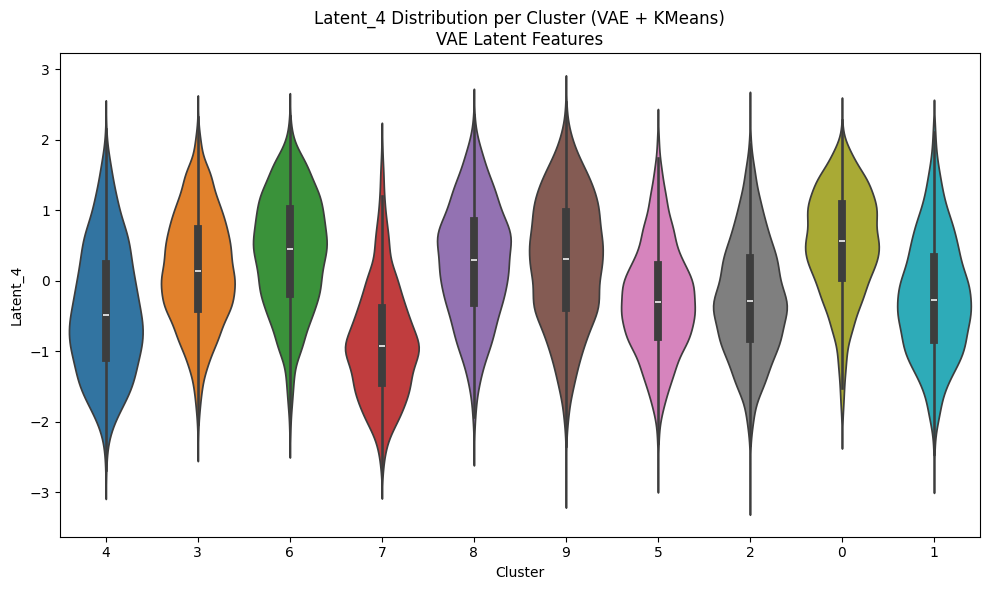

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




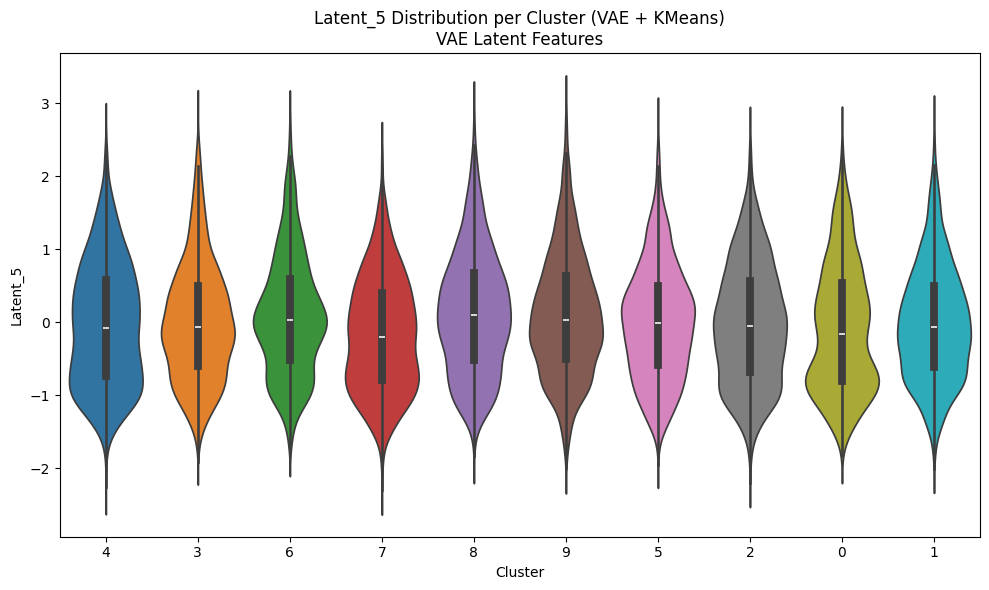

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




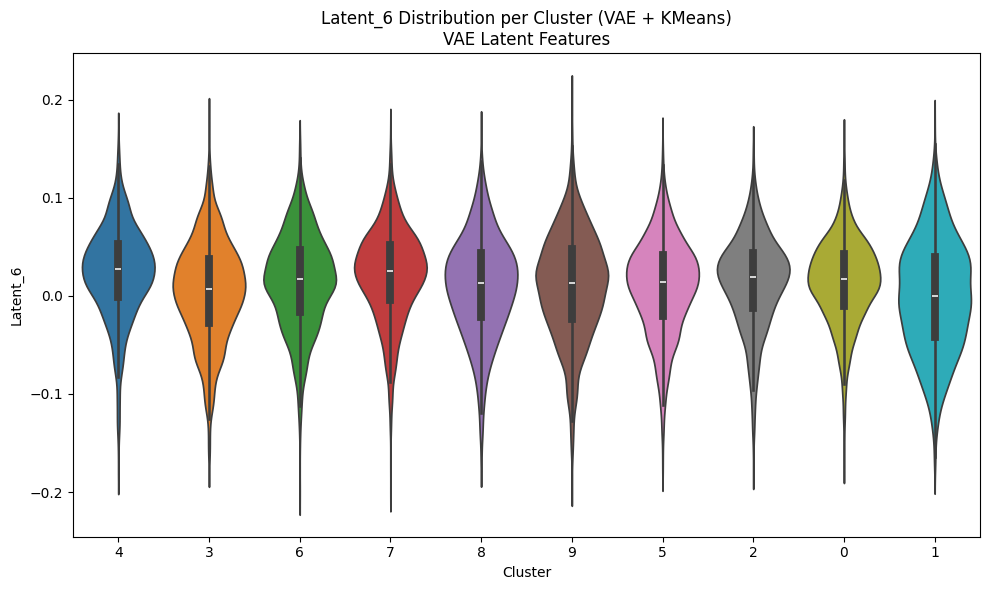

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




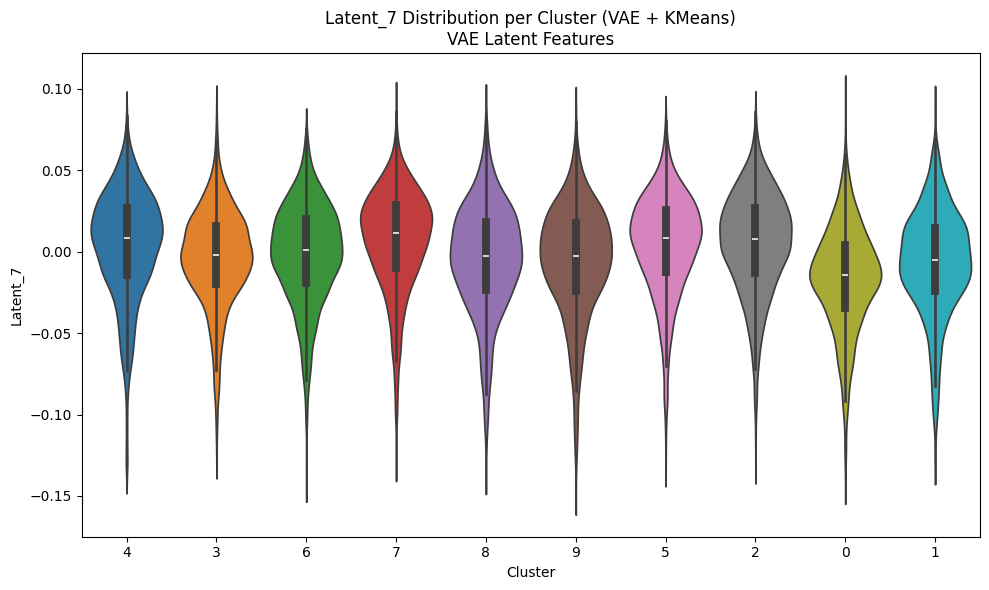

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




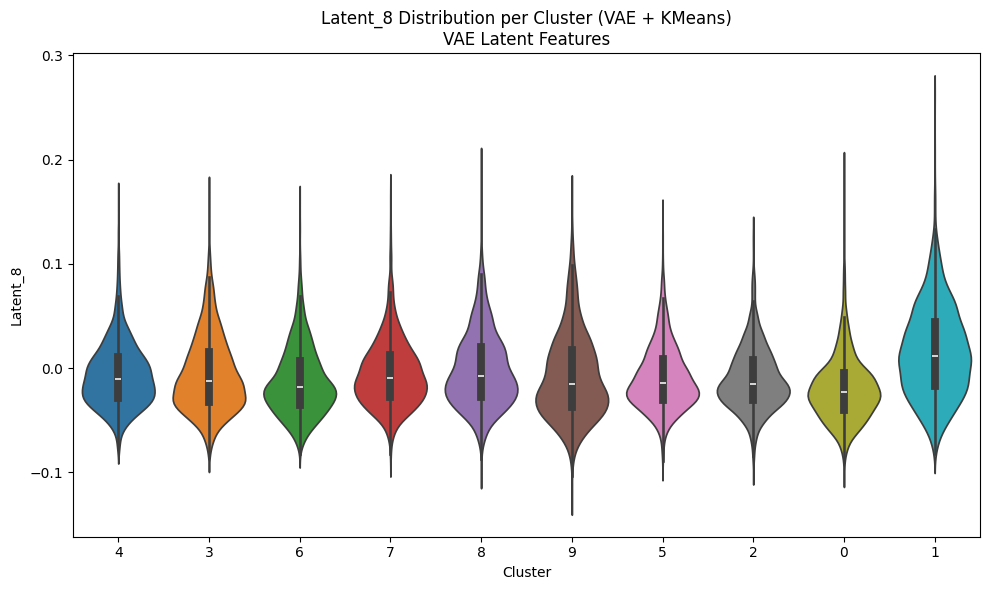

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




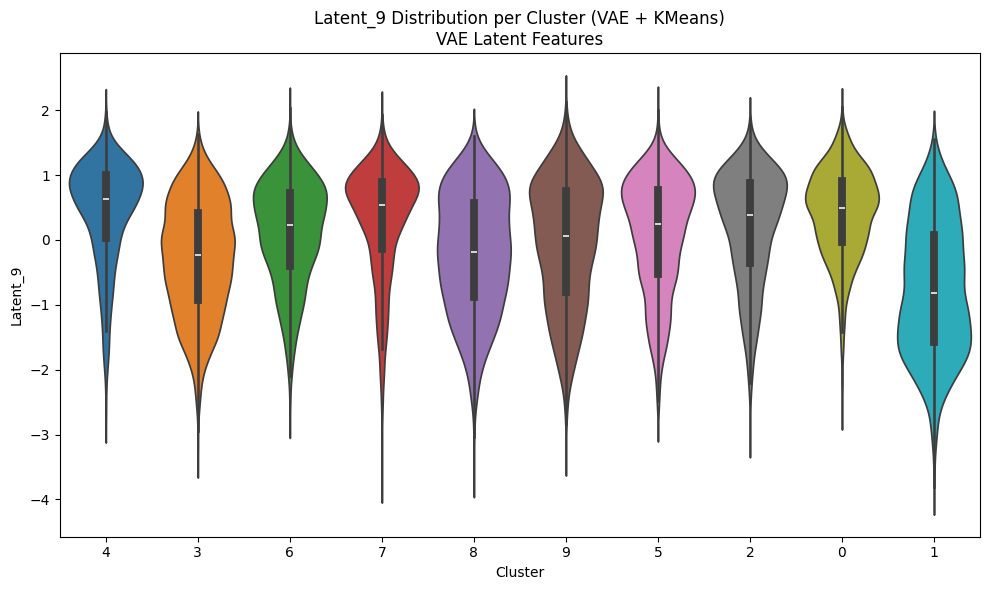

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




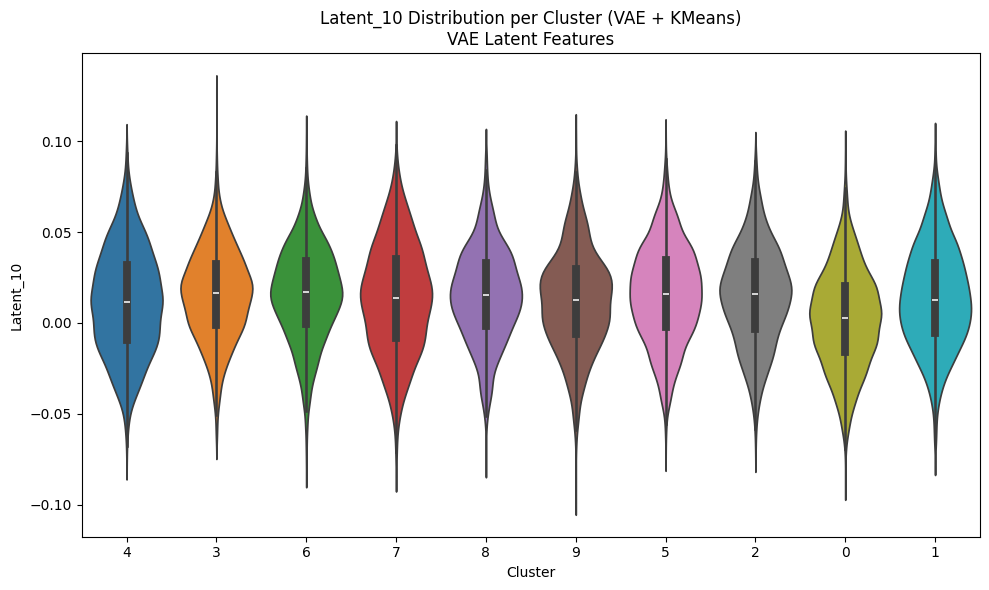

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




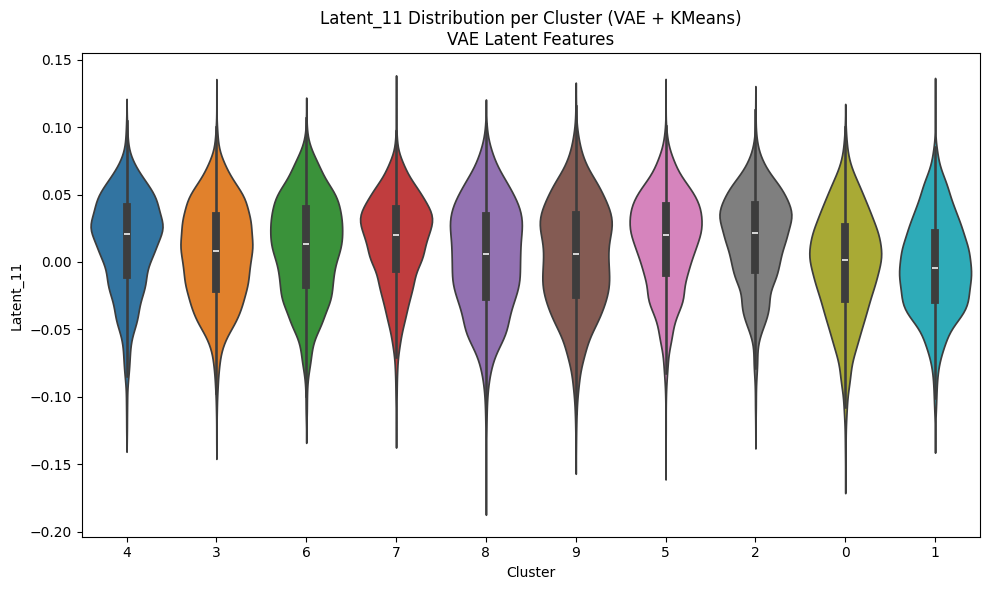

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




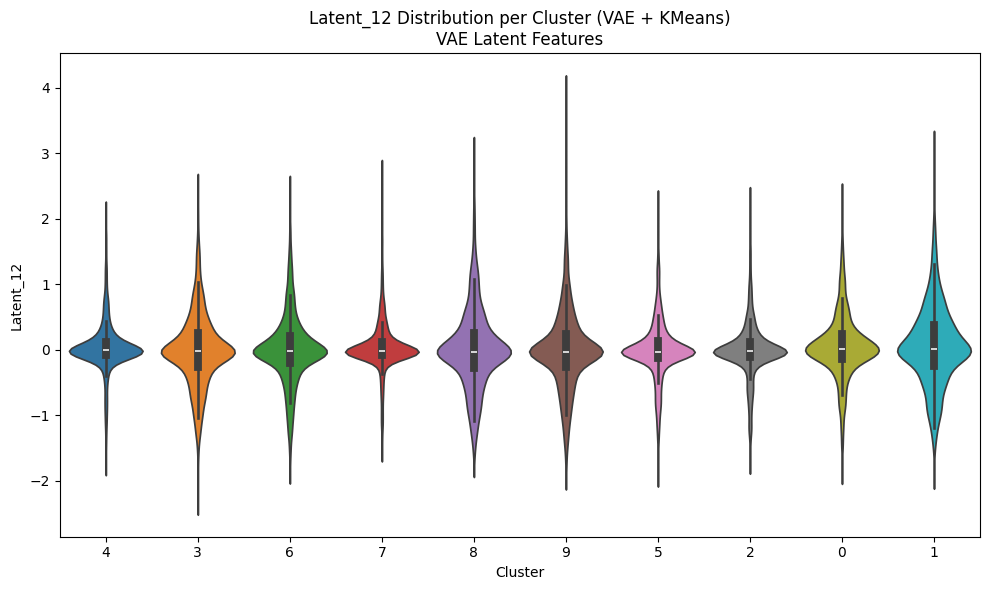

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




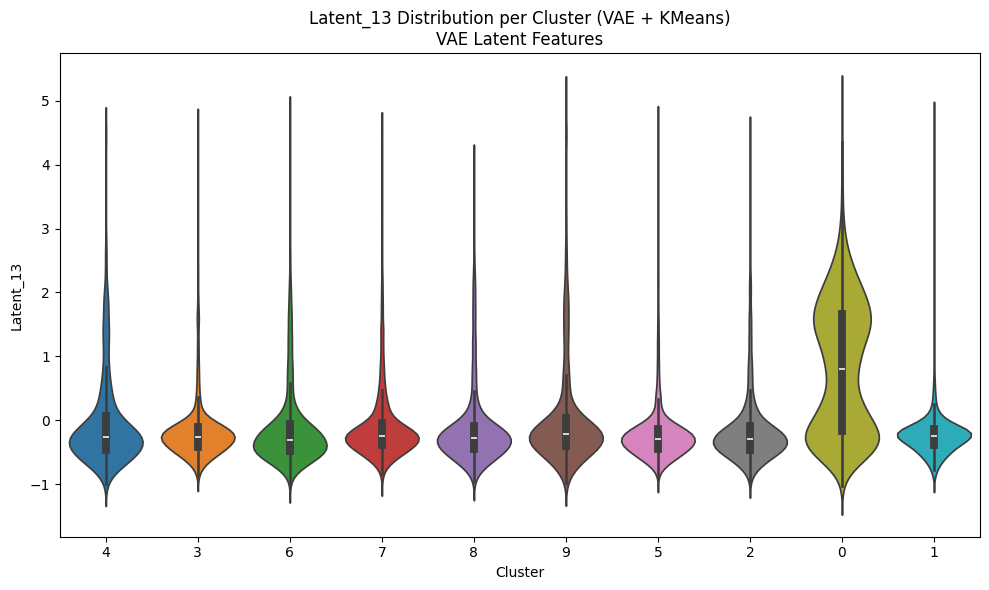

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




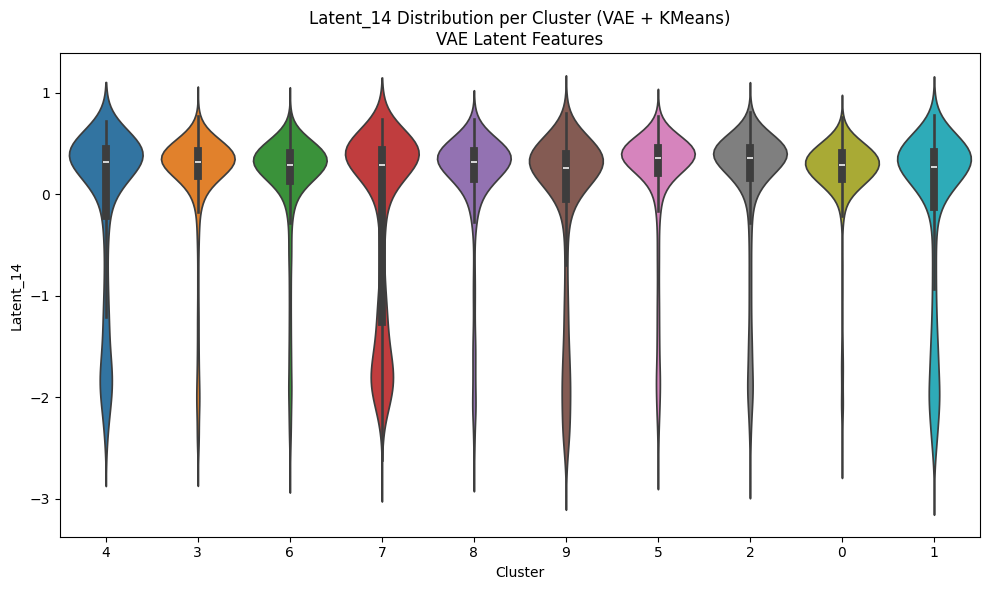

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




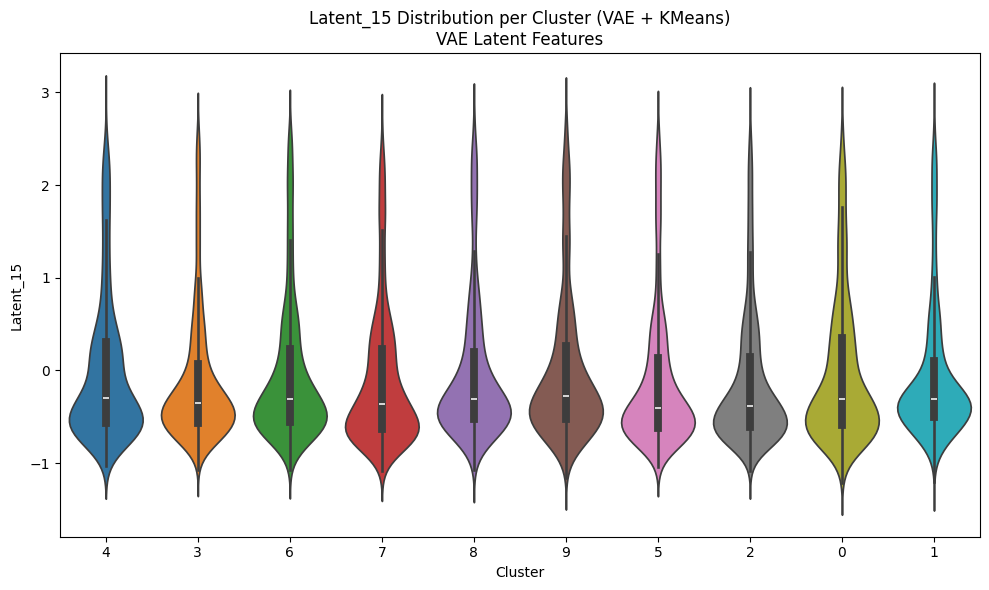

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




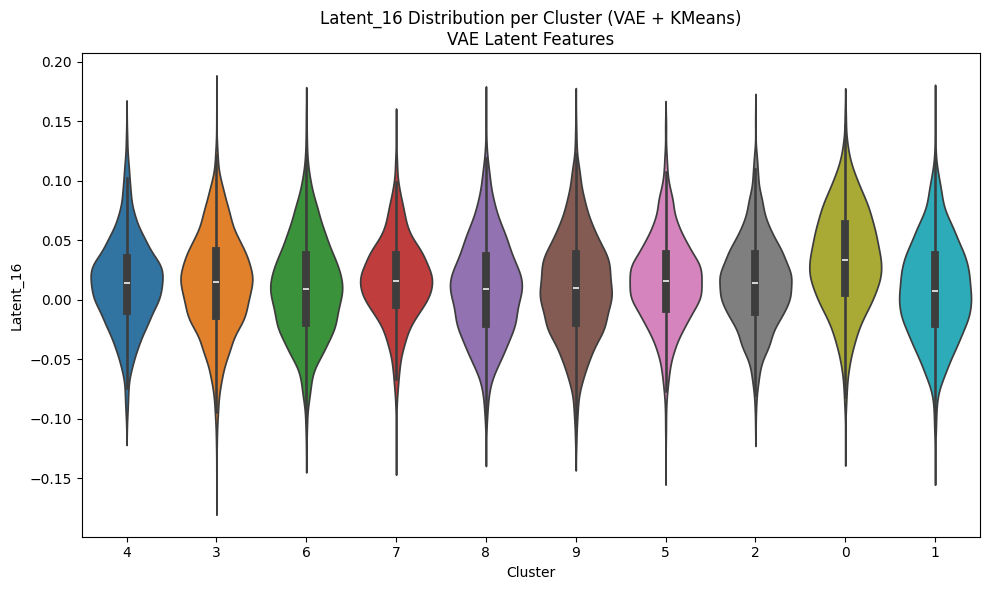

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




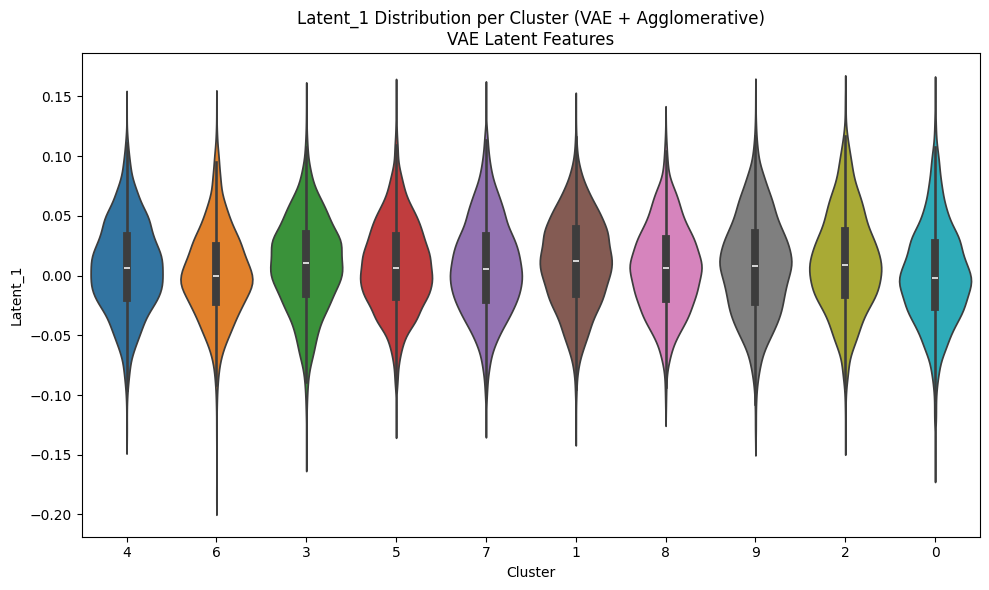

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




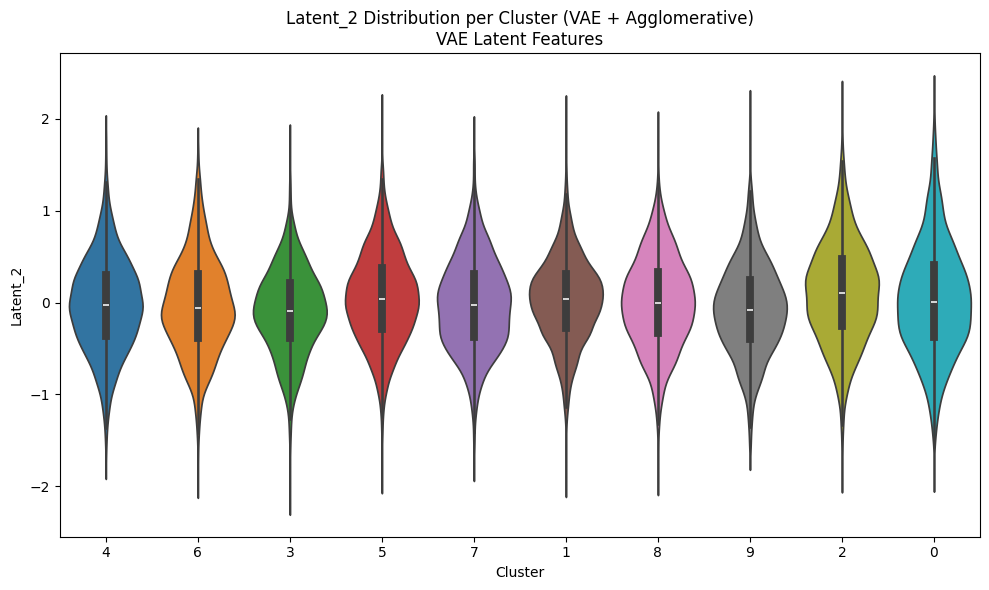

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




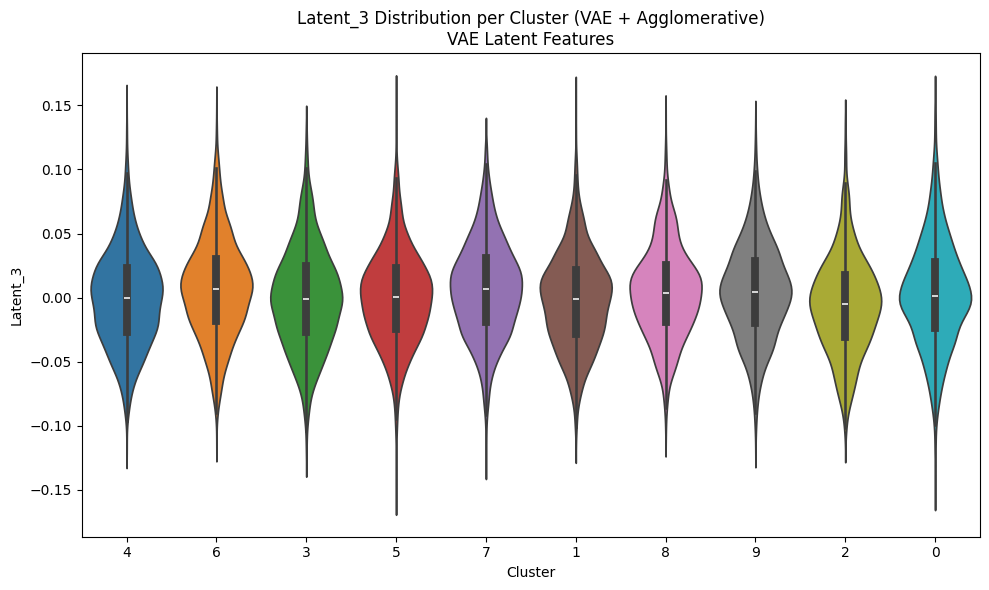

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




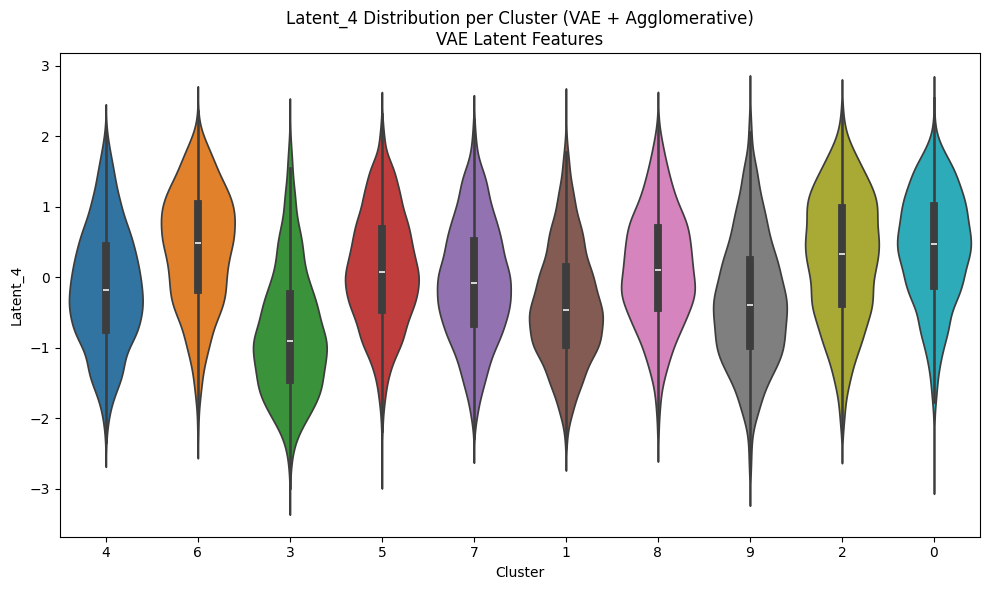

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




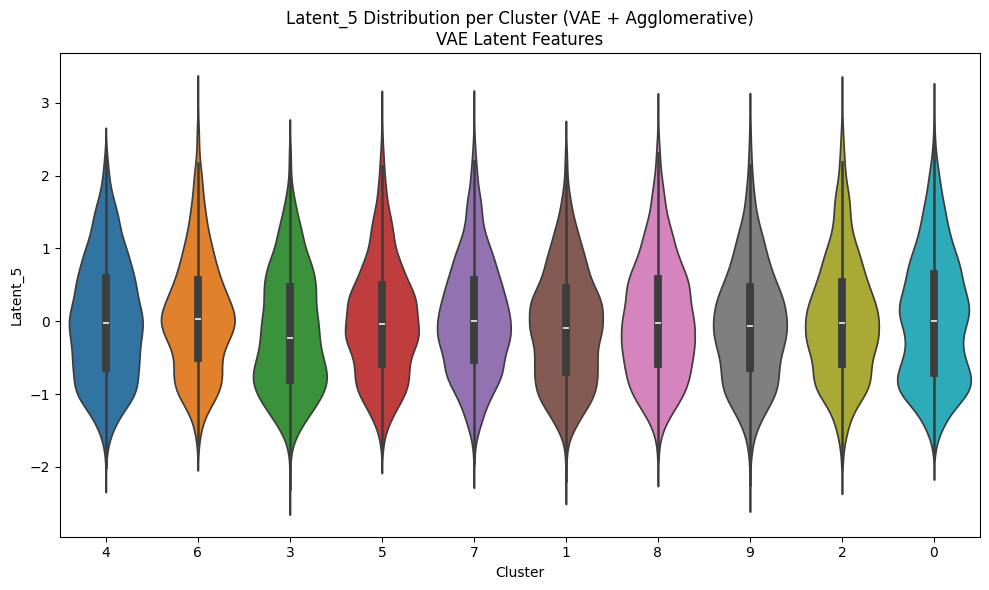

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




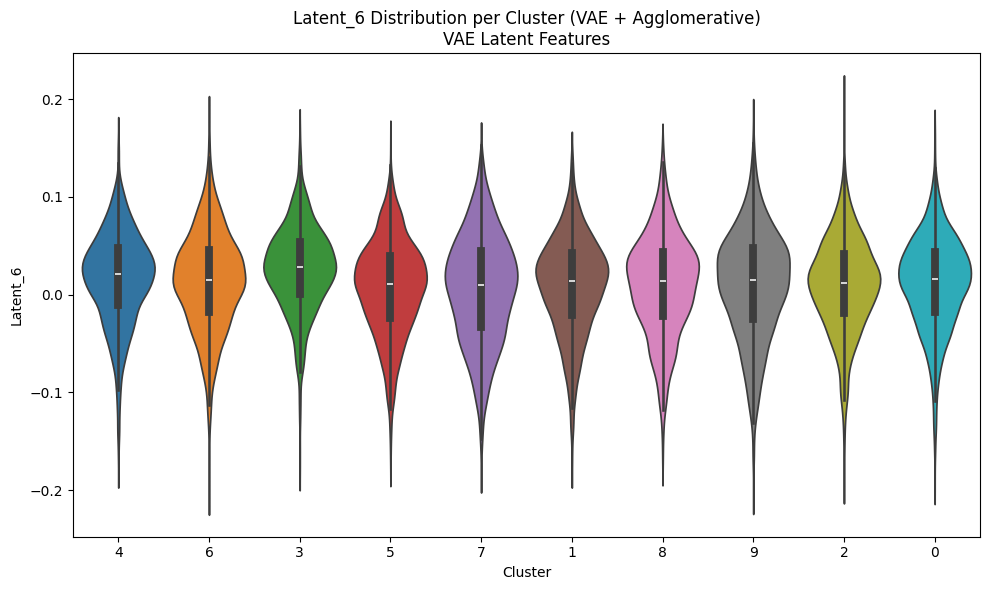

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




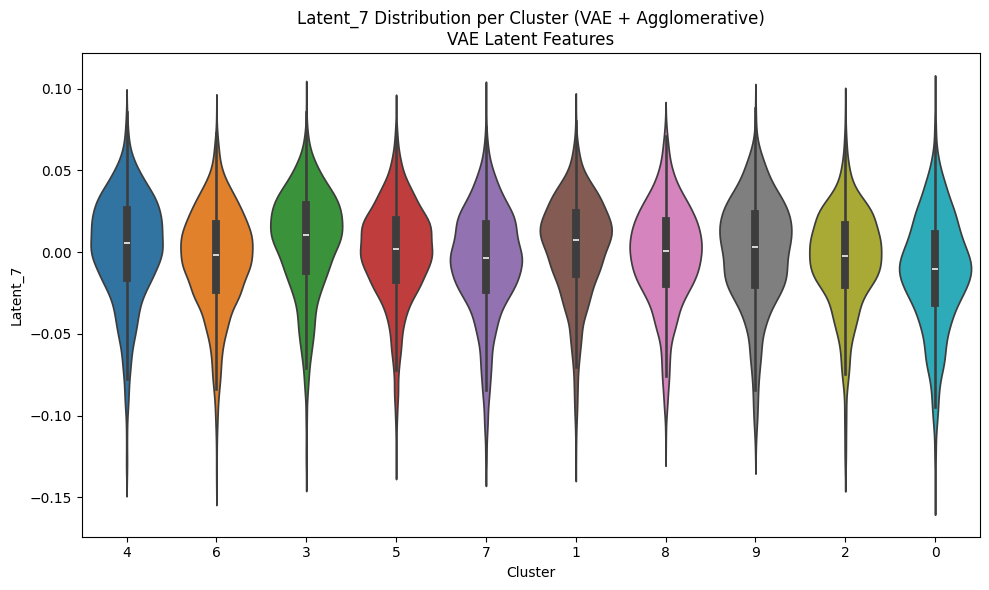

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




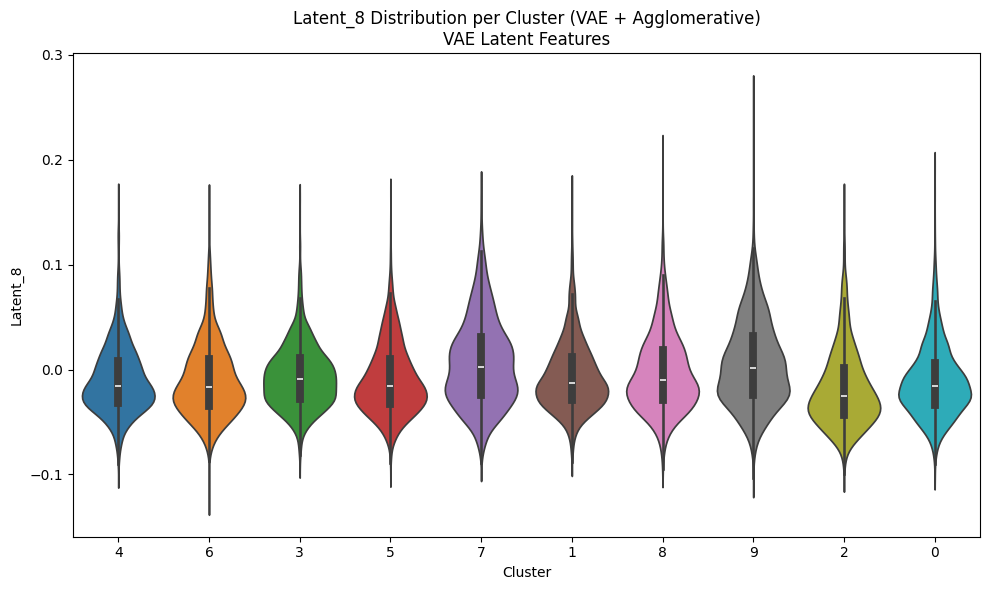

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




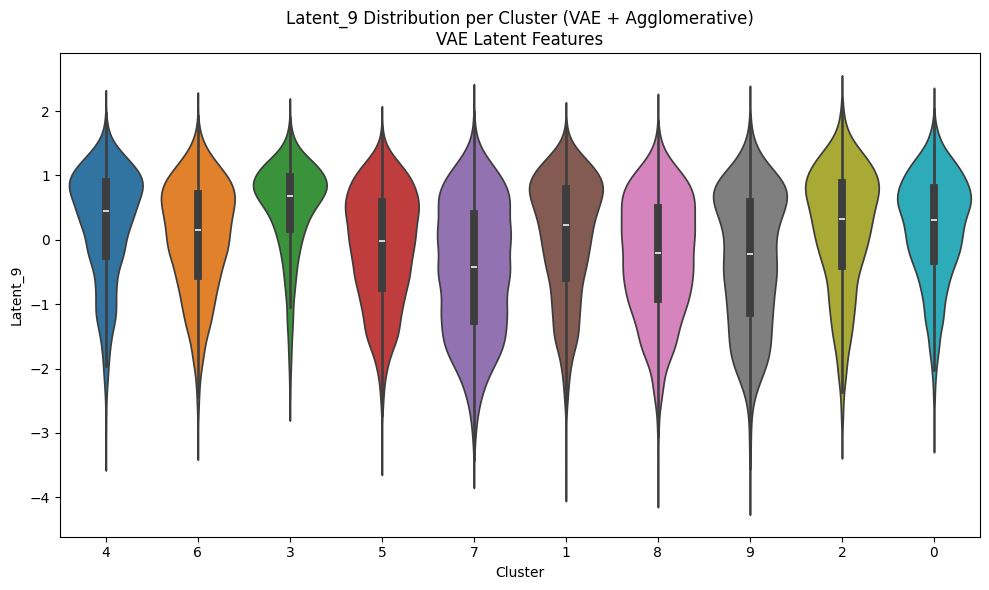

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




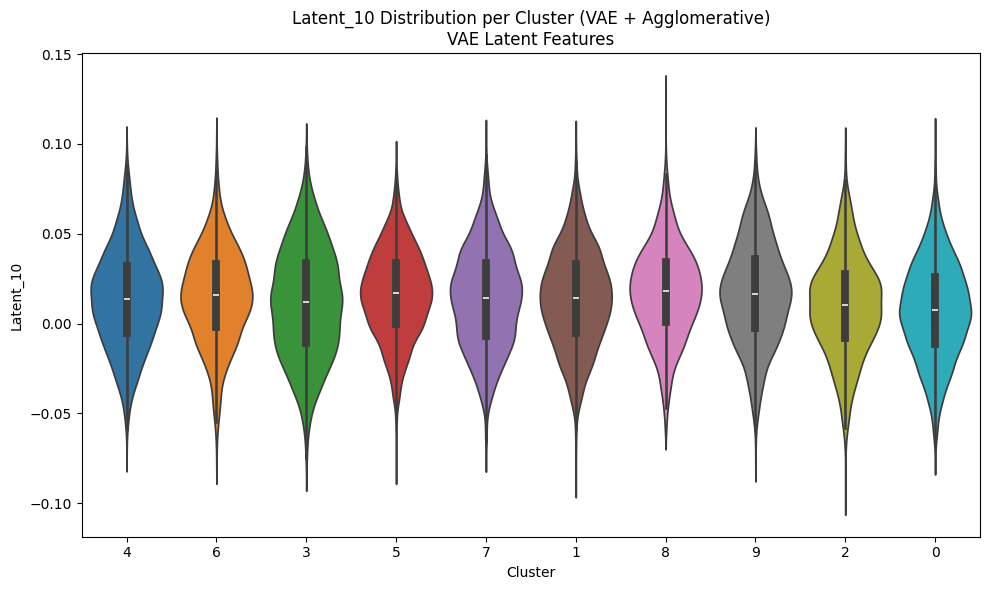

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




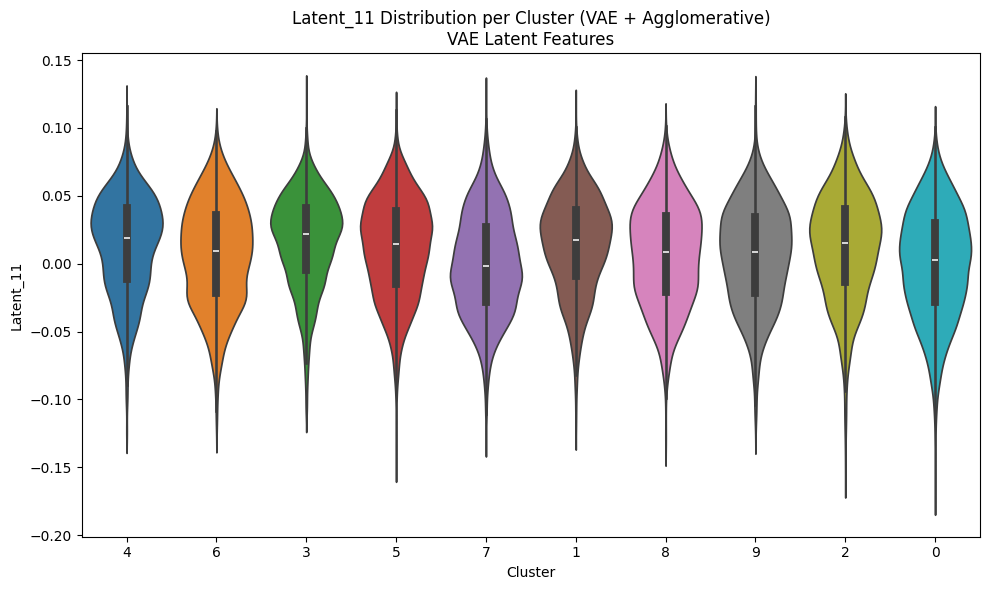

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




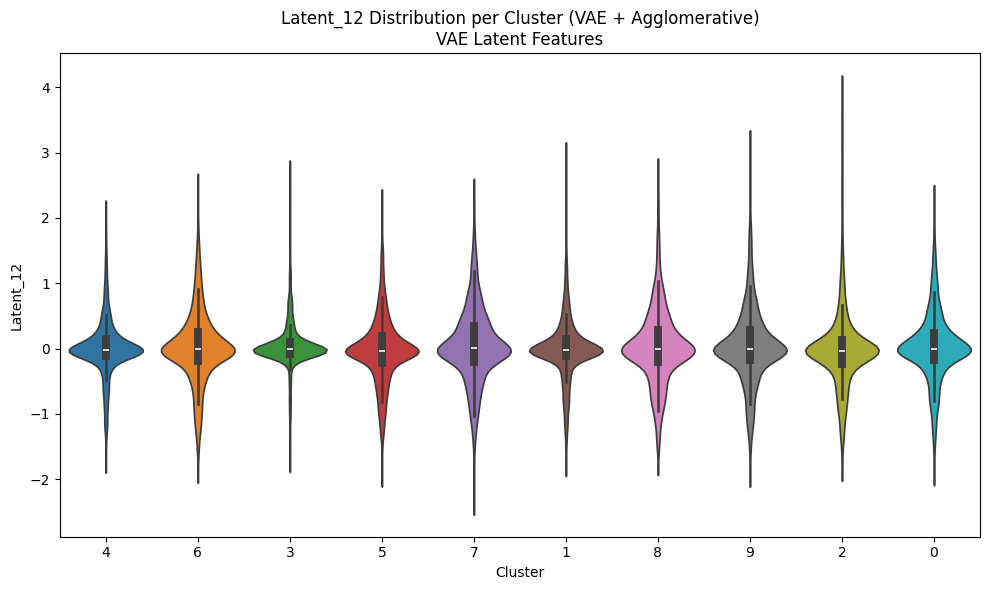

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




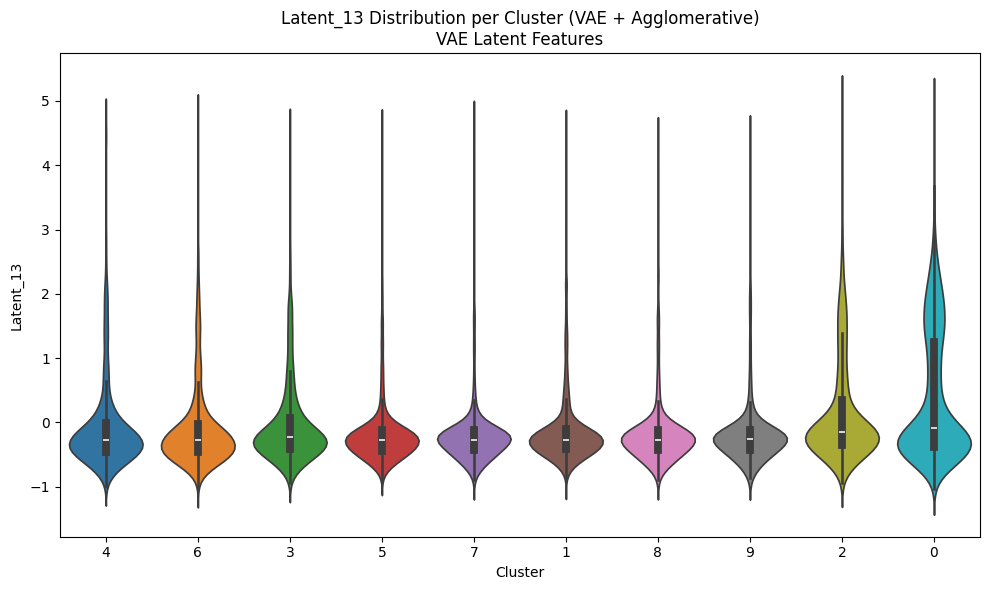

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




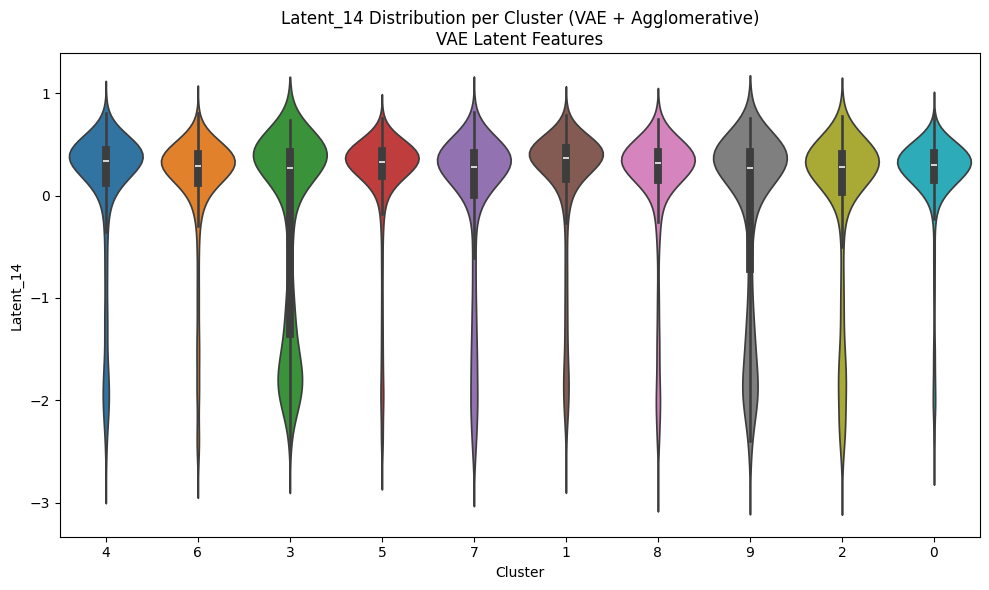

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




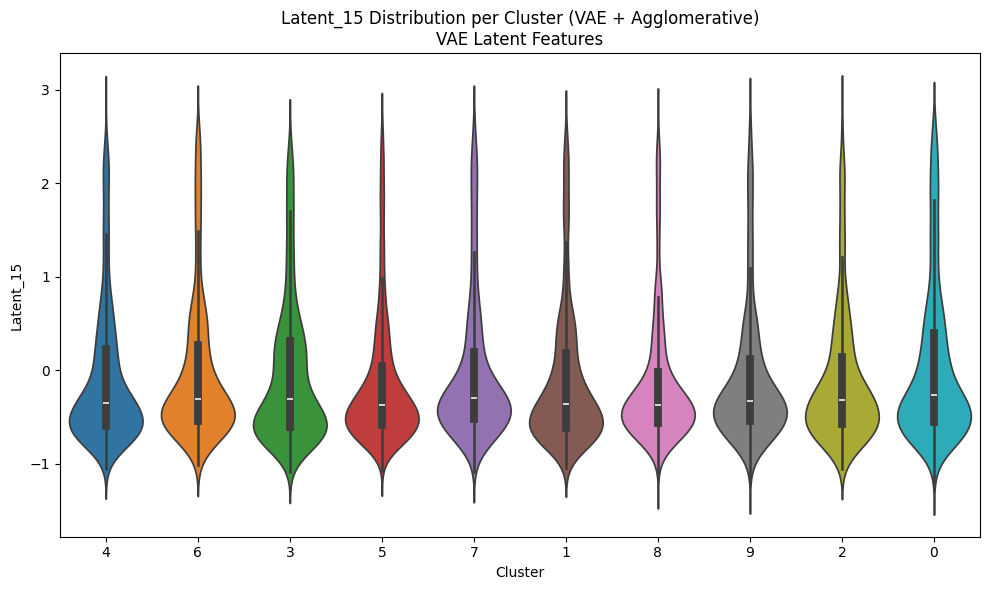

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




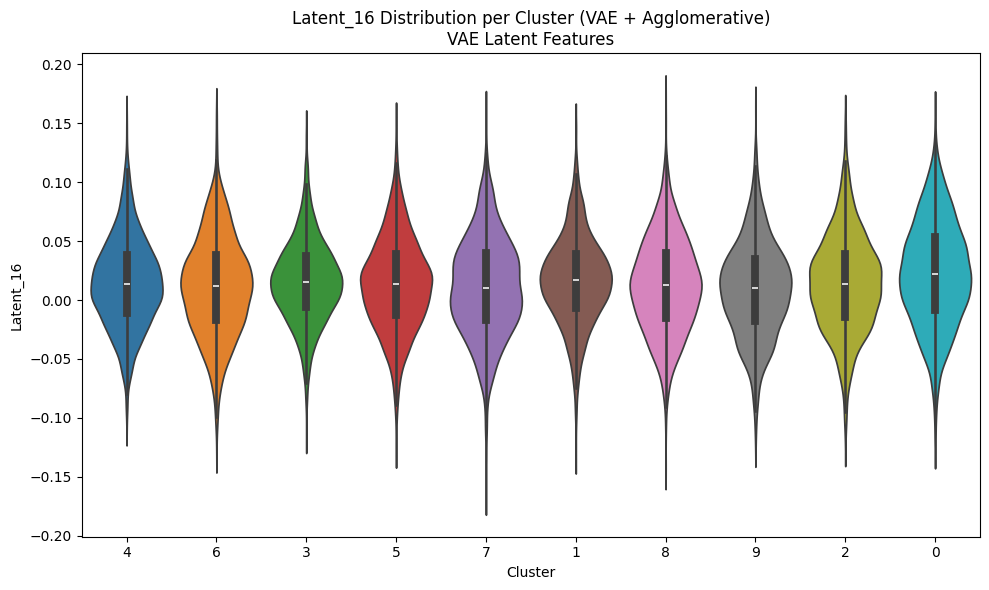

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




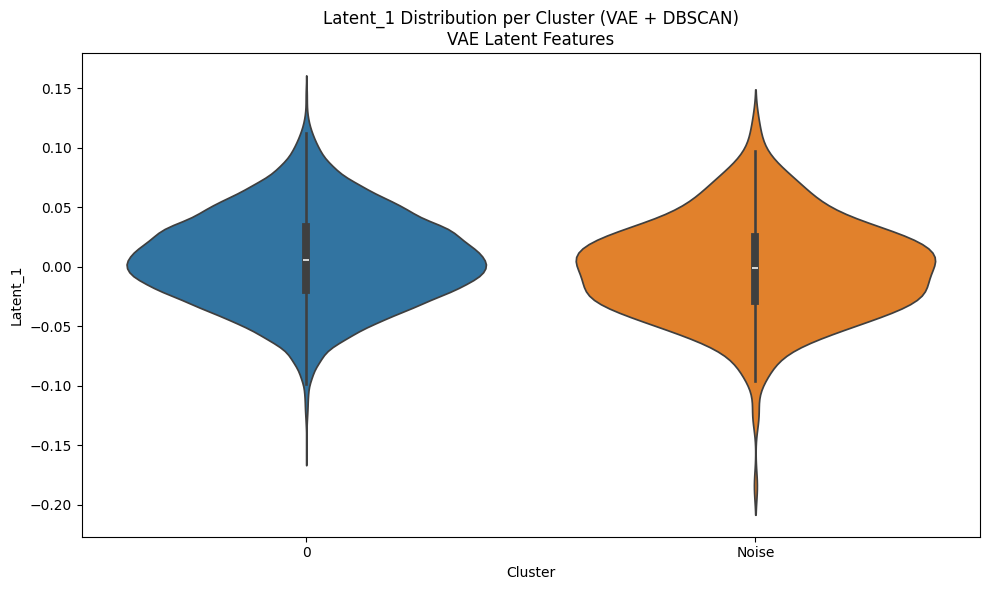

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




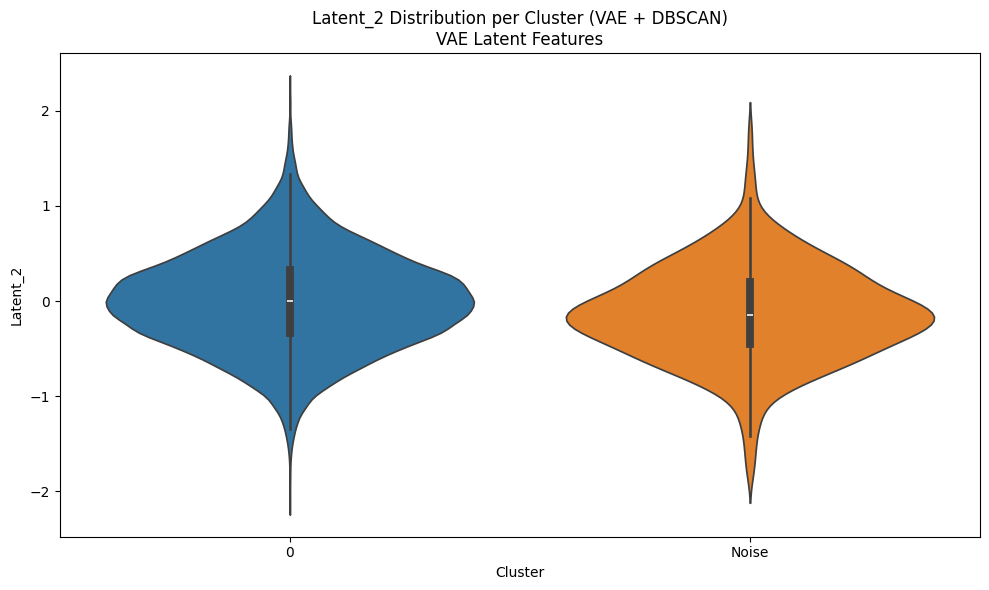

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




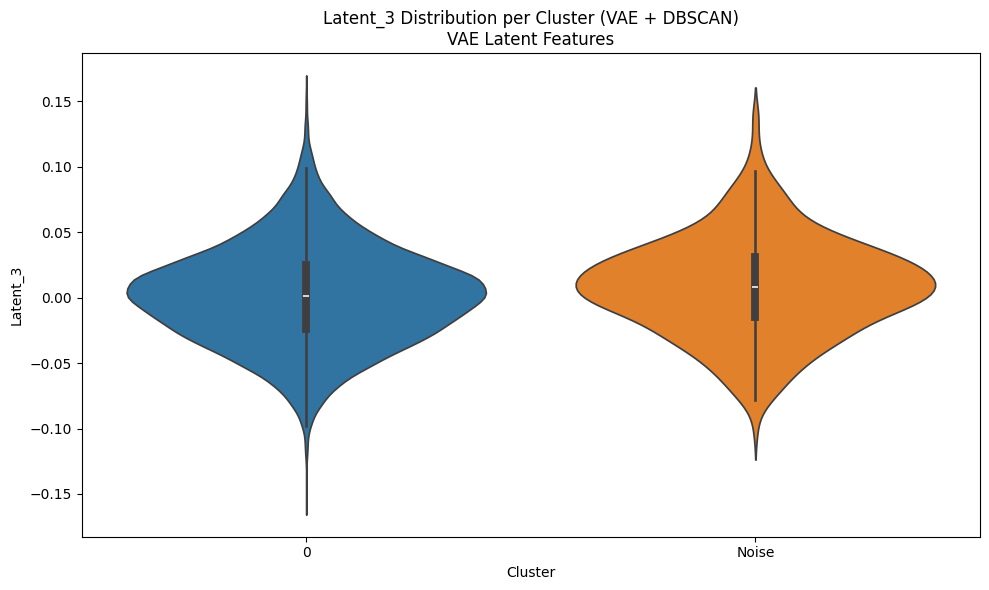

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




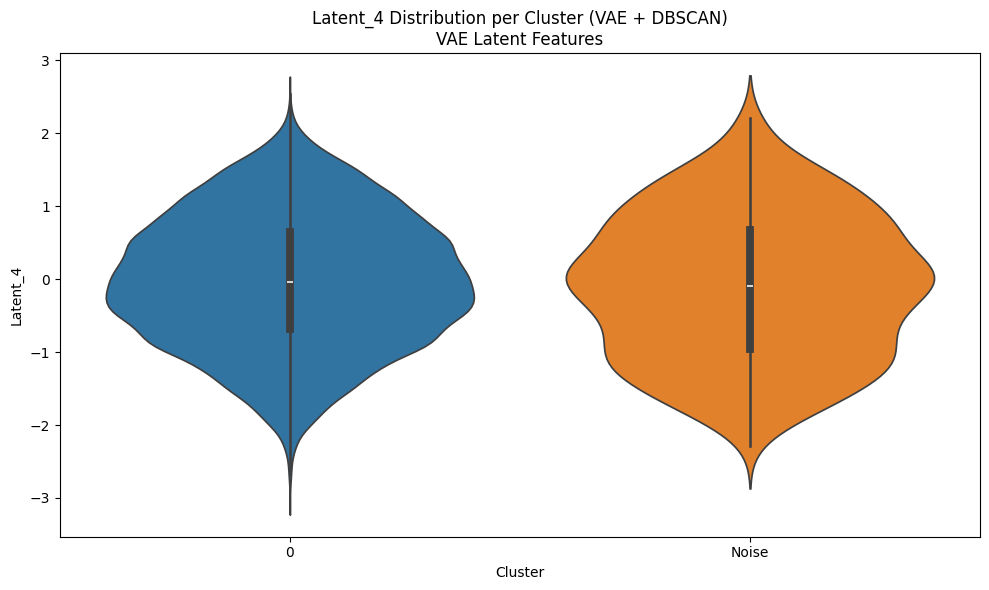

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




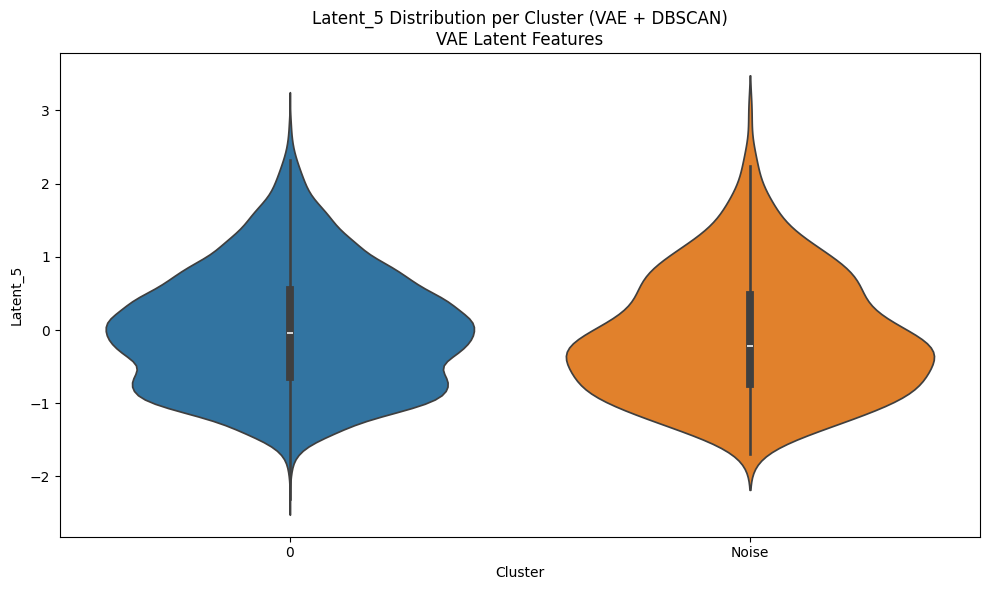

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




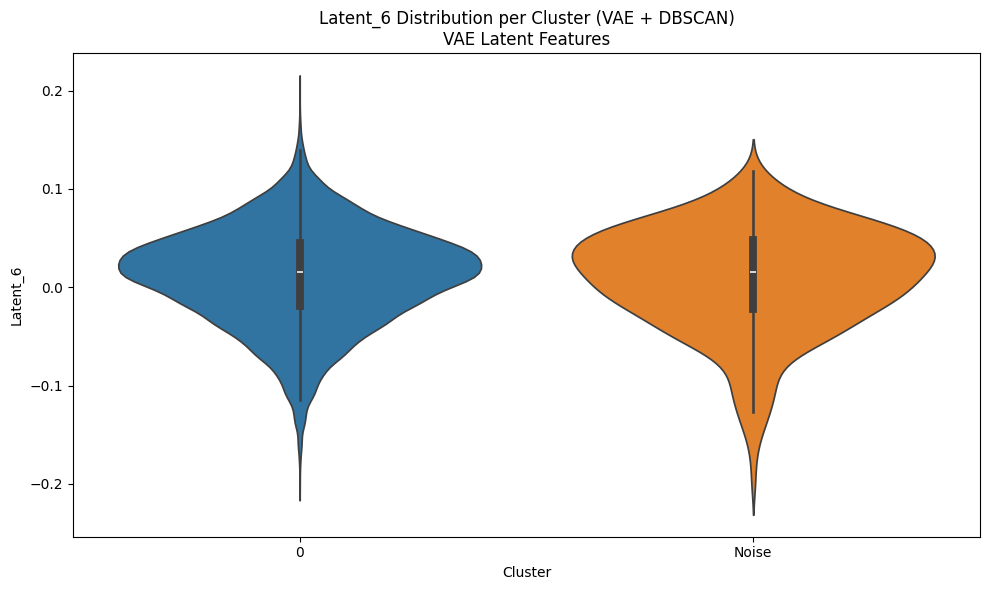

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




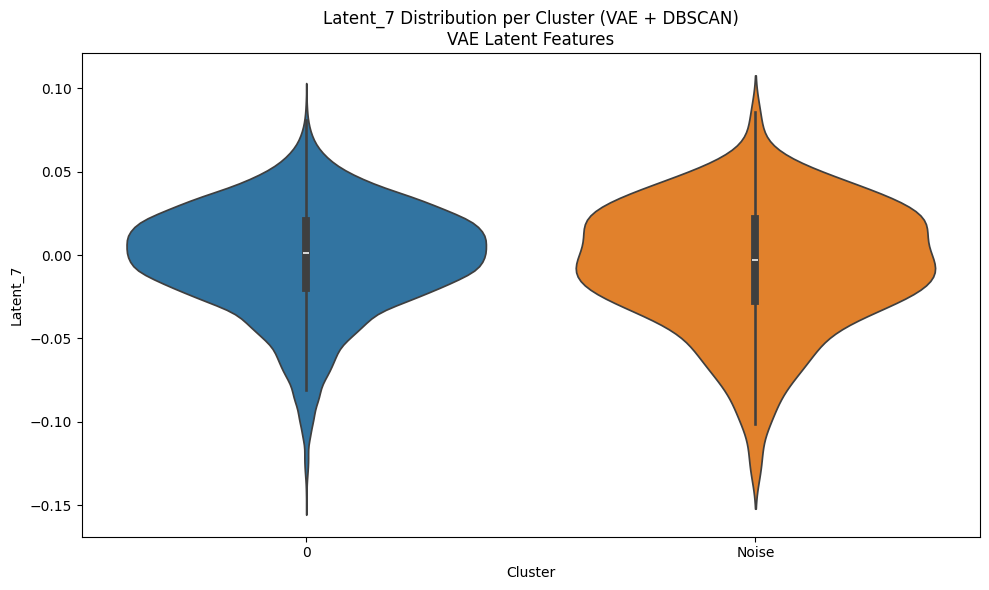

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




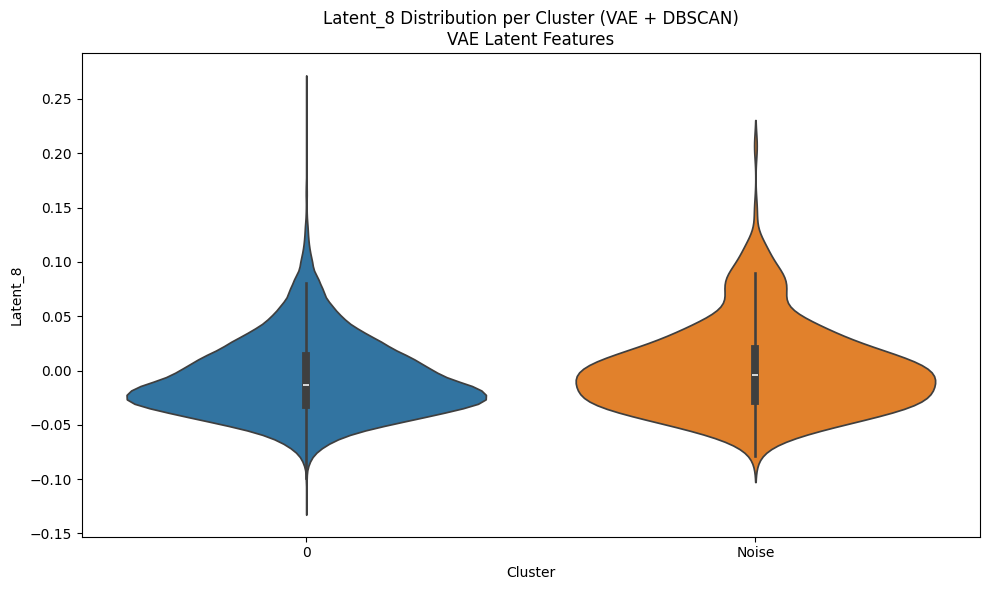

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




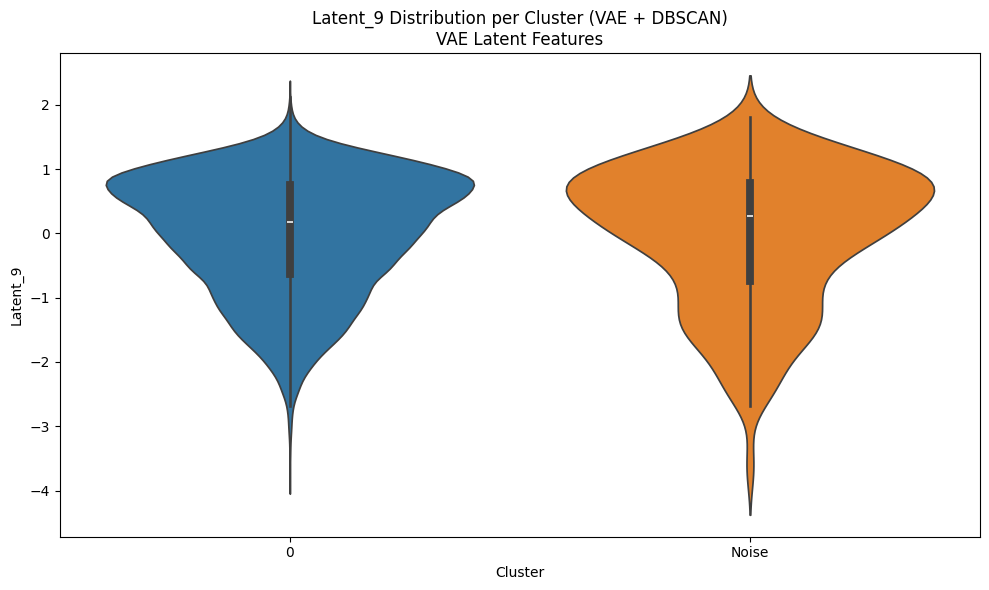

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




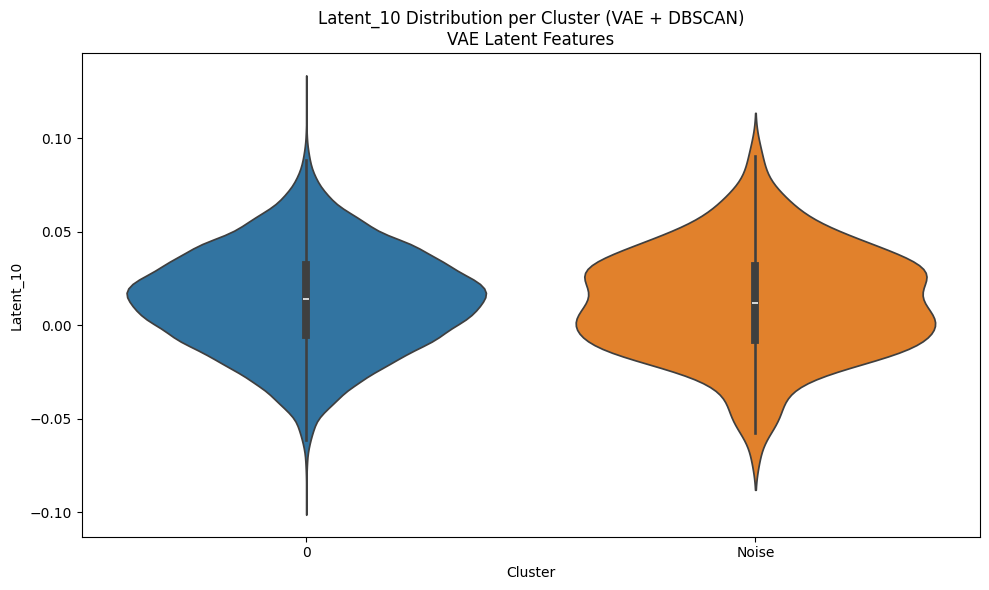

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




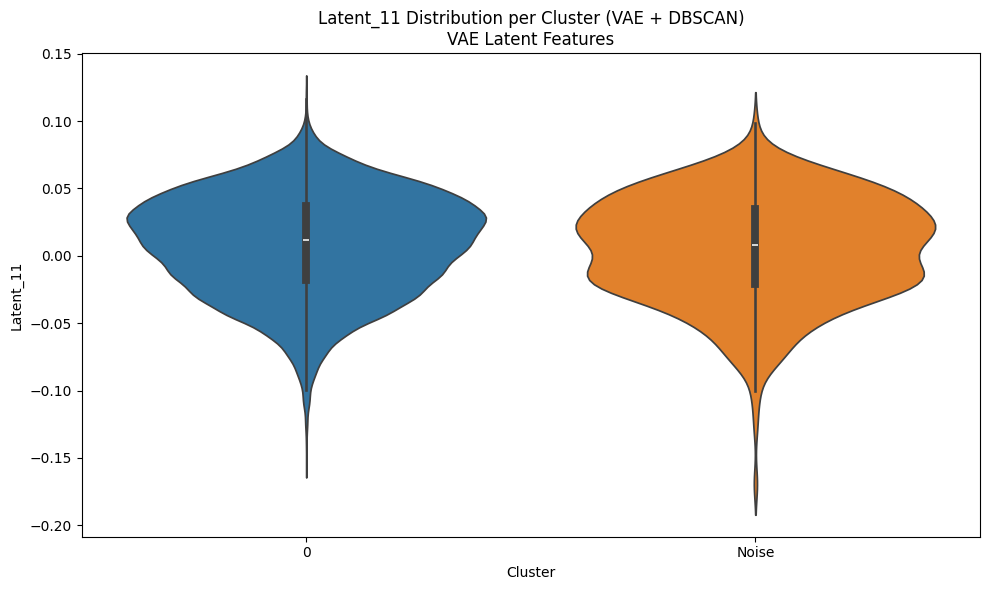

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




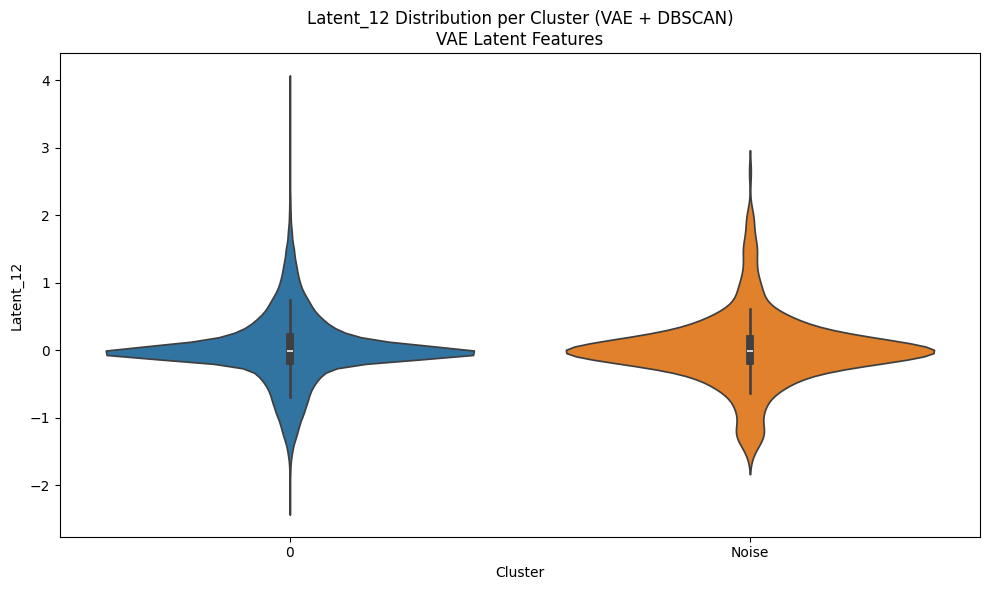

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




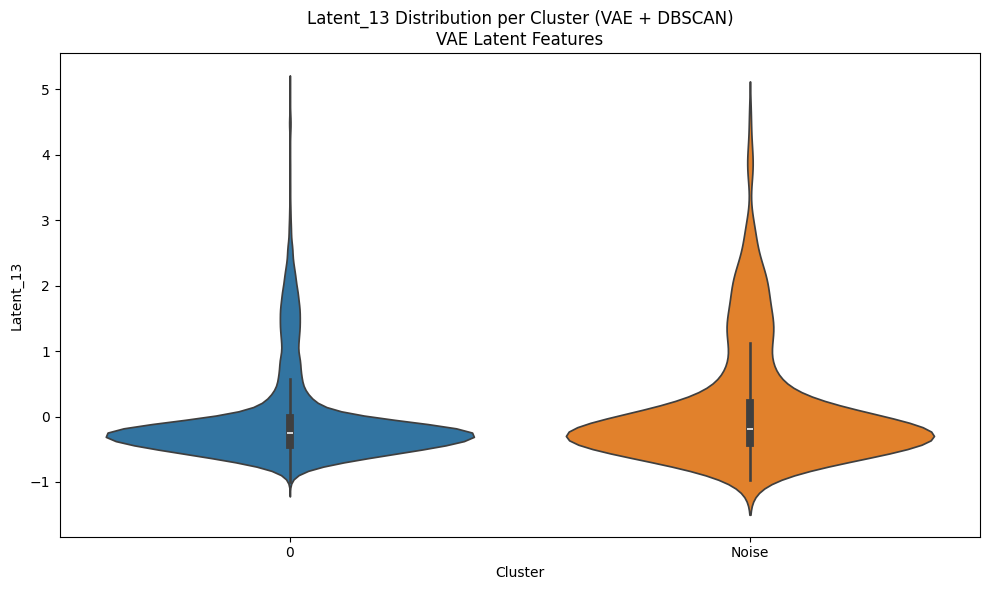

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




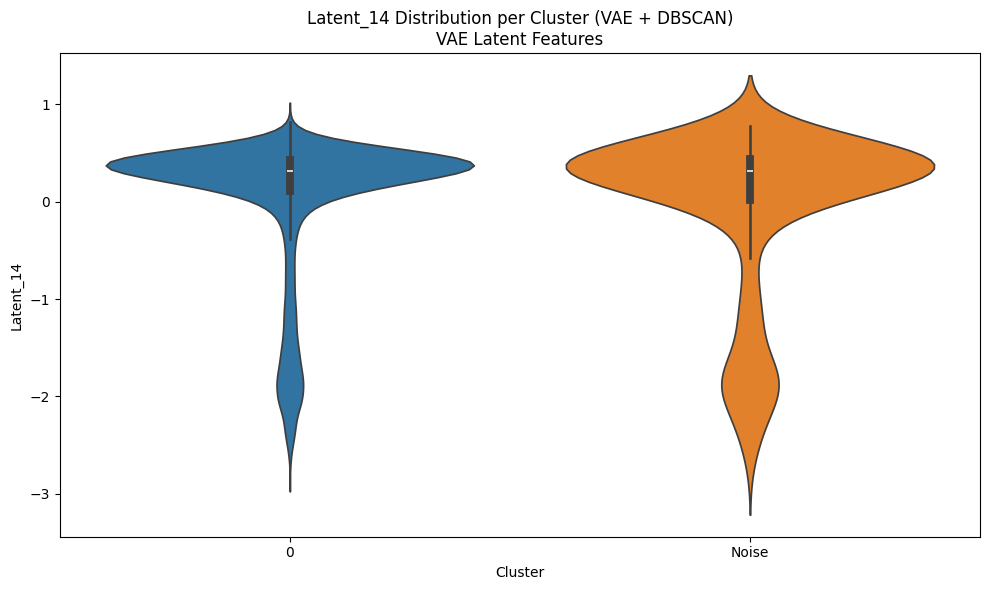

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




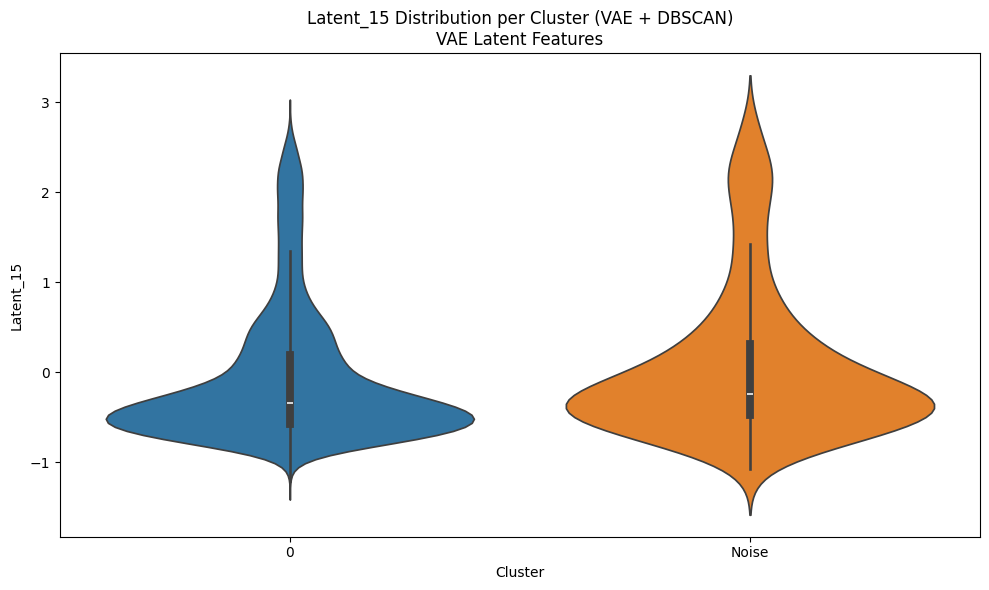

/tmp/ipykernel_55/1824125073.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




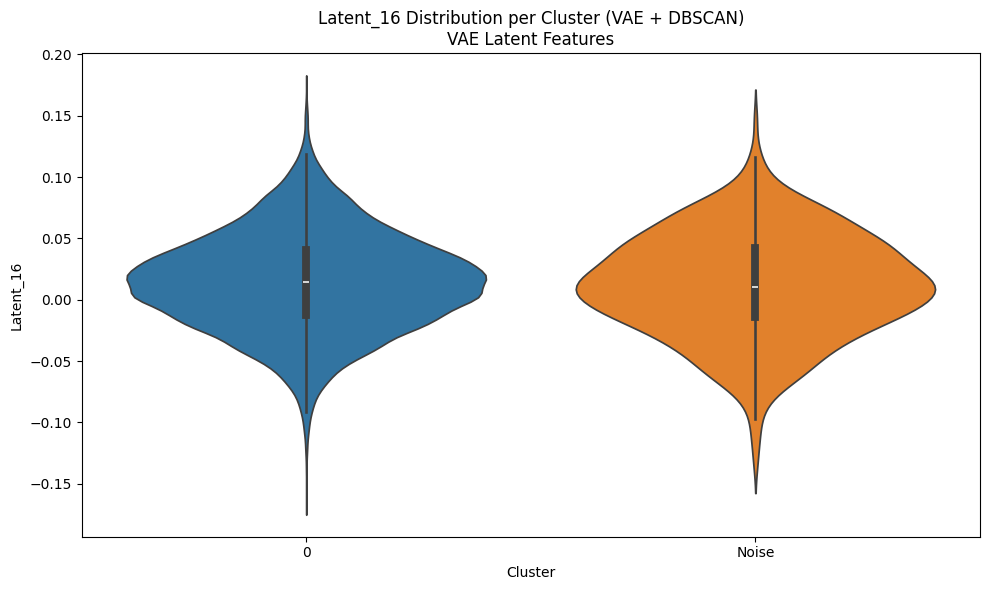

In [ ]:
def plot_violin_feature_per_cluster_vae(z_latent, clusters, method_name="KMeans"):
    
    # Convert clusters to string (for plotting and handle DBSCAN noise)
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Convert latent features to DataFrame
    latent_df = pd.DataFrame(z_latent, columns=[f"Latent_{i+1}" for i in range(z_latent.shape[1])])
    latent_df["Cluster"] = clusters_str
    
    # Plot each latent dimension
    for feat in latent_df.columns[:-1]:  
        plt.figure(figsize=(10,6))
        sns.violinplot(x="Cluster", y=feat, data=latent_df, palette="tab10")
        plt.title(f"{feat} Distribution per Cluster ({method_name})\nVAE Latent Features")
        plt.xlabel("Cluster")
        plt.ylabel(feat)
        plt.tight_layout()
        plt.show()

# Apply for all VAE clustering results 
for method_name, labels in results.items():
    plot_violin_feature_per_cluster_vae(z_audio, labels, method_name=f"VAE + {method_name}")

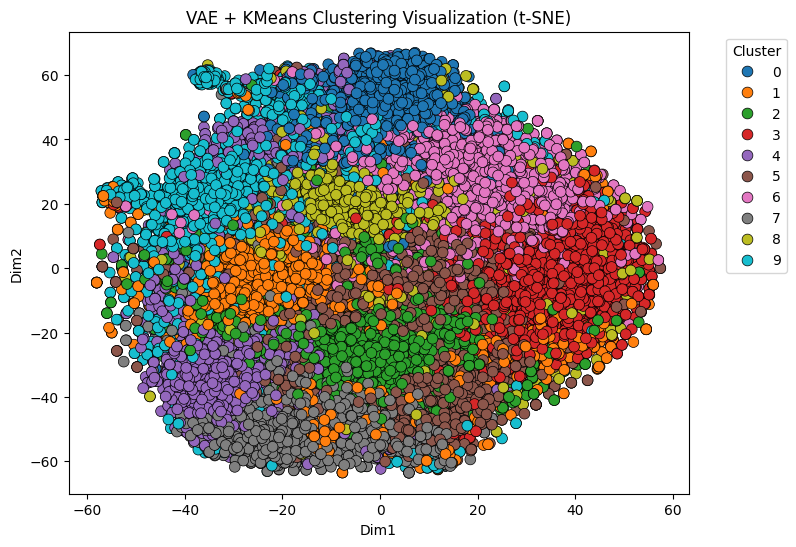

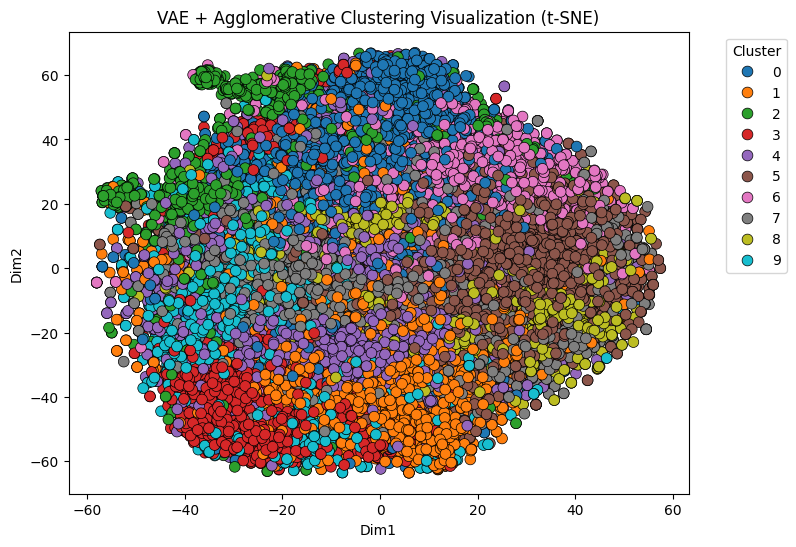

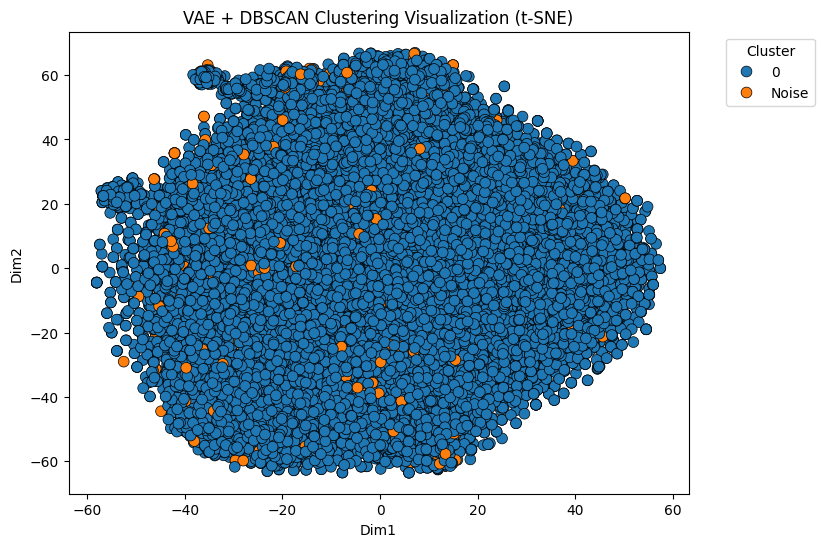

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


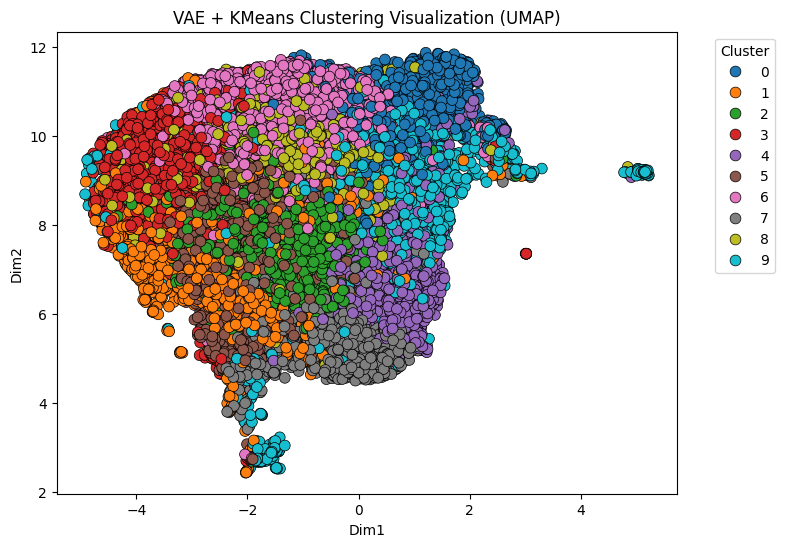

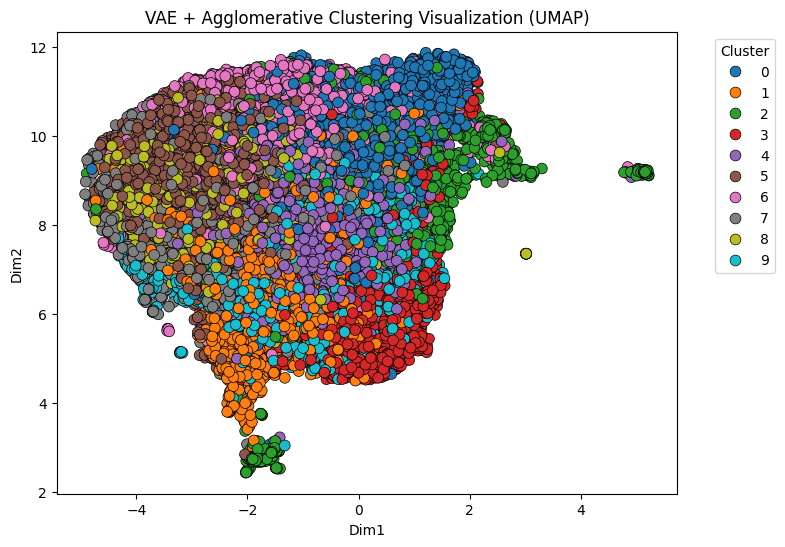

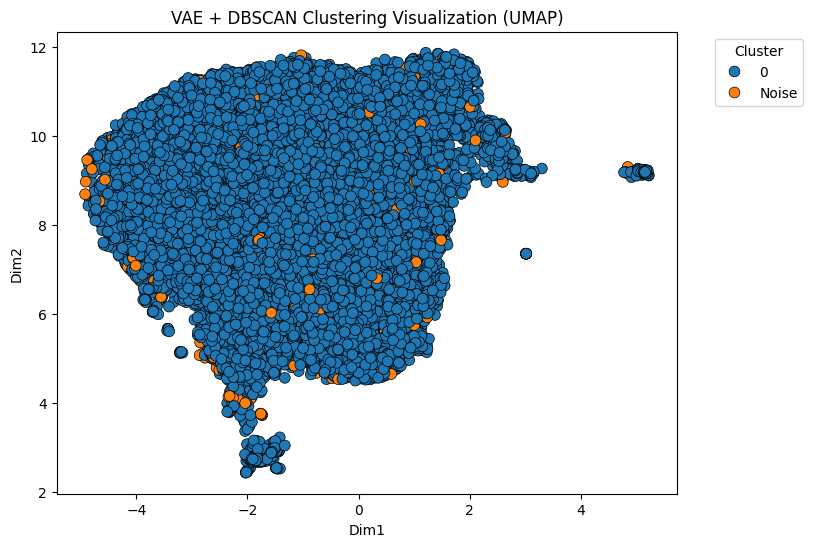

In [50]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns

def plot_scatter(X_2d, labels, method_name, reducer_name="t-SNE"):
    # Replace -1 (DBSCAN noise) with "Noise" and convert others to string
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])
    
    # get sorted unique cluster labels for legend order
    unique_labels = sorted(np.unique(labels_str))
    
    df_plot = pd.DataFrame({
        'Dim1': X_2d[:, 0],
        'Dim2': X_2d[:, 1],
        'Cluster': labels_str
    })
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=df_plot, 
        x='Dim1', 
        y='Dim2', 
        hue='Cluster',
        hue_order=unique_labels,  # ordered legend
        palette='tab10', 
        edgecolor='black', 
        linewidth=0.5,
        s=60
    )
    plt.title(f"VAE + {method_name} Clustering Visualization ({reducer_name})")
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# t-SNE
tsne = TSNE(n_components=2, perplexity=50, random_state=42)
X_tsne = tsne.fit_transform(X_cluster)

for name, labels in results.items():
    plot_scatter(X_tsne, labels, name, reducer_name="t-SNE")

# UMAP
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = reducer.fit_transform(X_cluster)

for name, labels in results.items():
    plot_scatter(X_umap, labels, name, reducer_name="UMAP")


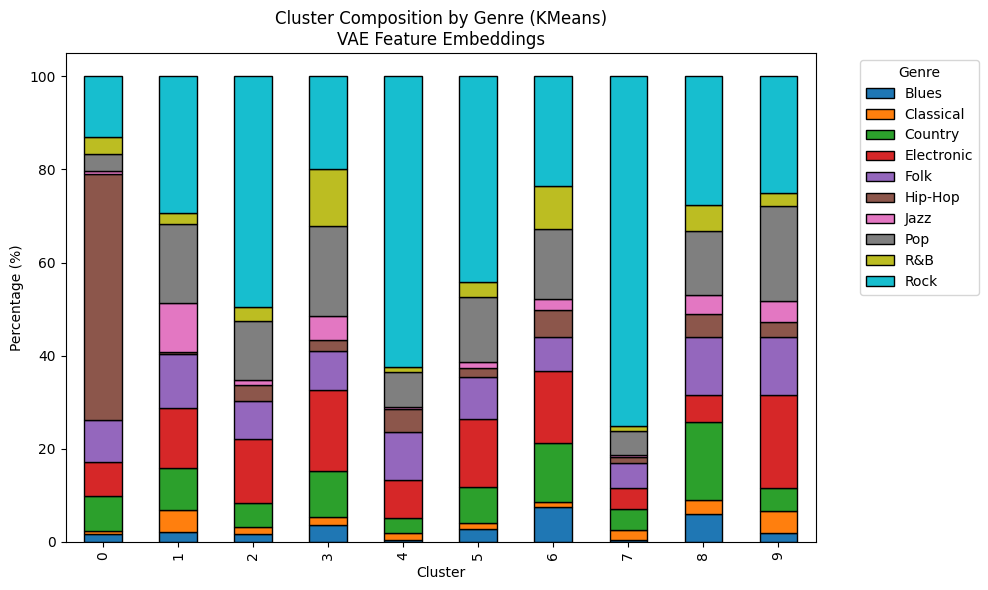


 Cluster Composition Counts (KMeans) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0           38         14      166         161   194     1164    13   82   78   
1           49        109      209         298   270        8   246  396   52   
2           45         44      146         378   232       91    32  354   80   
3          127         56      347         613   292       85   179  674  428   
4            7         28       58         149   184       89    10  135   19   
5           83         40      235         440   269       58    43  420   99   
6          231         29      392         472   225      178    74  458  286   
7            8         47       99         100   121       27    10  113   25   
8          102         52      290          97   215       87    67  237   96   
9           45        115      116         473   297       79   110  4

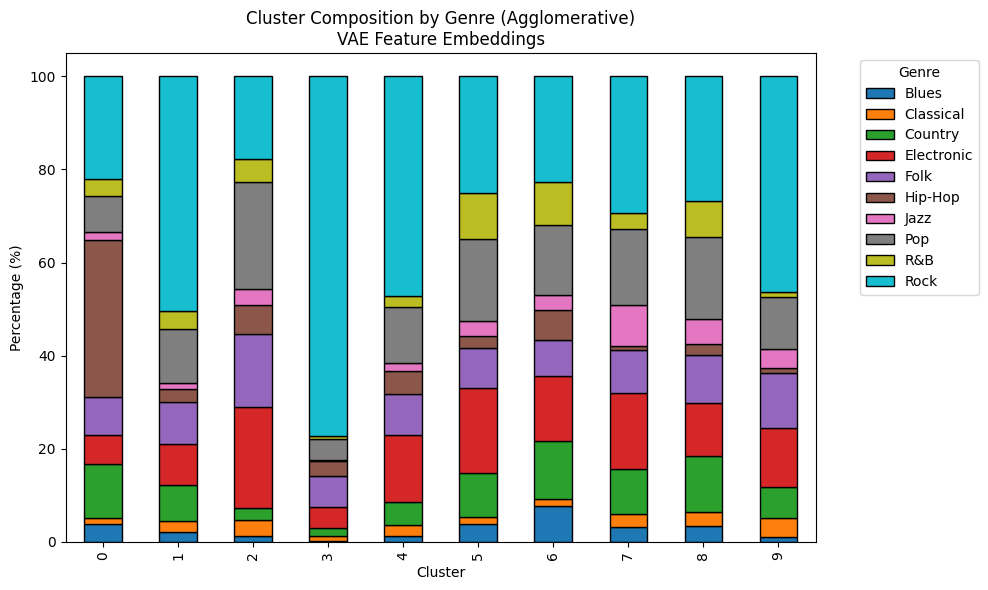


 Cluster Composition Counts (Agglomerative) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0          130         46      398         209   277     1152    62  262  127   
1           64         71      237         274   274       84    40  357  115   
2           20         58       40         357   260      101    58  378   79   
3            6         21       37          94   145       67     8   97   10   
4           34         57      127         371   222      130    40  311   61   
5          157         63      399         761   351      106   134  738  407   
6          170         32      276         307   170      145    70  331  204   
7           79         69      236         403   230       22   216  405   80   
8           56         45      195         182   163       40    84  282  127   
9           19         72      113         223   207       19  

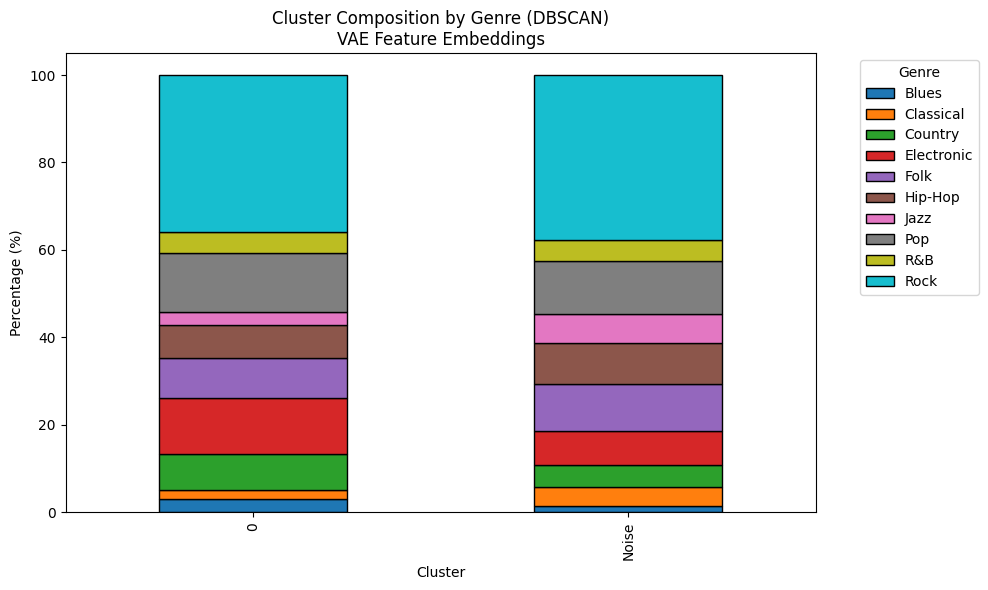


 Cluster Composition Counts (DBSCAN) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          729        515     2037        3148  2253     1826   755  3304   
Noise        6         19       21          33    46       40    29    51   

Genre     R&B  Rock  
Cluster              
0        1207  8799  
Noise      21   161  

 Cluster Composition Percentages (DBSCAN) 
Genre       Blues  Classical   Country  Electronic       Folk   Hip-Hop  \
Cluster                                                                   
0        2.966671   2.095796  8.289586   12.810809   9.168600  7.430920   
Noise    1.405152   4.449649  4.918033    7.728337  10.772834  9.367681   

Genre        Jazz        Pop       R&B       Rock  
Cluster                                            
0        3.072478  13.445652  4.911895  35.807594  
Noise    6.791569  11.943794  4.918033  37.704918  


In [ ]:
import pandas as pd
import numpy as np

def cluster_composition(clusters, method_name="KMeans", le=None):
    # Convert clusters to string for consistent labeling
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels  
    
    # Make a DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot
    cluster_percent.plot(kind='bar', stacked=True, figsize=(10,6), colormap='tab10', edgecolor='black')
    plt.title(f"Cluster Composition by Genre ({method_name})\nVAE Feature Embeddings")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"\n Cluster Composition Counts ({method_name}) ")
    print(cluster_counts)
    print(f"\n Cluster Composition Percentages ({method_name}) ")
    print(cluster_percent)

for name, labels in results.items():
    cluster_composition(labels, method_name=name, le=le)


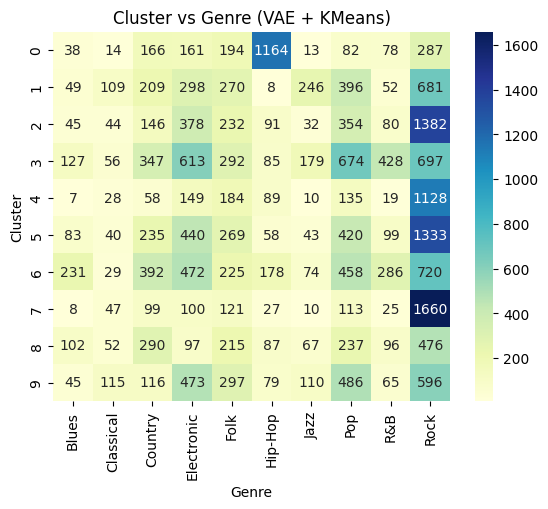

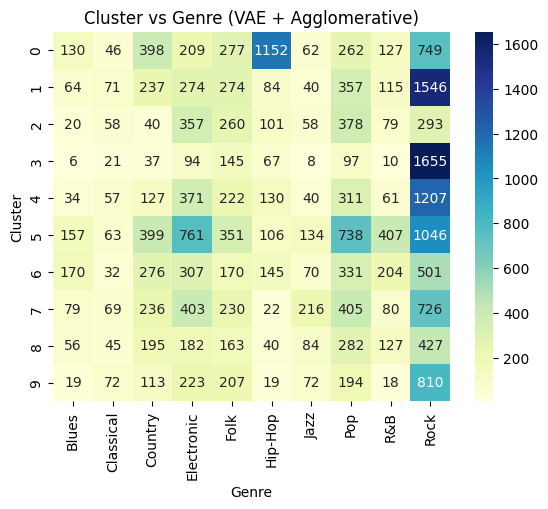

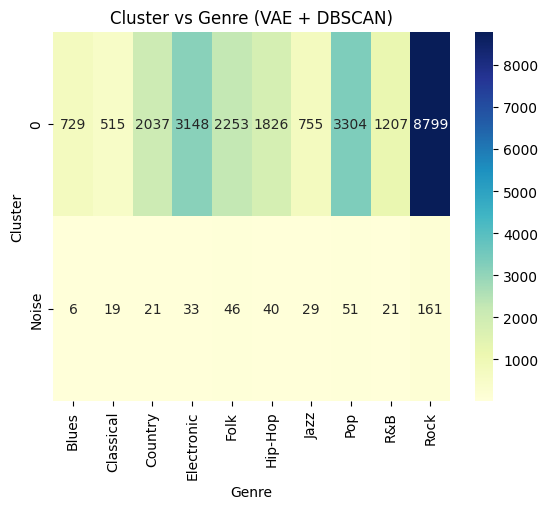

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()

for name, labels in results.items():
    cluster_heatmap(labels, f"VAE + {name}")

## For Baseline 

In [55]:
# Dictionary to store true feature clustering results
results_true = {}

# KMeans
results_true["KMeans"] = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X_hybrid_scaled)

# Agglomerative
results_true["Agglomerative"] = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X_hybrid_scaled)

# DBSCAN requires lower dimension, so use PCA
pca_true = PCA(n_components=5, random_state=42)
X_true_db = pca_true.fit_transform(X_hybrid_scaled)
results_true["DBSCAN"] = DBSCAN(eps=2.5, min_samples=5).fit_predict(X_true_db)

In [56]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

print(" Baseline Hybrid Feature Clustering Metrics ")

for name, labels in results_true.items():
    
    if name == "DBSCAN":
        # For DBSCAN, ignore noise points (-1)
        mask = labels != -1
        X_eval = X_true_db  # PCA-reduced features for DBSCAN
        if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
            sil = silhouette_score(X_eval[mask], labels[mask])
            dbi = davies_bouldin_score(X_eval[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:
        X_eval = X_hybrid_scaled  # full hybrid features for KMeans/Agg
        if len(np.unique(labels)) > 1:
            sil = silhouette_score(X_eval, labels)
            dbi = davies_bouldin_score(X_eval, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\n{name} (Baseline Hybrid)")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")

 Baseline Hybrid Feature Clustering Metrics 

KMeans (Baseline Hybrid)
Silhouette Score: 0.011103
Davies-Bouldin Index: 4.761227
Adjusted Rand Index: 0.048108

Agglomerative (Baseline Hybrid)
Silhouette Score: -0.009742
Davies-Bouldin Index: 5.418683
Adjusted Rand Index: 0.019349

DBSCAN (Baseline Hybrid)
Silhouette Score: 0.000000
Davies-Bouldin Index: 0.000000
Adjusted Rand Index: 0.000000


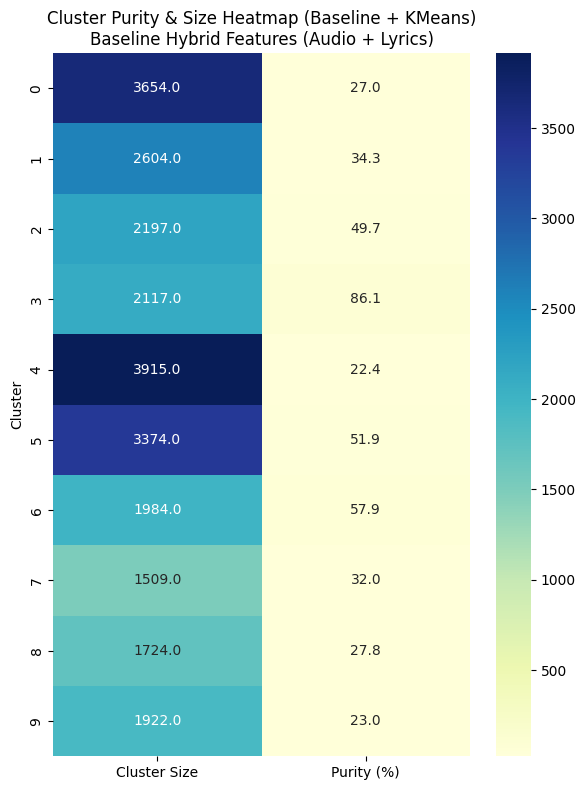


Cluster Purity & Size (Baseline + KMeans):
         Cluster Size  Purity (%)
Cluster                          
0                3654   26.984127
1                2604   34.293395
2                2197   49.704142
3                2117   86.112423
4                3915   22.401022
5                3374   51.867220
6                1984   57.913306
7                1509   32.007952
8                1724   27.784223
9                1922   23.048907


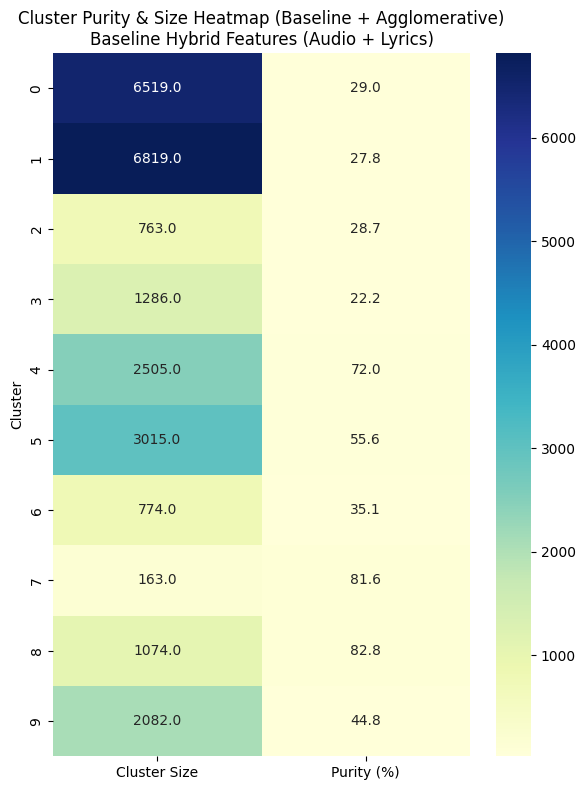


Cluster Purity & Size (Baseline + Agglomerative):
         Cluster Size  Purity (%)
Cluster                          
0                6519   28.961497
1                6819   27.775334
2                 763   28.702490
3                1286   22.239502
4                2505   72.015968
5                3015   55.621891
6                 774   35.142119
7                 163   81.595092
8                1074   82.774674
9                2082   44.764649


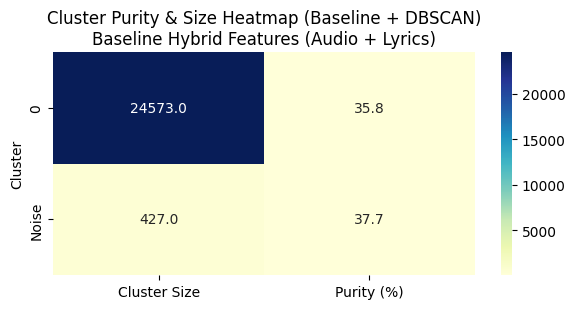


Cluster Purity & Size (Baseline + DBSCAN):
         Cluster Size  Purity (%)
Cluster                          
0               24573   35.807594
Noise             427   37.704918


In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_samples

def cluster_purity_baseline(X, clusters, true_labels, method_name="KMeans", le=None):
    # Handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true_labels to genre names
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels

    df = pd.DataFrame({"Cluster": clusters_str, "Genre": genres})
    
    # Cluster size
    cluster_size = df.groupby("Cluster").size()
    
    # Cluster purity (% of majority genre)
    cluster_purity = df.groupby("Cluster")['Genre'].apply(lambda x: x.value_counts().max() / len(x) * 100)
    
    # Combine metrics in one DataFrame
    metrics_df = pd.DataFrame({
        "Cluster Size": cluster_size,
        "Purity (%)": cluster_purity
    }).sort_index()
    
    # Plot heatmap
    plt.figure(figsize=(6, len(metrics_df)*0.6 + 2))
    sns.heatmap(metrics_df, annot=True, fmt=".1f", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster Purity & Size Heatmap ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Purity & Size ({method_name}):")
    print(metrics_df)


# Apply to all baseline hybrid clustering results 
for name, labels in results_true.items():  # results_true = baseline clustering (KMeans, Agg, DBSCAN)
    cluster_purity_baseline(X_hybrid_scaled, labels, true_labels, method_name=f"Baseline + {name}", le=le)

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




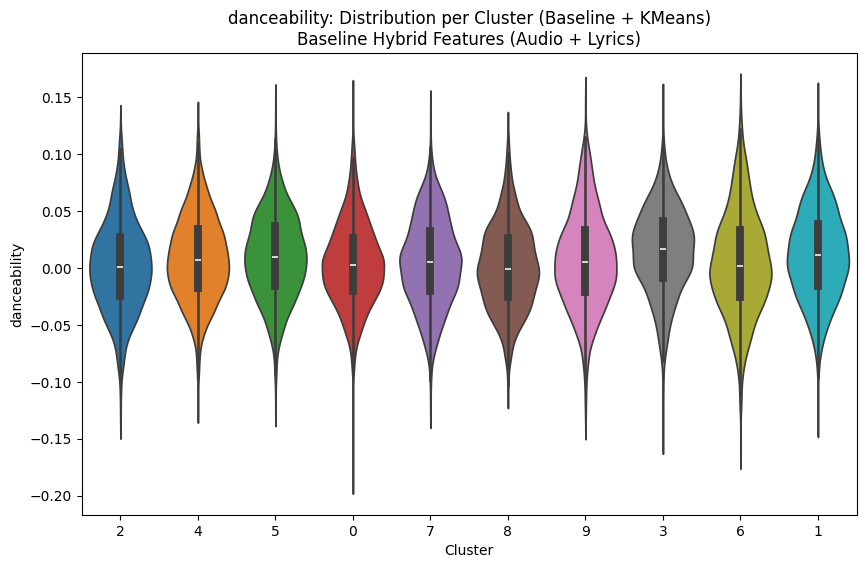

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




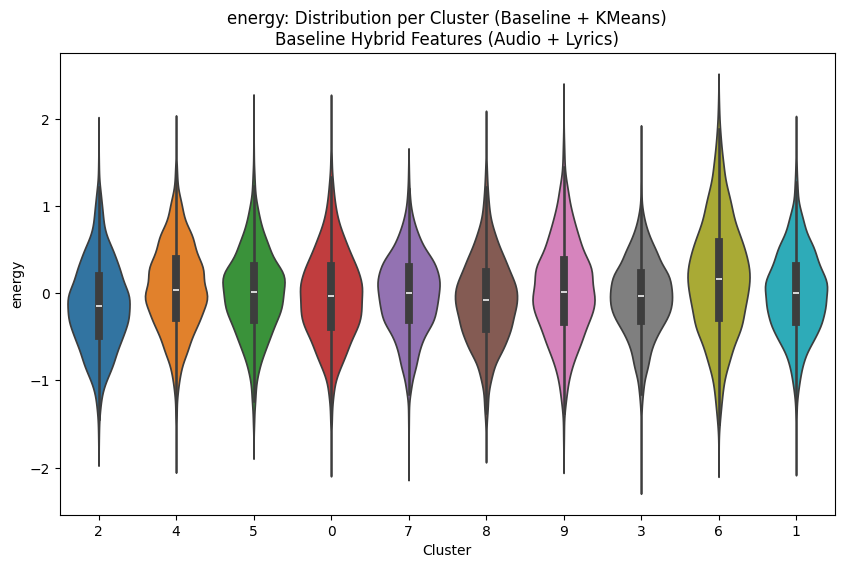

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




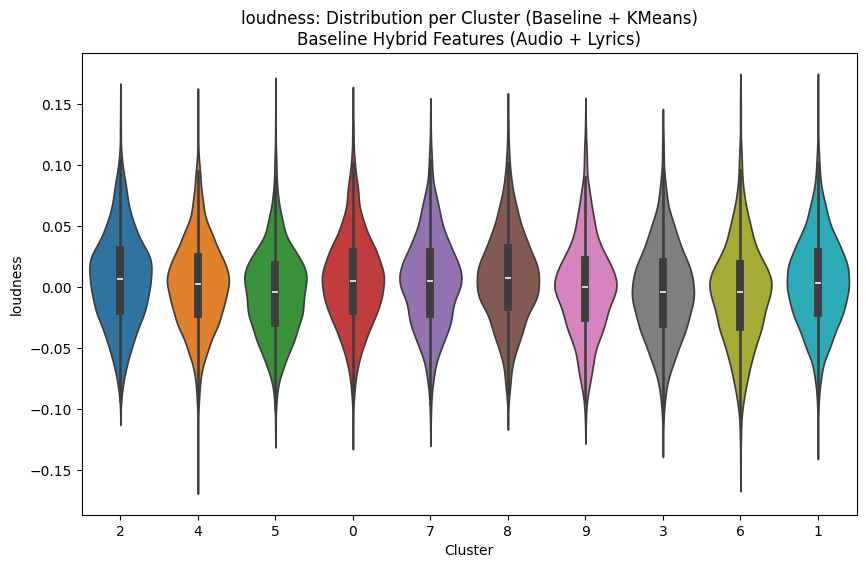

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




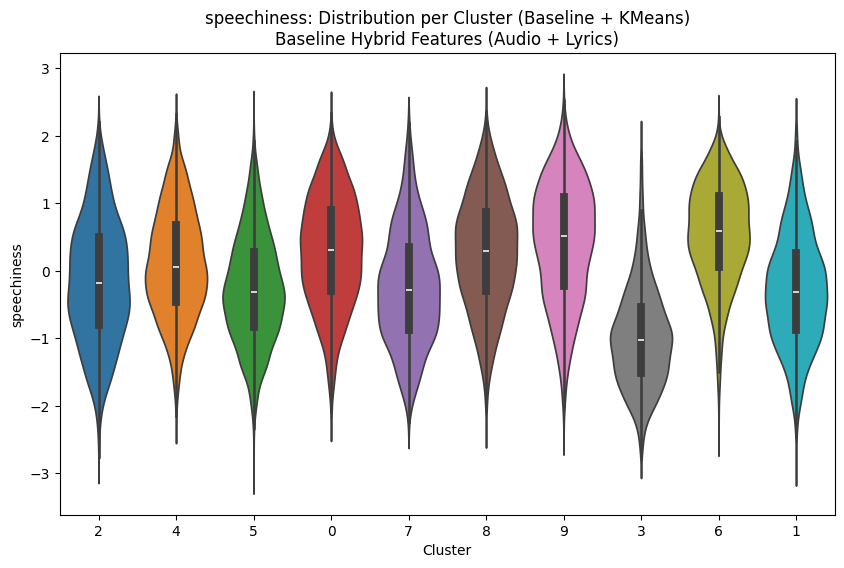

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




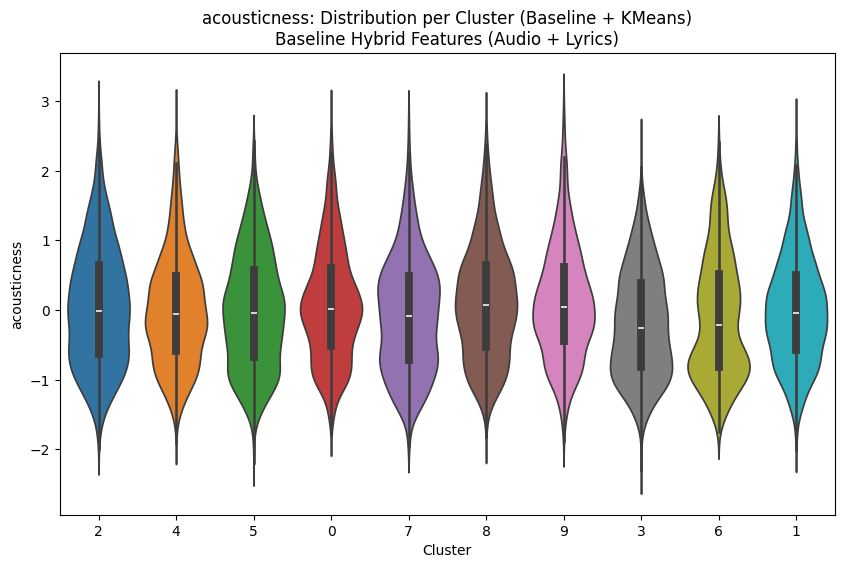

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




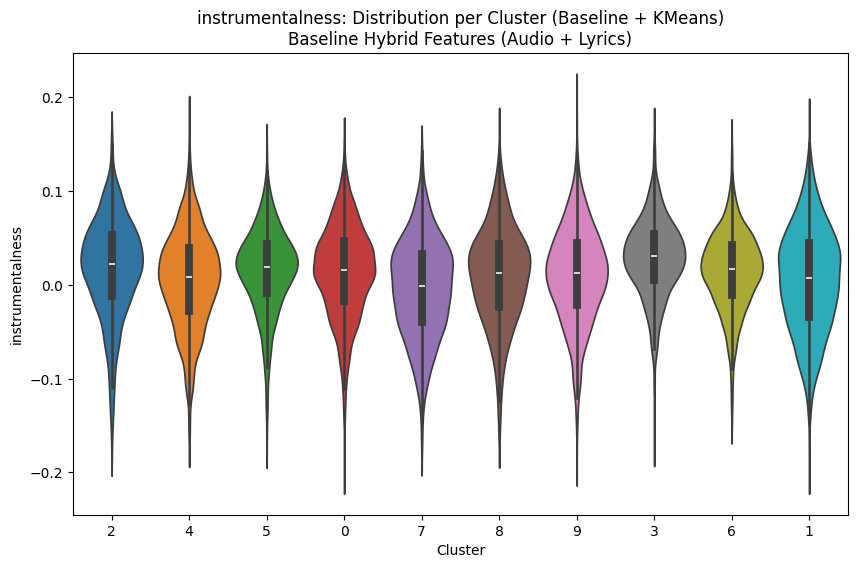

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




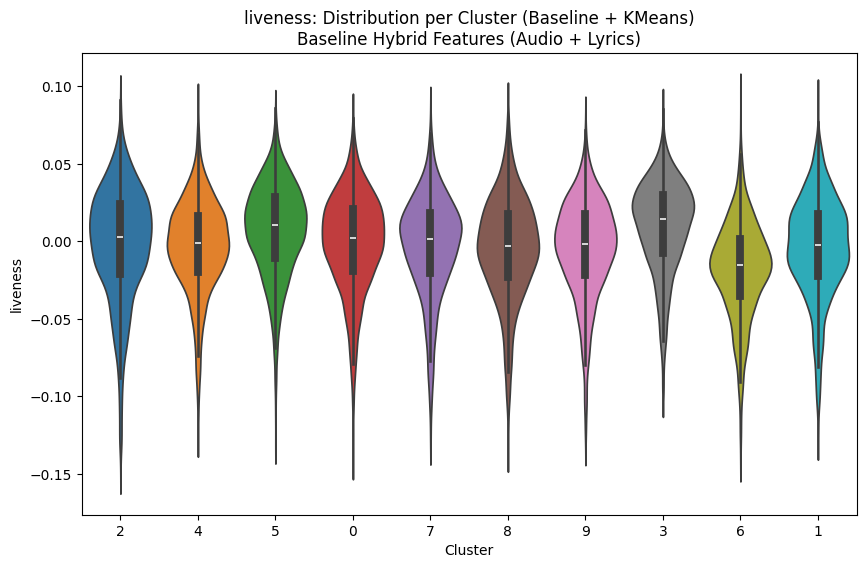

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




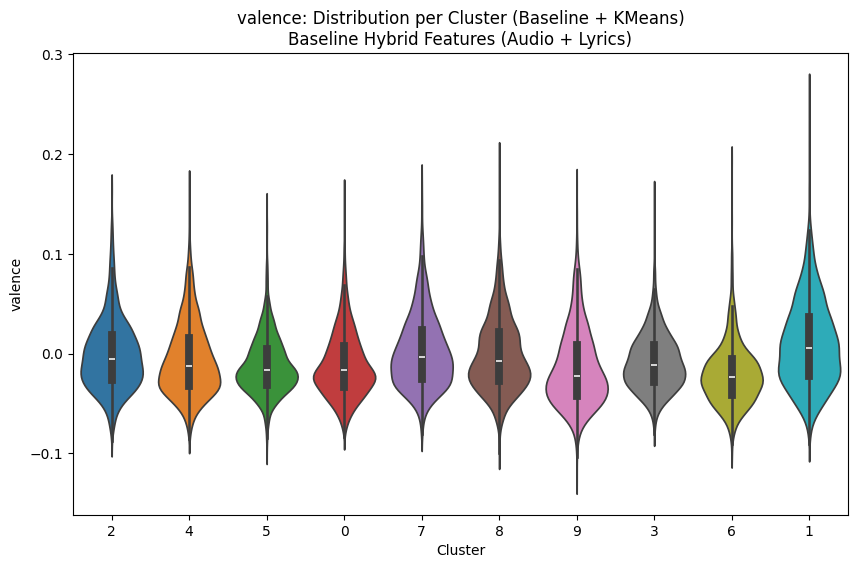

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




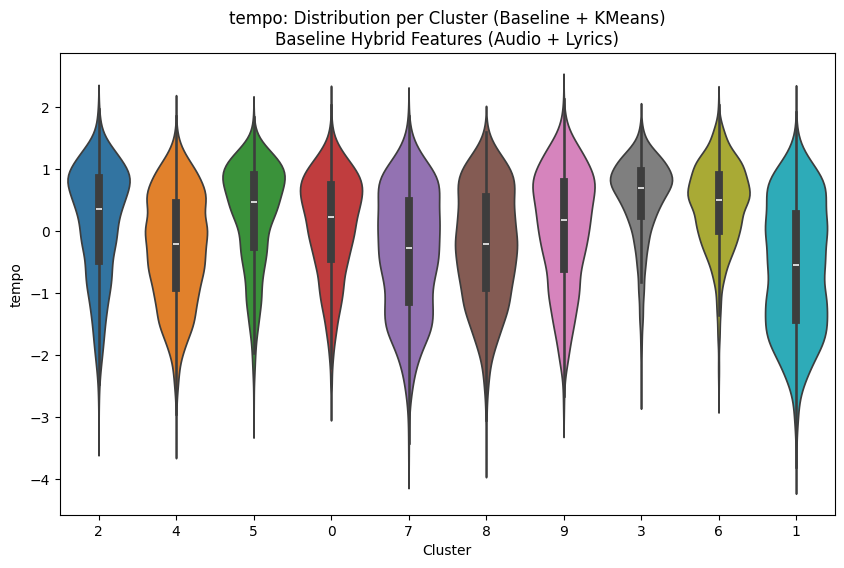

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




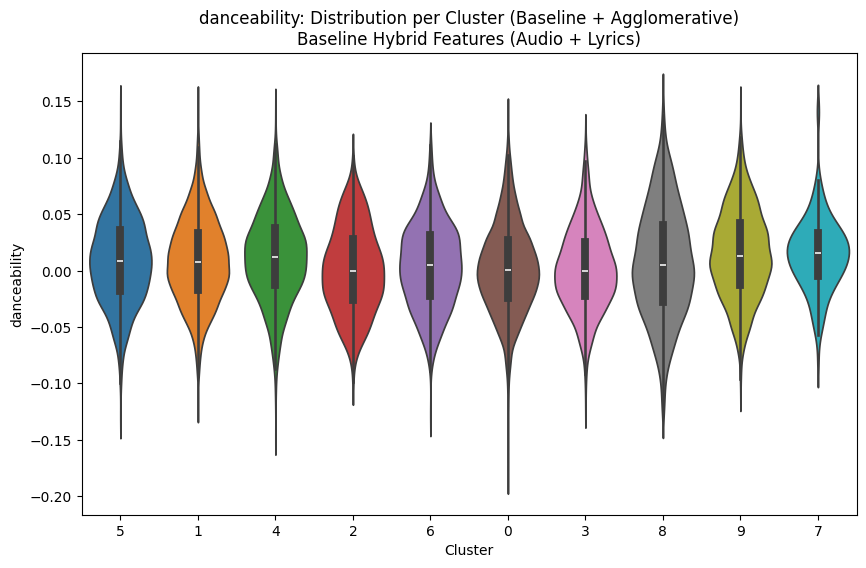

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




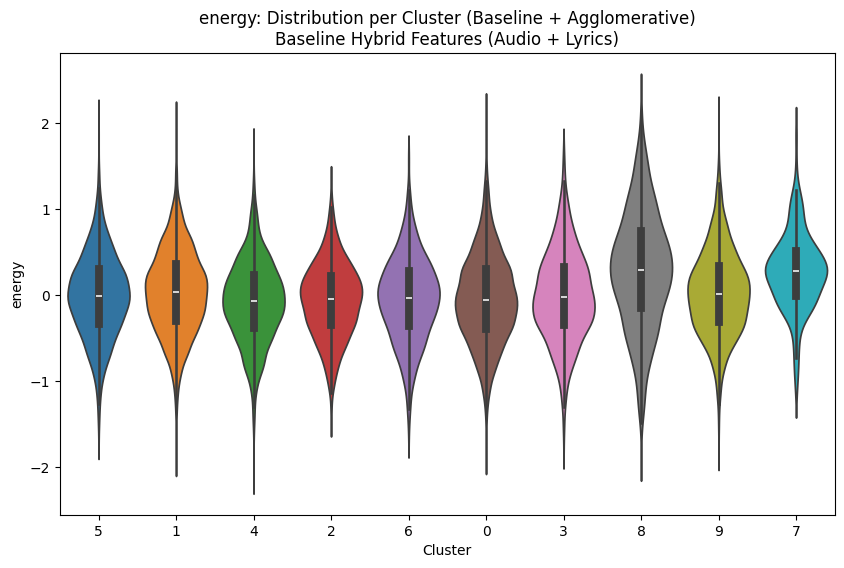

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




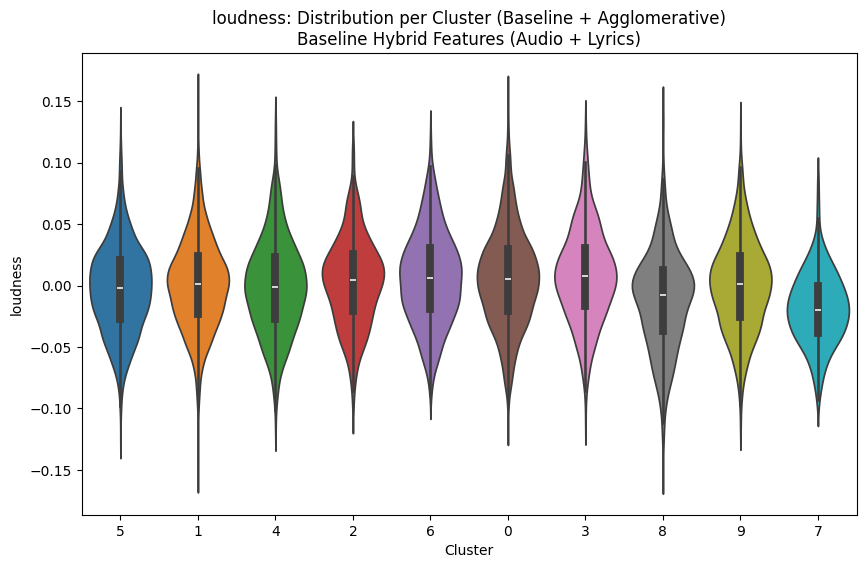

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




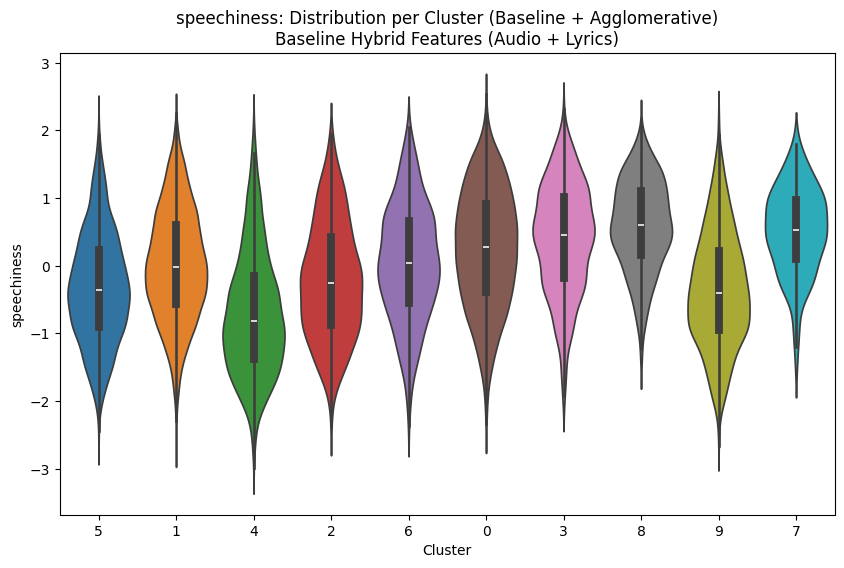

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




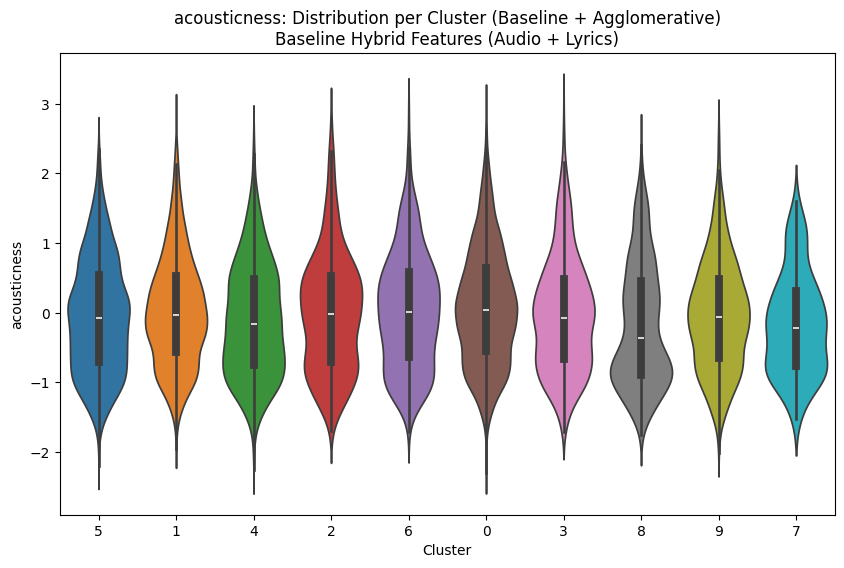

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




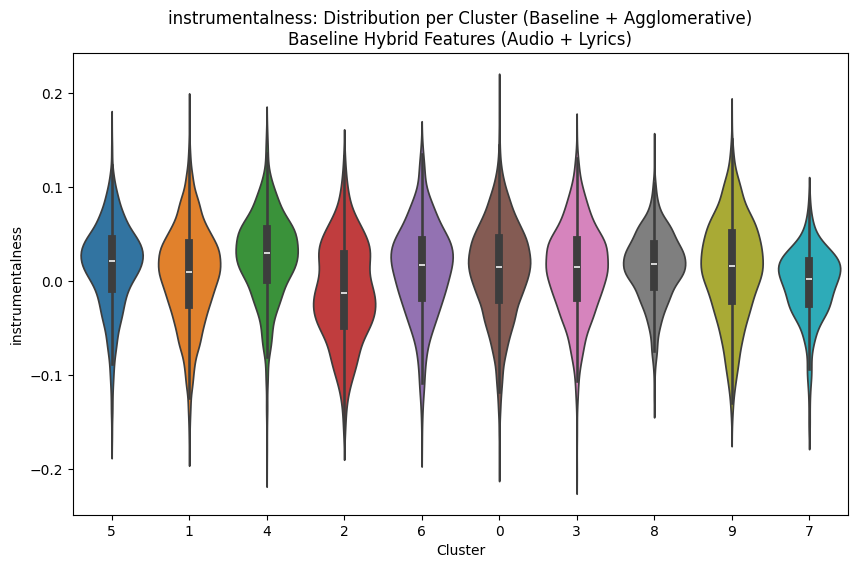

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




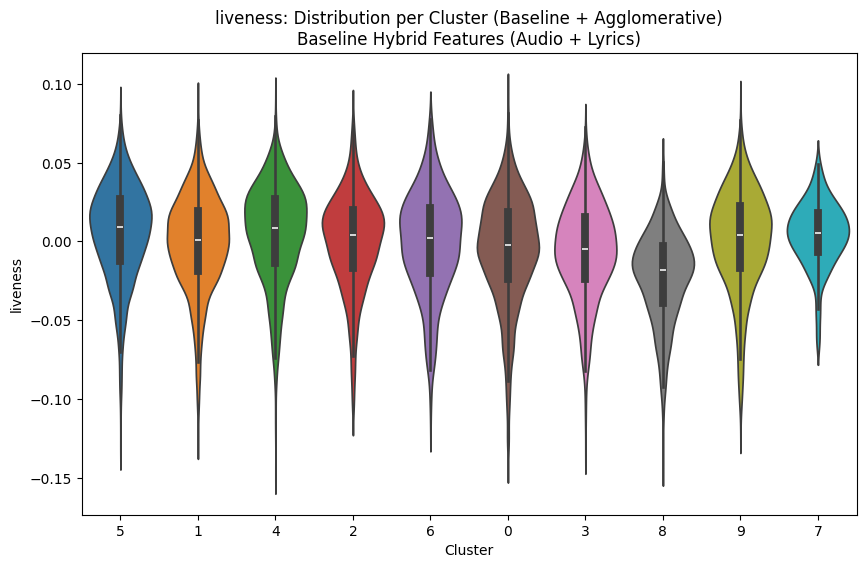

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




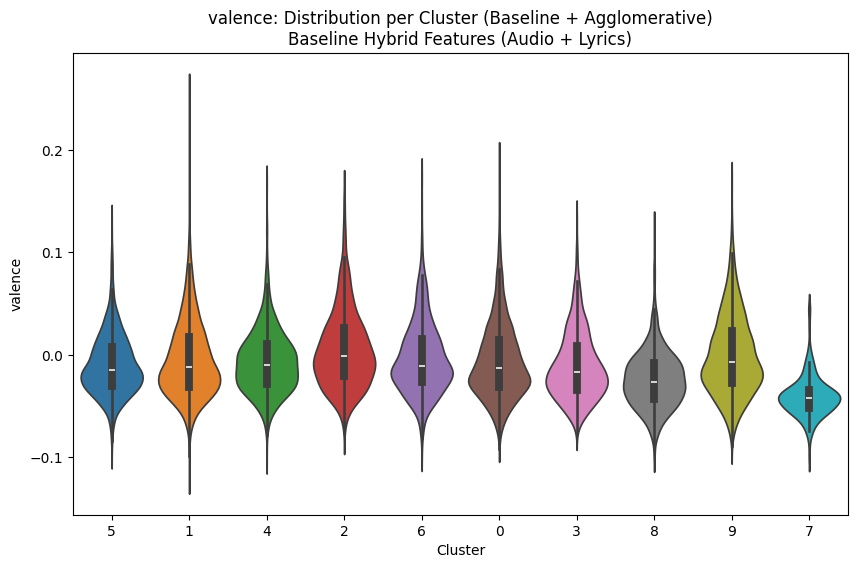

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




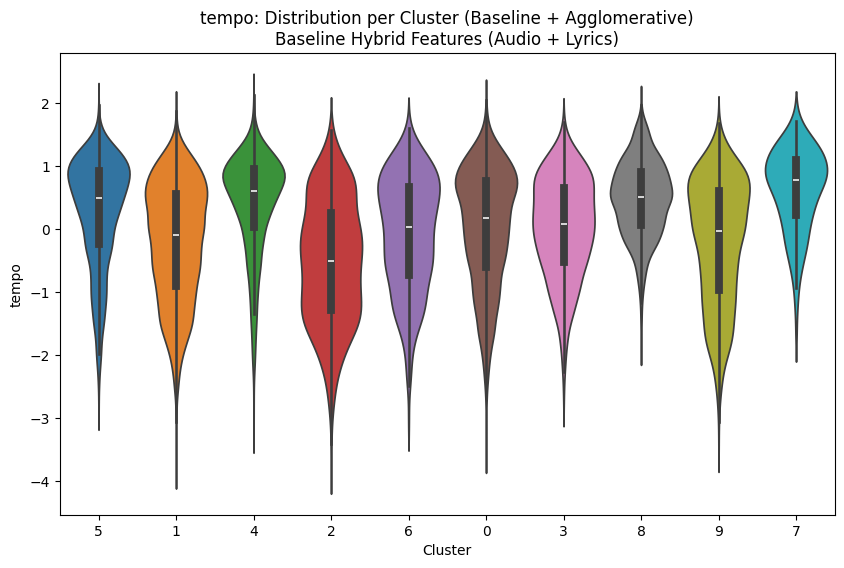

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




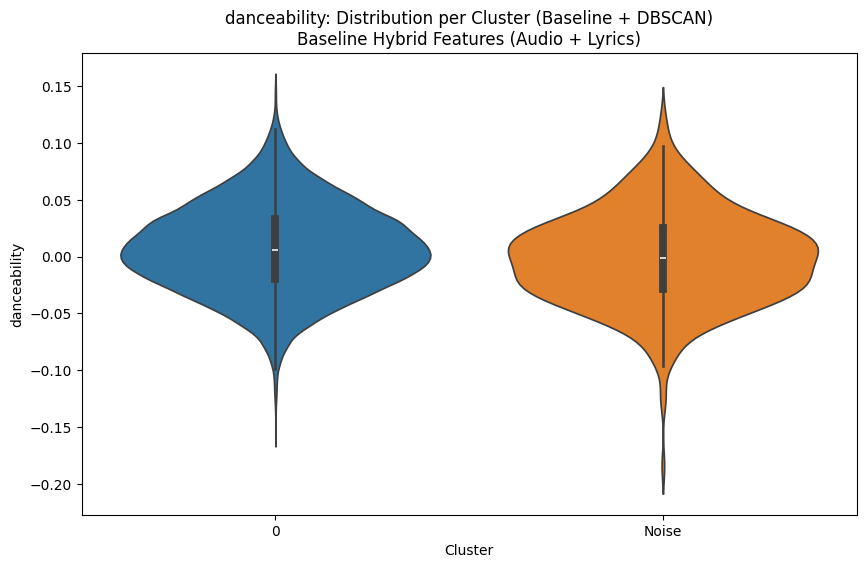

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




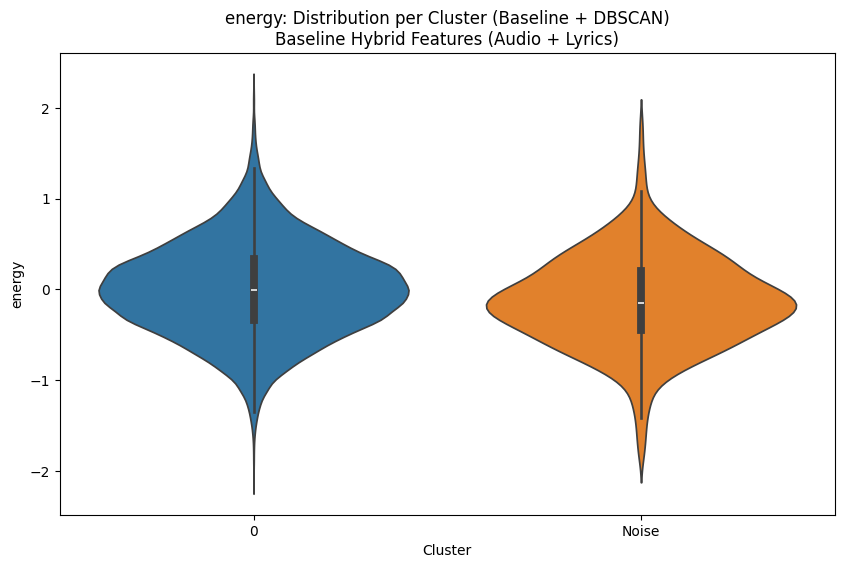

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




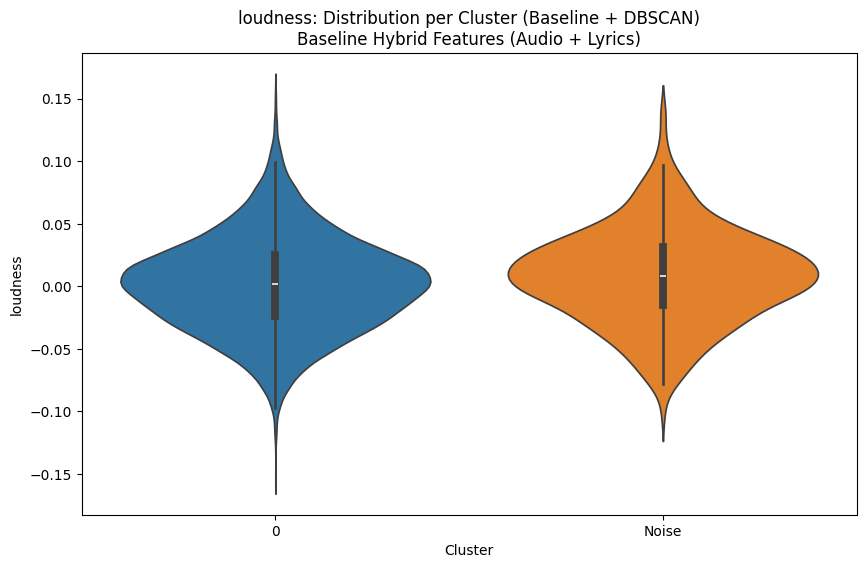

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




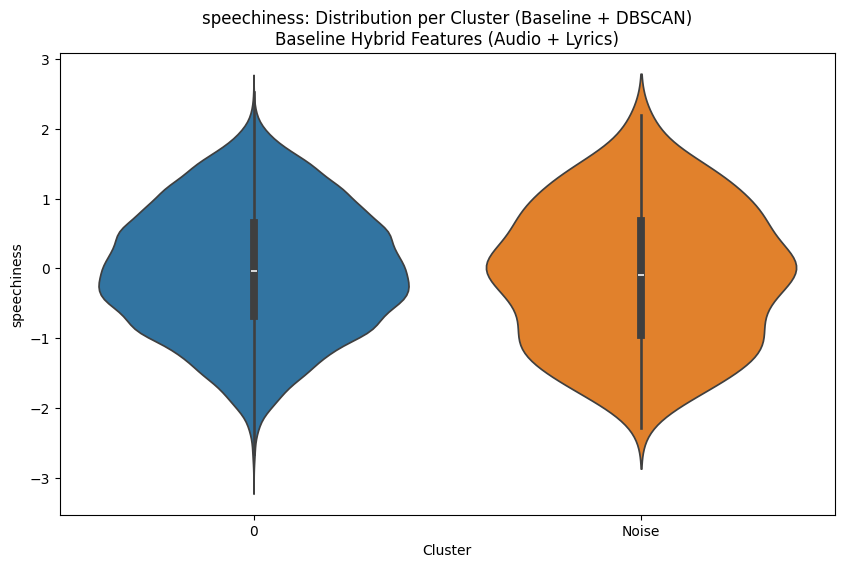

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




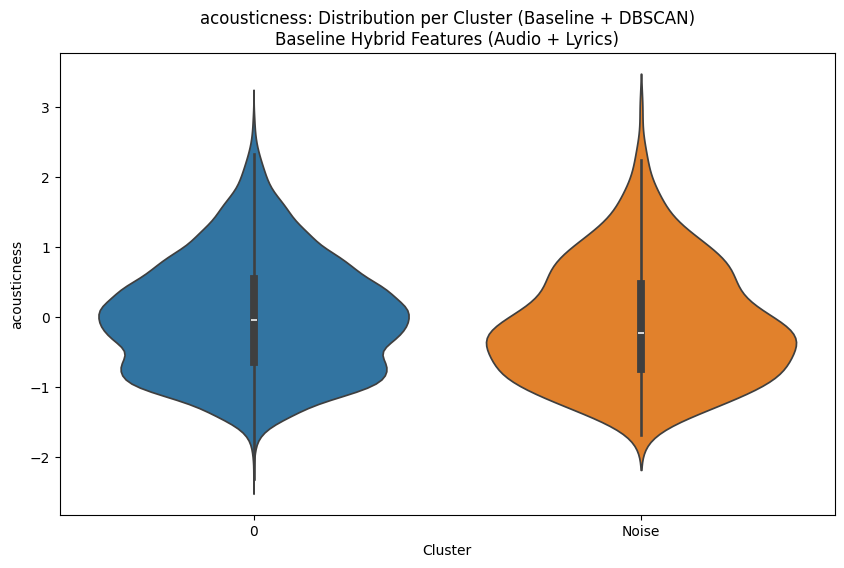

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




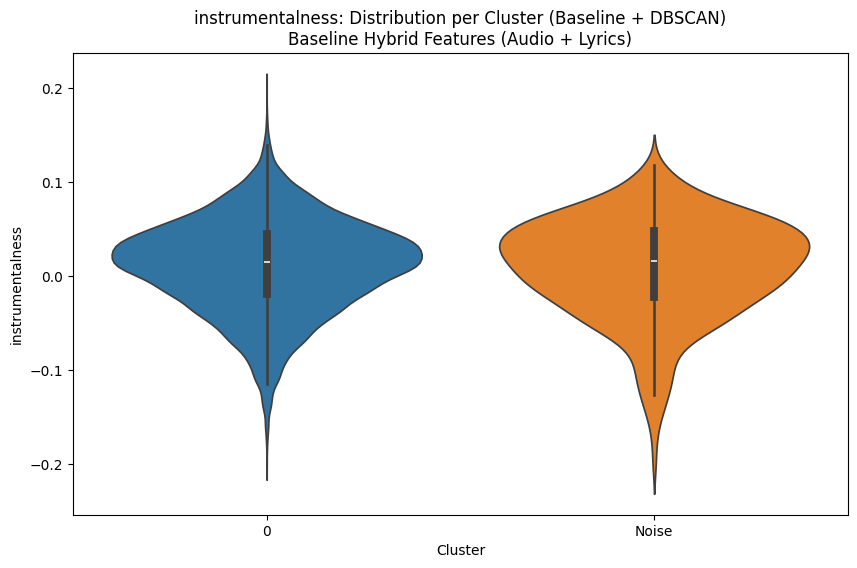

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




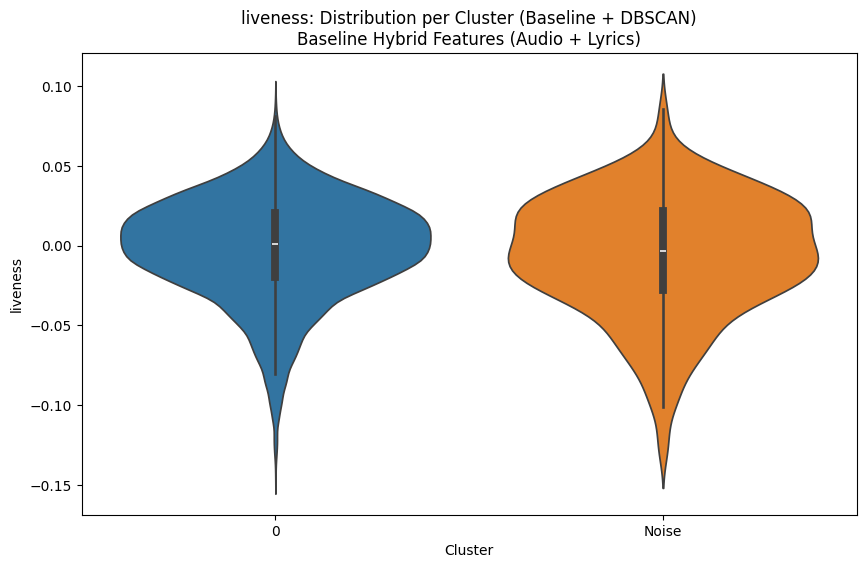

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




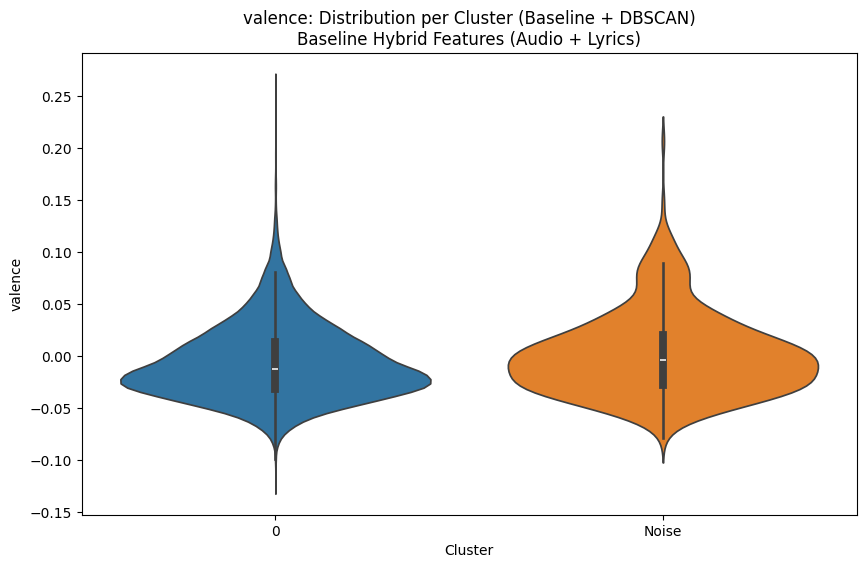

/tmp/ipykernel_55/3943551605.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




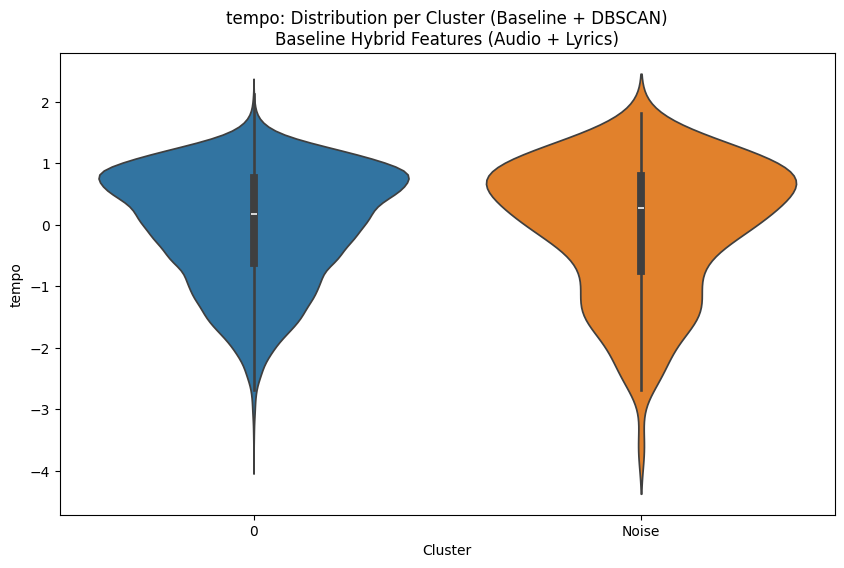

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_violin_feature_per_cluster(X_df, clusters, feature_name, method_name="KMeans"):
    
    # Convert clusters to string for plotting, handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    df_plot = X_df.copy()
    df_plot["Cluster"] = clusters_str
    
    plt.figure(figsize=(10,6))
    sns.violinplot(x="Cluster", y=feature_name, data=df_plot, palette="tab10")
    plt.title(f"{feature_name}: Distribution per Cluster ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.xlabel("Cluster")
    plt.ylabel(feature_name)
    plt.show()

X_features_df = pd.DataFrame(X_hybrid[:, :len(audio_cols)], columns=audio_cols)  # use raw values

# Apply violin plots for all clustering methods 
for method_name, labels in results_true.items():  # results_true = baseline clusters
    for feat in audio_cols:  # plot each audio feature
        plot_violin_feature_per_cluster(
            X_features_df, 
            labels, 
            feature_name=feat, 
            method_name=f"Baseline + {method_name}"
        )

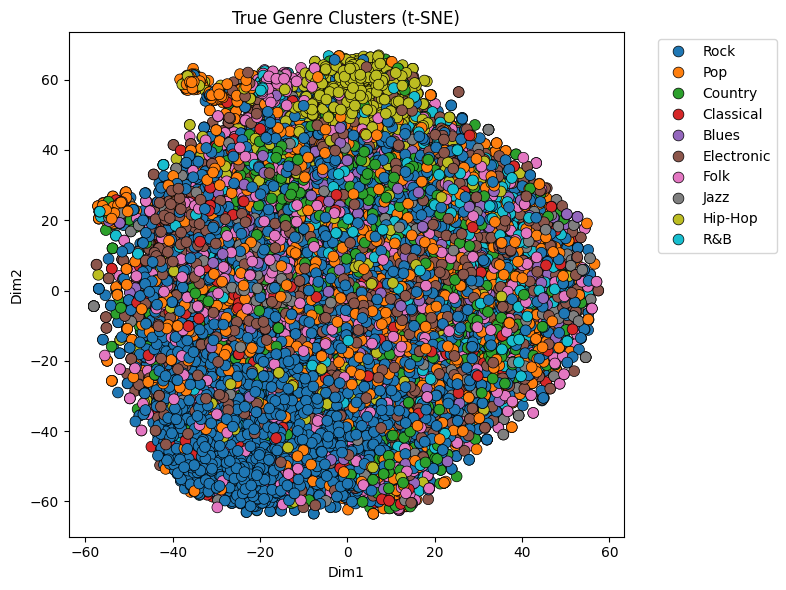

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


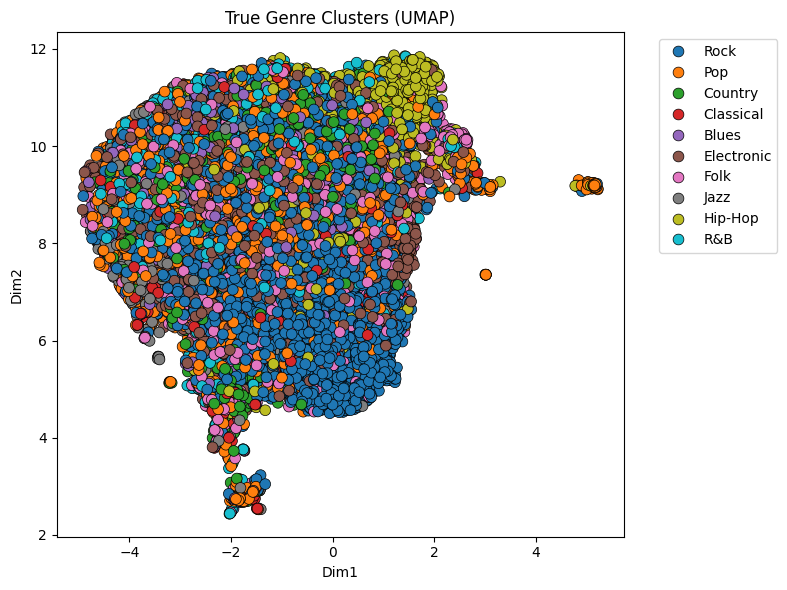

In [57]:
# True label visualization (t-SNE + UMAP)
def plot_true_labels(X_2d, true_labels, le, reducer_name):

    genres = le.inverse_transform(true_labels)

    df_plot = pd.DataFrame({
        "Dim1": X_2d[:,0],
        "Dim2": X_2d[:,1],
        "Genre": genres
    })

    plt.figure(figsize=(8,6))

    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Genre",
        palette="tab10",
        s=60,
        edgecolor="black",
        linewidth=0.5
    )

    plt.title(f"True Genre Clusters ({reducer_name})")
    plt.legend(bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    plt.show()

tsne = TSNE(n_components=2, perplexity=50, random_state=42)
X_tsne_true = tsne.fit_transform(X_cluster)

plot_true_labels(X_tsne_true, true_labels, le, "t-SNE")

reducer = umap.UMAP(n_components=2, random_state=42)
X_umap_true = reducer.fit_transform(X_cluster)

plot_true_labels(X_umap_true, true_labels, le, "UMAP")

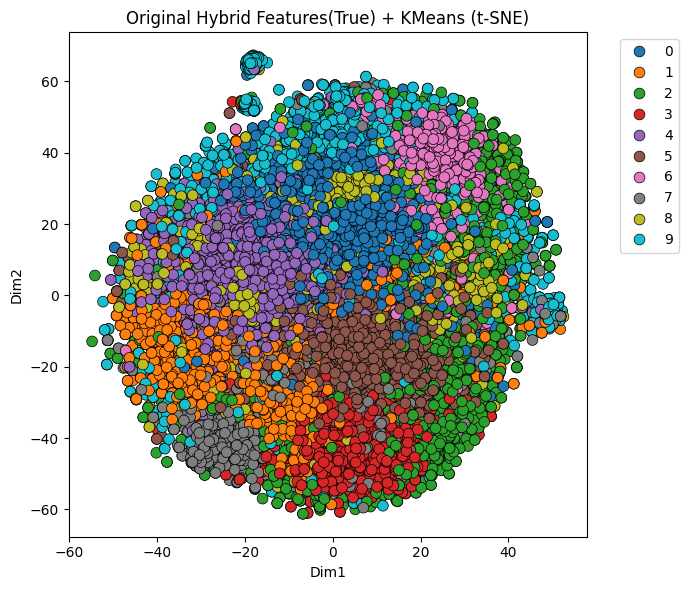

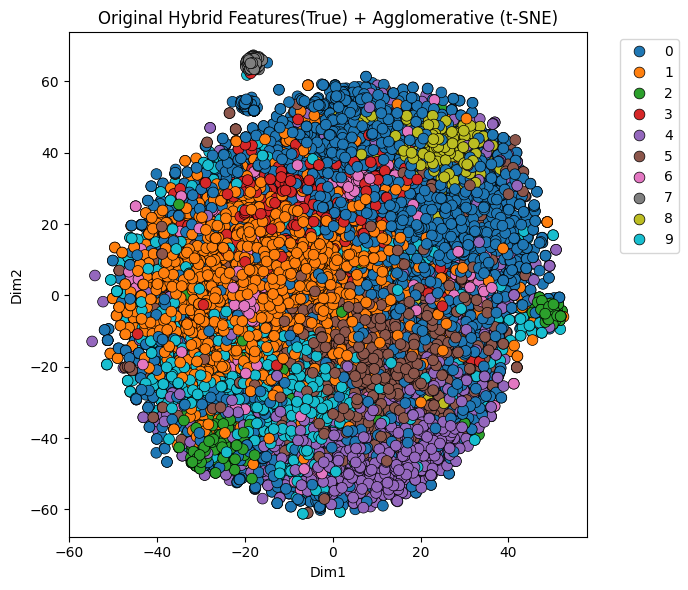

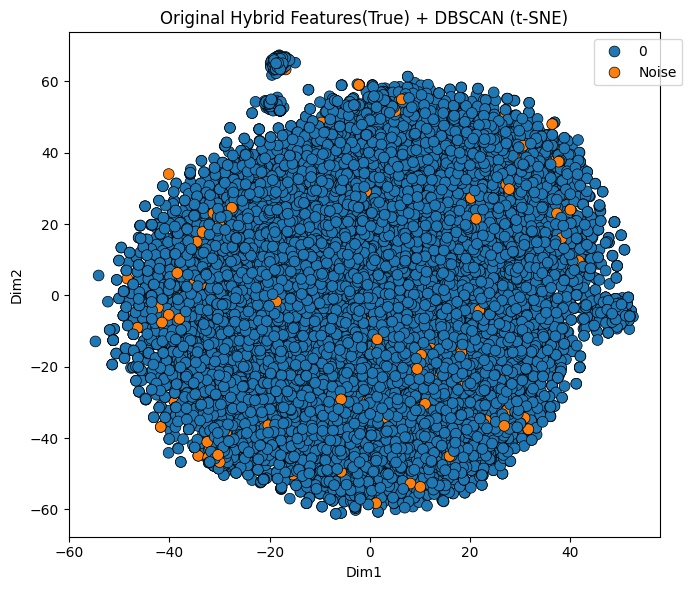

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


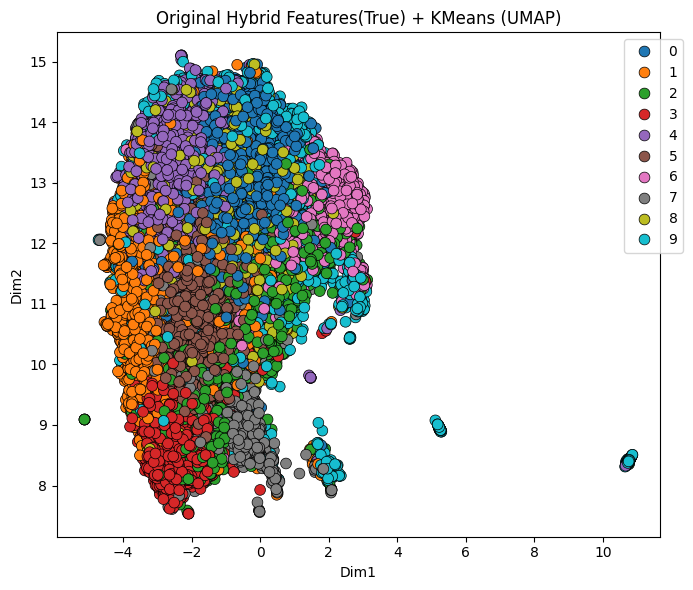

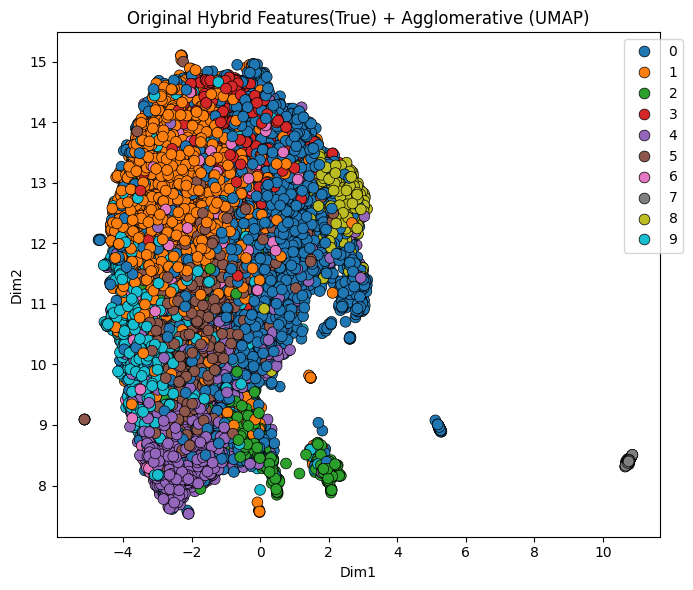

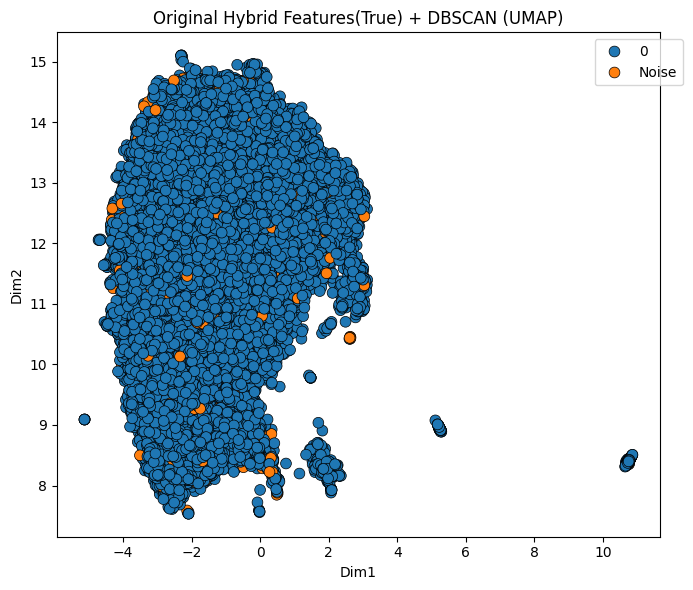

In [58]:
def plot_clusters(X_2d, labels, method_name, reducer_name):

    # Convert noise (-1) to "Noise"
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])

    # Sorted cluster labels for legend
    unique_labels = sorted(np.unique(labels_str))

    df_plot = pd.DataFrame({
        "Dim1": X_2d[:,0],
        "Dim2": X_2d[:,1],
        "Cluster": labels_str
    })

    plt.figure(figsize=(7,6))

    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        s=60,
        edgecolor="black",
        linewidth=0.5
    )

    plt.title(f"{method_name} ({reducer_name})")
    plt.legend(bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    plt.show()

tsne = TSNE(n_components=2, perplexity=50, random_state=42)
X_tsne_true = tsne.fit_transform(X_hybrid_scaled)

# Plot for all algorithms
for name, labels in results_true.items():
    plot_clusters(X_tsne_true, labels, f"Original Hybrid Features(True) + {name}", "t-SNE")
    
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap_true = reducer.fit_transform(X_hybrid_scaled)

# Plot for all algorithms
for name, labels in results_true.items():
    plot_clusters(X_umap_true, labels, f"Original Hybrid Features(True) + {name}", "UMAP")

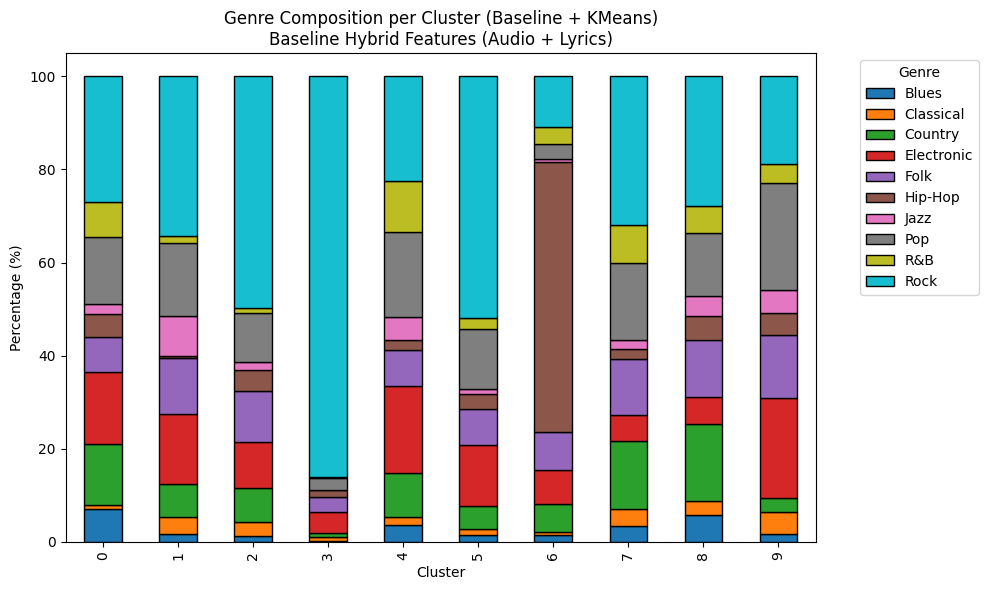


Cluster Counts (Baseline + KMeans):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0          256         34      476         565   280      176    84  520  277   
1           45         94      186         389   316       10   225  406   40   
2           29         67      157         218   243       97    39  232   23   
3            3         19       17          96    70       29     3   52    5   
4          139         67      374         730   306       84   193  717  428   
5           53         40      167         439   265      110    32  439   79   
6           29         12      122         145   162     1149    12   64   75   
7           51         55      221          84   181       33    31  248  122   
8           99         53      283         100   214       89    71  234  102   
9           31         93       55         415   262       89    94  443

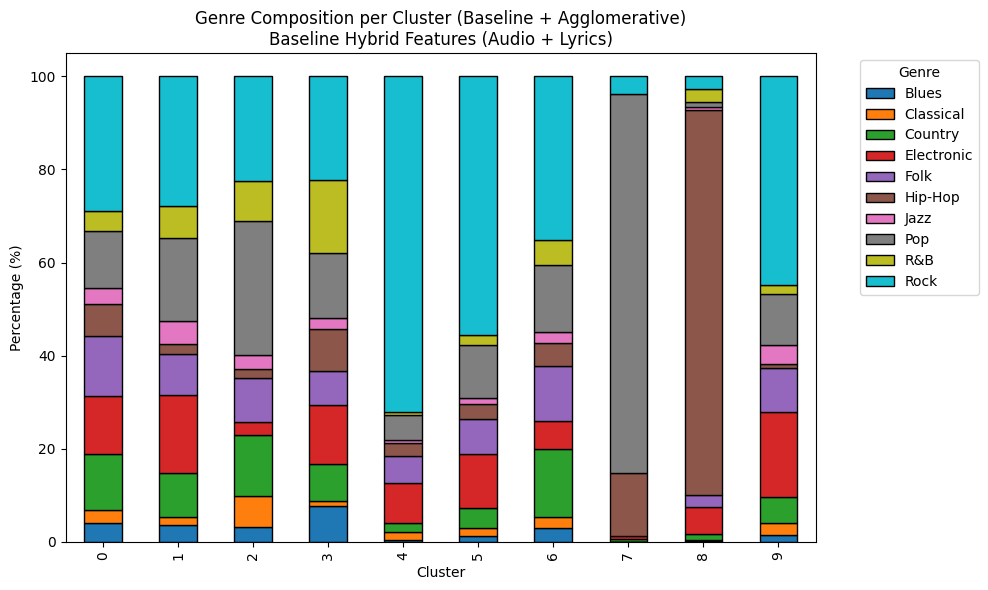


Cluster Counts (Baseline + Agglomerative):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          268        176      791         803   839      461   214   797   
1          241        127      638        1139   602      145   349  1206   
2           24         51      100          21    73       14    24   219   
3           98         14      103         164    92      118    30   179   
4           11         41       52         214   145       69    17   131   
5           36         51      132         347   233       92    43   339   
6           23         18      113          47    92       38    18   111   
7            0          0        1           1     0       22     0   133   
8            2          2       15          62    26      889     7    11   
9           32         54      113         383   197       18    82   229   

Genre    R&B  Rock  
Cluster   

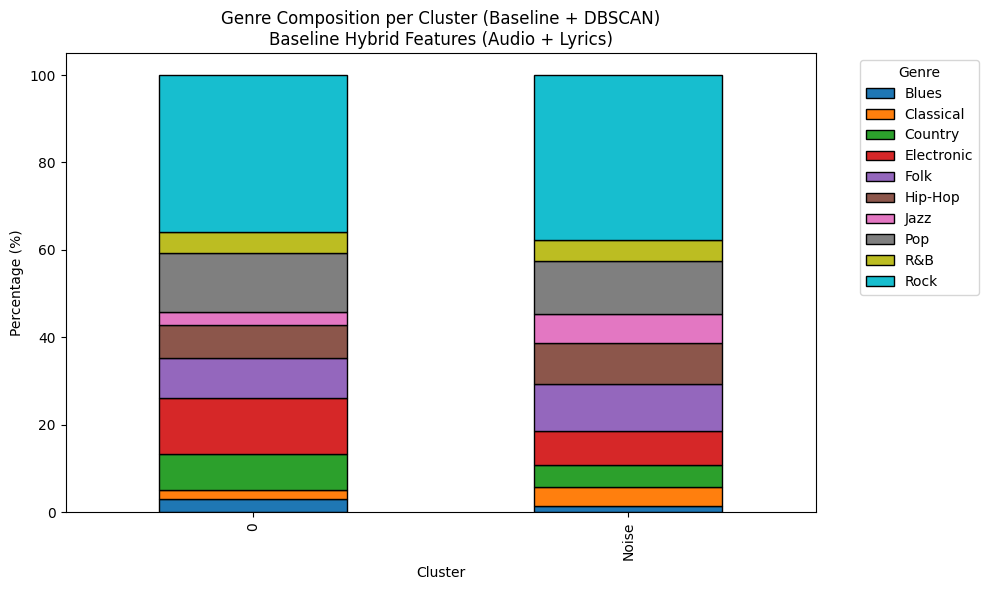


Cluster Counts (Baseline + DBSCAN):
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          729        515     2037        3148  2253     1826   755  3304   
Noise        6         19       21          33    46       40    29    51   

Genre     R&B  Rock  
Cluster              
0        1207  8799  
Noise      21   161  

Cluster Percentages (Baseline + DBSCAN):
Genre       Blues  Classical   Country  Electronic       Folk   Hip-Hop  \
Cluster                                                                   
0        2.966671   2.095796  8.289586   12.810809   9.168600  7.430920   
Noise    1.405152   4.449649  4.918033    7.728337  10.772834  9.367681   

Genre        Jazz        Pop       R&B       Rock  
Cluster                                            
0        3.072478  13.445652  4.911895  35.807594  
Noise    6.791569  11.943794  4.918033  37.704918  


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def cluster_composition_baseline(clusters, method_name="KMeans", le=None):
    
    # Convert clusters to string for consistent labeling, handle DBSCAN noise
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder is provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels  
    
    # Create DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(10,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title(f"Genre Composition per Cluster ({method_name})\nBaseline Hybrid Features (Audio + Lyrics)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # Print counts and percentages
    print(f"\nCluster Counts ({method_name}):")
    print(cluster_counts)
    print(f"\nCluster Percentages ({method_name}):")
    print(cluster_percent)

# Apply to all baseline hybrid clustering results
for name, labels in results_true.items():
    cluster_composition_baseline(labels, method_name=f"Baseline + {name}", le=le)

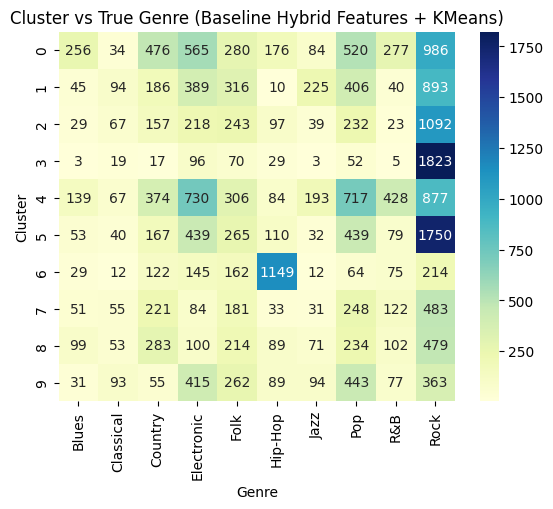

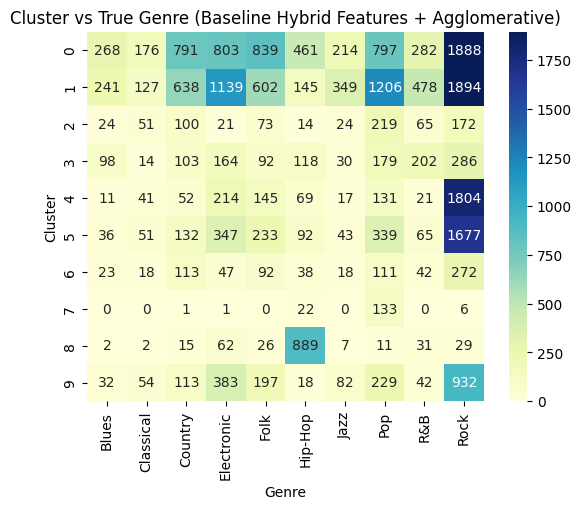

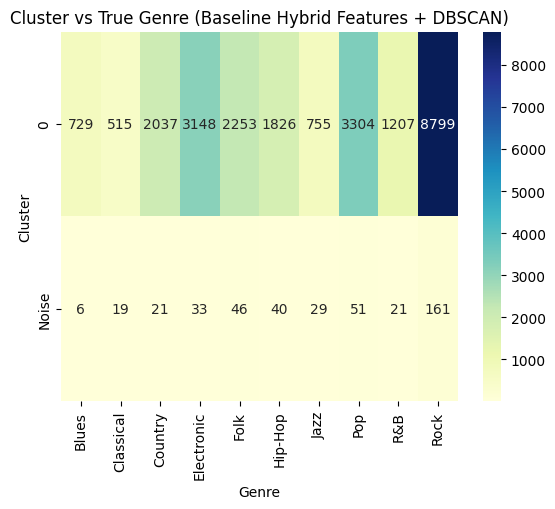

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()

for name, labels in results_true.items():
    cluster_heatmap(labels, f"Baseline Hybrid Features + {name}")

In [61]:
# Baseline: raw audio features (scaled)
scaler = StandardScaler()
X_audio_scaled = scaler.fit_transform(X_audio.reshape(X_audio.shape[0], -1)) # flatten

In [62]:
results_baseline = {}

# KMeans
results_baseline["KMeans"] = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X_audio_scaled)

# Agglomerative
results_baseline["Agglomerative"] = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X_audio_scaled)

pca = PCA(n_components=6, random_state=42)
X_dbscan1 = pca.fit_transform(X_audio_scaled)

# DBSCAN
results_baseline["DBSCAN"] = DBSCAN(eps=2.5, min_samples=5).fit_predict(X_dbscan1)

# Evaluate
for name, labels in results_baseline.items():
    if name == "DBSCAN":
        X_eval = X_dbscan1  # PCA-reduced data
        mask = labels != -1
        n_clusters_alg = len(np.unique(labels[mask]))
        if np.sum(mask) > 1 and n_clusters_alg > 1:
            sil = silhouette_score(X_eval[mask], labels[mask])
            dbi = davies_bouldin_score(X_eval[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:  # KMeans / Agg
        X_eval = X_audio_scaled
        n_clusters_alg = len(np.unique(labels))
        if n_clusters_alg > 1:
            sil = silhouette_score(X_eval, labels)
            dbi = davies_bouldin_score(X_eval, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\nBaseline (Audio only) - {name}")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")



Baseline (Audio only) - KMeans
Silhouette Score: 0.156625
Davies-Bouldin Index: 1.637408
Adjusted Rand Index: 0.059811

Baseline (Audio only) - Agglomerative
Silhouette Score: 0.080057
Davies-Bouldin Index: 1.809532
Adjusted Rand Index: 0.074053

Baseline (Audio only) - DBSCAN
Silhouette Score: 0.000000
Davies-Bouldin Index: 0.000000
Adjusted Rand Index: 0.000000


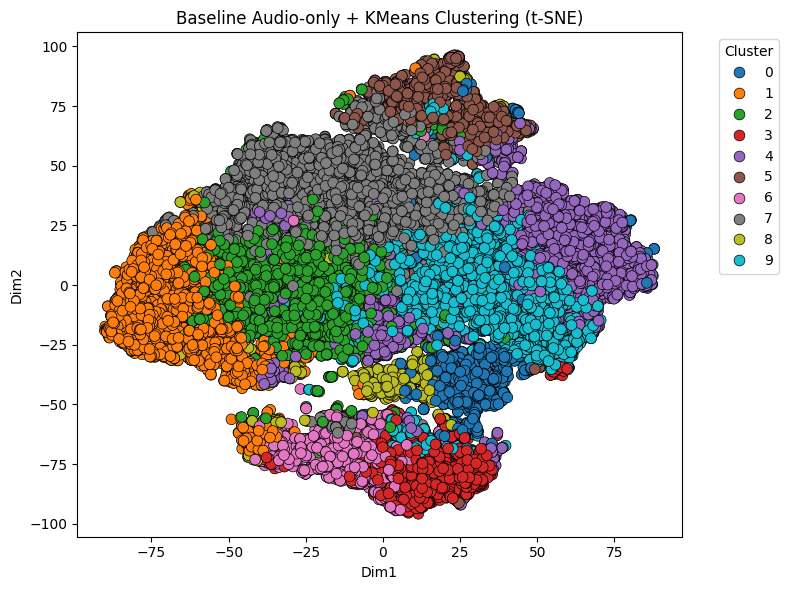

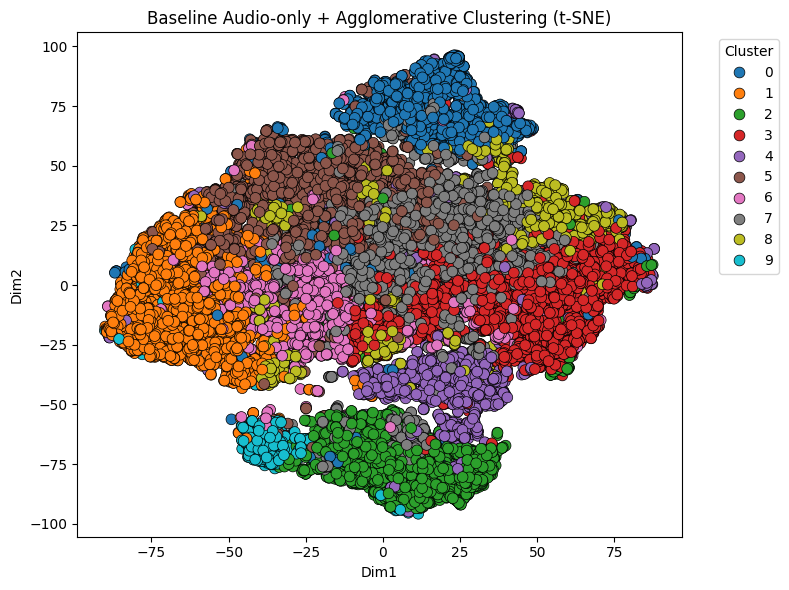

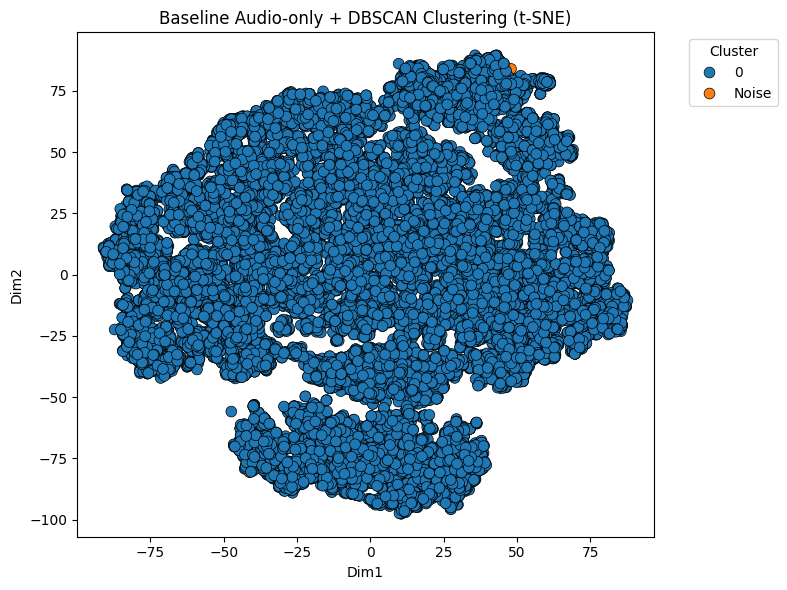

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


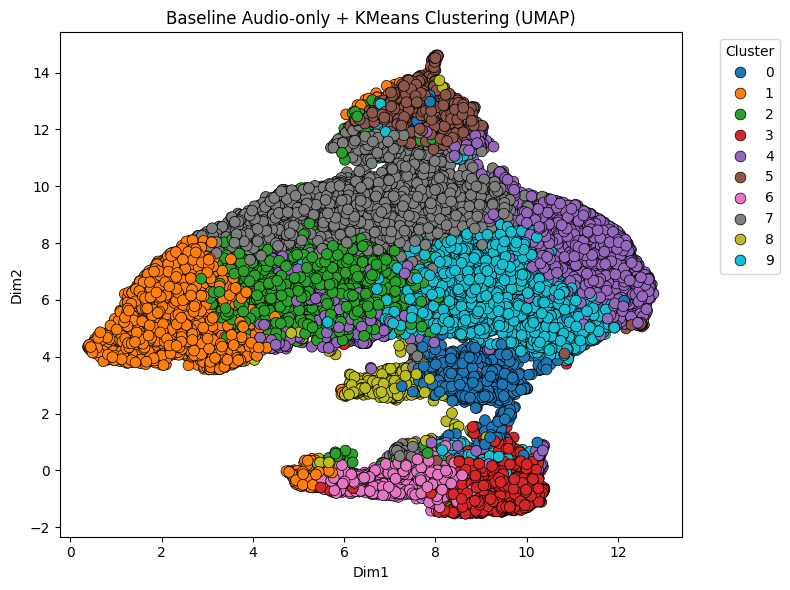

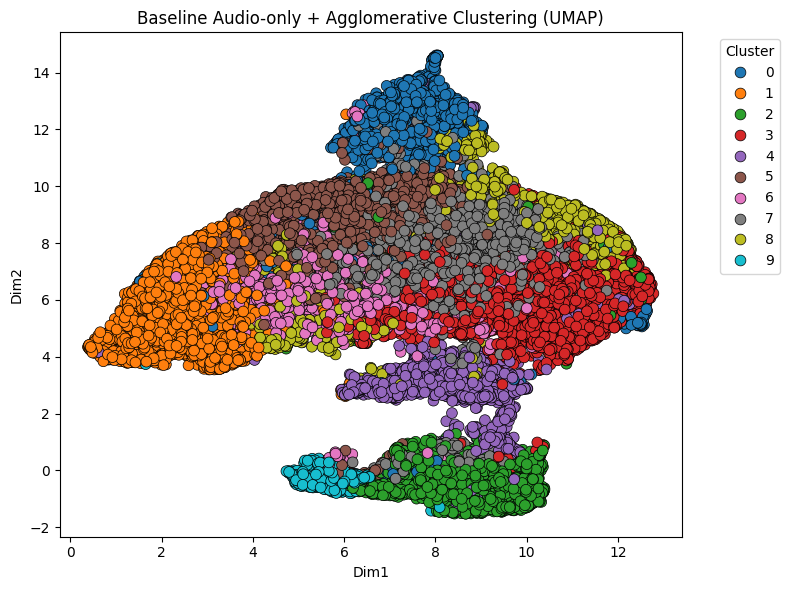

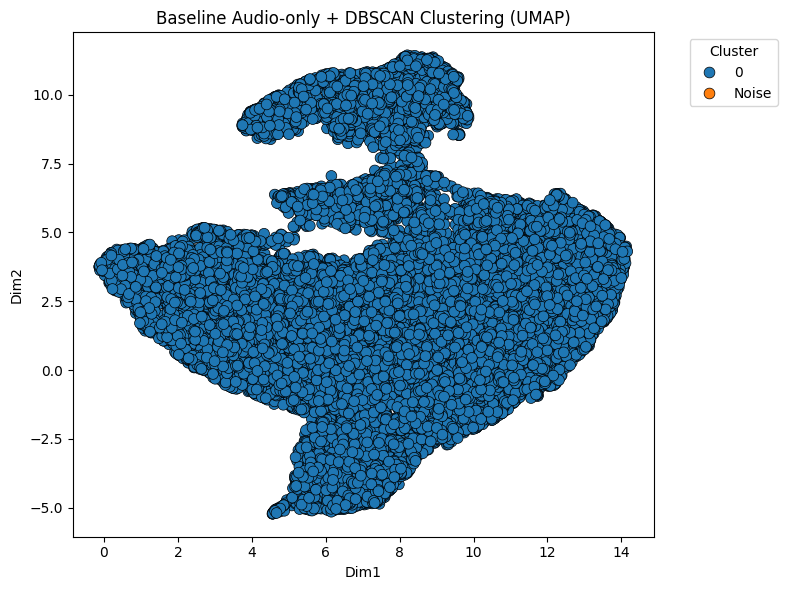

In [63]:
def plot_scatter_baseline(X_2d, labels, method_name, reducer_name="t-SNE"):
    
    # Convert labels to string for discrete hue, handle DBSCAN noise
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])
    unique_labels = sorted(np.unique(labels_str))
    
    df_plot = pd.DataFrame({
        "Dim1": X_2d[:, 0],
        "Dim2": X_2d[:, 1],
        "Cluster": labels_str
    })
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        edgecolor="black",
        linewidth=0.5,
        s=60
    )
    plt.title(f"Baseline Audio-only + {method_name} Clustering ({reducer_name})")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Prepare features for t-SNE / UMAP
# Use PCA-reduced for DBSCAN, full scaled for others
X_cluster_dict = {
    "KMeans": X_audio_scaled,
    "Agglomerative": X_audio_scaled,
    "DBSCAN": X_dbscan1
}

# t-SNE visualization
tsne = TSNE(n_components=2, perplexity=50, random_state=42)
for name, labels in results_baseline.items():
    X_2d = tsne.fit_transform(X_cluster_dict[name])
    plot_scatter_baseline(X_2d, labels, name, reducer_name="t-SNE")

# UMAP visualization
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
for name, labels in results_baseline.items():
    X_2d = reducer.fit_transform(X_cluster_dict[name])
    plot_scatter_baseline(X_2d, labels, name, reducer_name="UMAP")


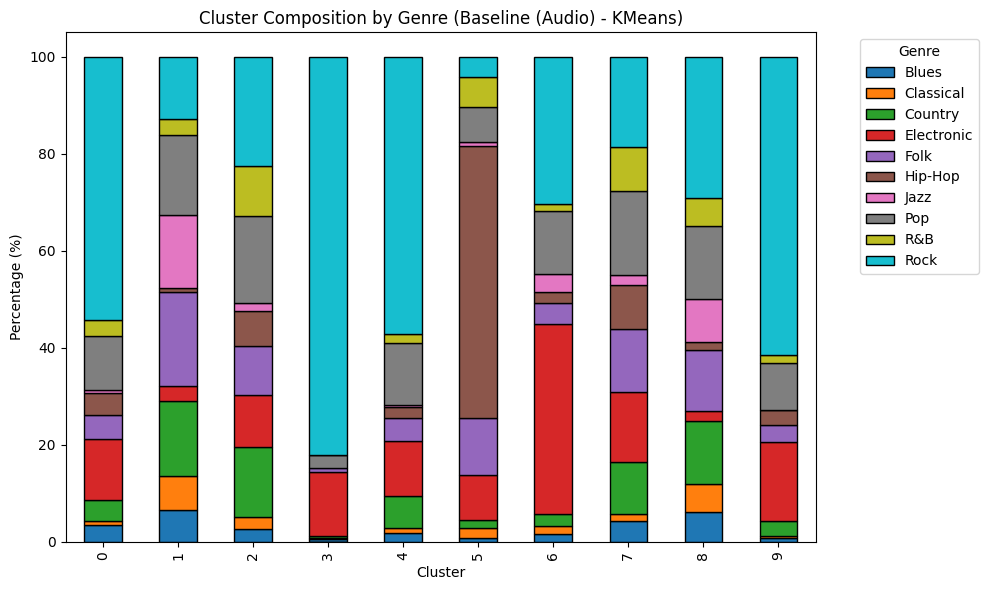


 Cluster Composition Counts (Baseline (Audio) - KMeans) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0           44         10       56         160    61       58     7  143   41   
1          217        233      512         105   643       26   498  552  111   
2           86         80      474         348   328      238    54  588  339   
3            8          5        4         196    15        0     0   38    1   
4           62         28      214         366   150       76    11  412   64   
5           11         34       23         143   179      857    13  108   95   
6           18         21       27         456    50       26    43  151   18   
7          215         71      547         725   654      451   100  878  455   
8           38         36       81          13    77       11    55   93   36   
9           36         16      120         669   14

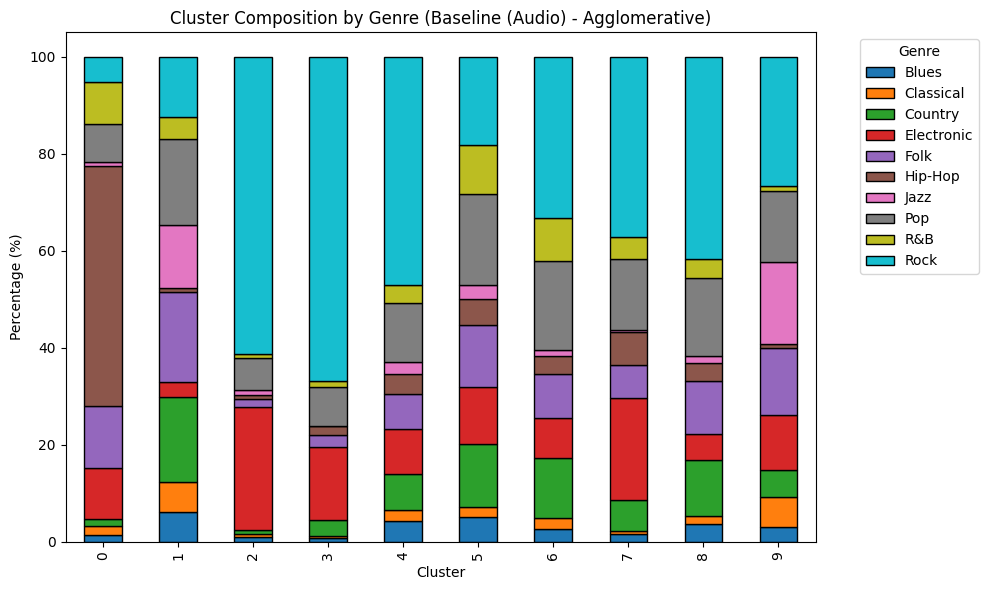


 Cluster Composition Counts (Baseline (Audio) - Agglomerative) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0           30         44       33         232   284     1102    20  175  194   
1          215        224      614         113   651       33   454  627  161   
2           25         15       22         625    39       22    22  167   17   
3           29         20      130         588    99       73     4  315   49   
4           77         42      132         167   131       72    46  220   65   
5          173         65      435         393   430      176    94  626  337   
6           52         43      244         163   177       71    27  359  175   
7           57         24      232         754   241      252     8  531  161   
8           61         26      188          88   177       61    24  260   64   
9           16         31       28          

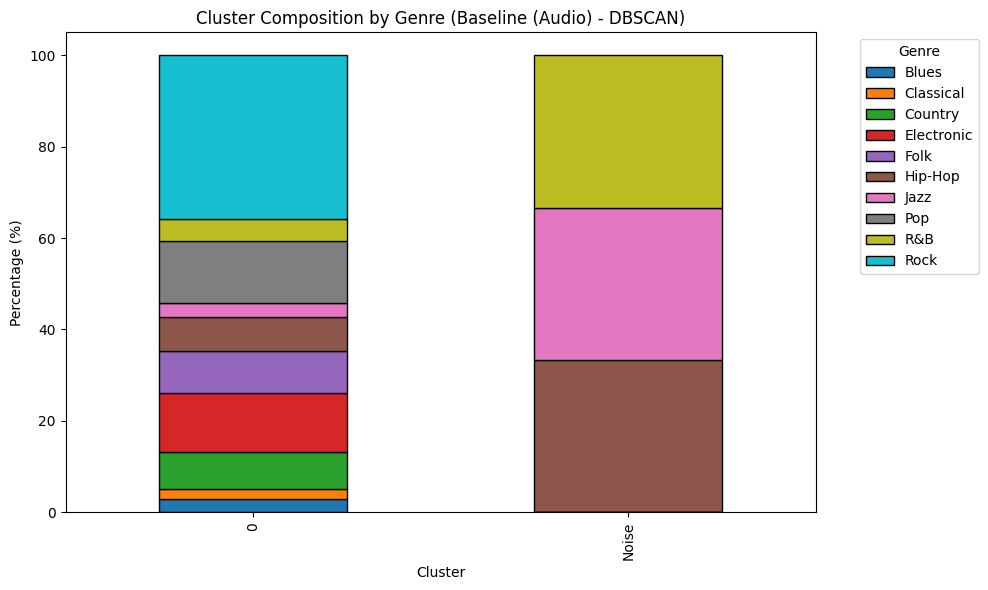


 Cluster Composition Counts (Baseline (Audio) - DBSCAN) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          735        534     2058        3181  2299     1865   783  3355   
Noise        0          0        0           0     0        1     1     0   

Genre     R&B  Rock  
Cluster              
0        1227  8960  
Noise       1     0  

 Cluster Composition Percentages (Baseline (Audio) - DBSCAN) 
Genre       Blues  Classical   Country  Electronic      Folk    Hip-Hop  \
Cluster                                                                   
0        2.940353   2.136256  8.232988   12.725527  9.197104   7.460895   
Noise    0.000000   0.000000  0.000000    0.000000  0.000000  33.333333   

Genre         Jazz        Pop        R&B       Rock  
Cluster                                              
0         3.132376  13.421611   4.908589  35.844301  
Noise    33.333333 

In [ ]:
import pandas as pd
import numpy as np

def cluster_composition(clusters, method_name="KMeans", le=None):
    # Convert clusters to string for consistent labeling
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    else:
        genres = true_labels  
    
    # Make a DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot
    cluster_percent.plot(kind='bar', stacked=True, figsize=(10,6), colormap='tab10', edgecolor='black')
    plt.title(f"Cluster Composition by Genre ({method_name})")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"\n Cluster Composition Counts ({method_name}) ")
    print(cluster_counts)
    print(f"\n Cluster Composition Percentages ({method_name}) ")
    print(cluster_percent)

# Cluster composition for baseline (Audio-only)
for name, labels in results_baseline.items():
    cluster_composition(labels, method_name=f"Baseline (Audio) - {name}", le=le)


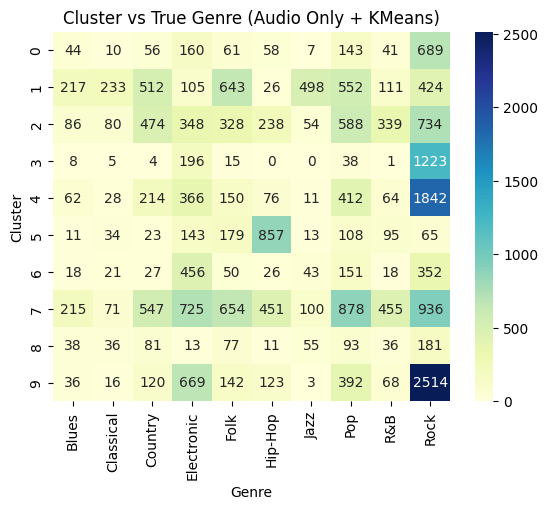

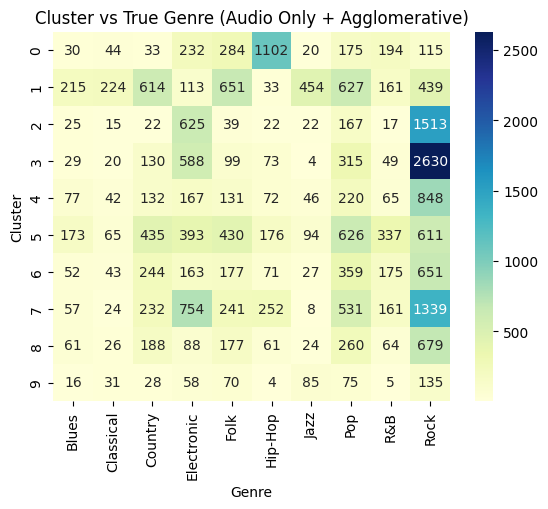

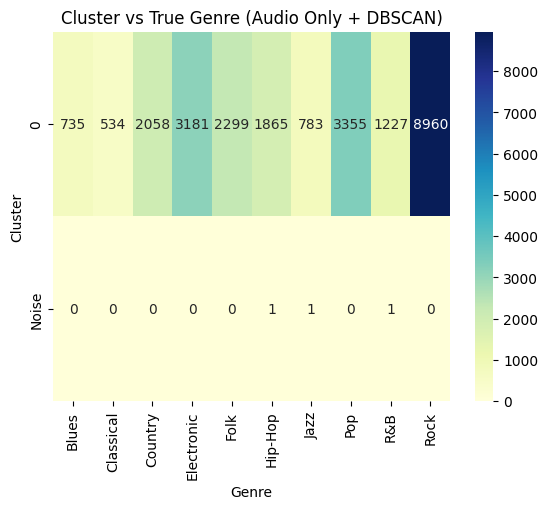

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()


for name, labels in results_baseline.items():
    cluster_heatmap(labels, f"Audio Only + {name}")

In [65]:
# Scale lyrics embeddings
scaler = StandardScaler()
X_lyrics_scaled = scaler.fit_transform(X_lyrics)  # X_lyrics = lyrics embeddings

# Prepare dictionary to store clustering results
results_lyrics = {}

# KMeans
results_lyrics["KMeans"] = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X_lyrics_scaled)

# Agglomerative
results_lyrics["Agglomerative"] = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X_lyrics_scaled)

# DBSCAN requires lower dimension for high-D data
pca = PCA(n_components=6, random_state=42)
X_dbscan_lyrics = pca.fit_transform(X_lyrics_scaled)

results_lyrics["DBSCAN"] = DBSCAN(eps=2.5, min_samples=5).fit_predict(X_dbscan_lyrics)

# Evaluate
for name, labels in results_lyrics.items():
    if name == "DBSCAN":
        X_eval = X_dbscan_lyrics
        mask = labels != -1
        n_clusters_alg = len(np.unique(labels[mask]))
        if np.sum(mask) > 1 and n_clusters_alg > 1:
            sil = silhouette_score(X_eval[mask], labels[mask])
            dbi = davies_bouldin_score(X_eval[mask], labels[mask])
            ari = adjusted_rand_score(true_labels[mask], labels[mask])
        else:
            sil, dbi, ari = 0, 0, 0
    else:
        X_eval = X_lyrics_scaled
        n_clusters_alg = len(np.unique(labels))
        if n_clusters_alg > 1:
            sil = silhouette_score(X_eval, labels)
            dbi = davies_bouldin_score(X_eval, labels)
            ari = adjusted_rand_score(true_labels, labels)
        else:
            sil, dbi, ari = 0, 0, 0

    print(f"\nBaseline (Lyrics-only) - {name}")
    print(f"Silhouette Score: {sil:.6f}")
    print(f"Davies-Bouldin Index: {dbi:.6f}")
    print(f"Adjusted Rand Index: {ari:.6f}")


Baseline (Lyrics-only) - KMeans
Silhouette Score: 0.011710
Davies-Bouldin Index: 4.847559
Adjusted Rand Index: 0.048942

Baseline (Lyrics-only) - Agglomerative
Silhouette Score: -0.005796
Davies-Bouldin Index: 6.123945
Adjusted Rand Index: 0.046182

Baseline (Lyrics-only) - DBSCAN
Silhouette Score: -0.407594
Davies-Bouldin Index: 0.969700
Adjusted Rand Index: -0.000721


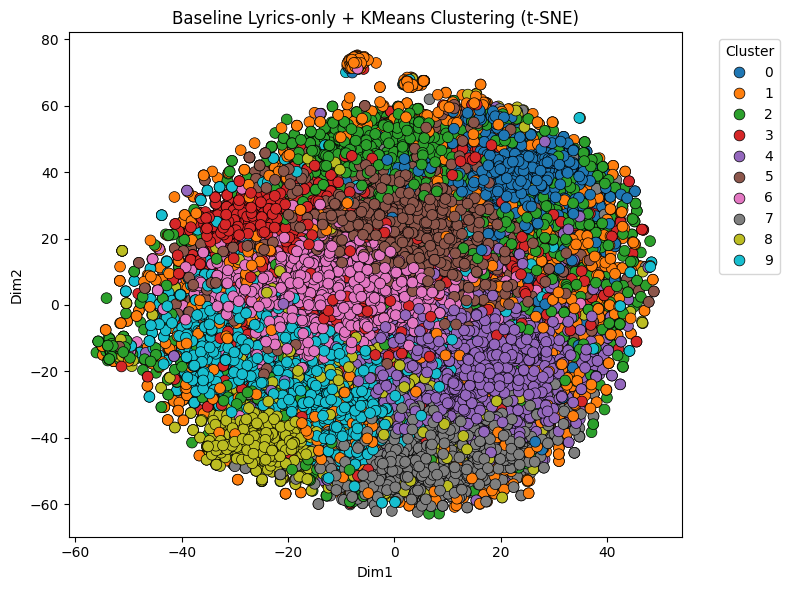

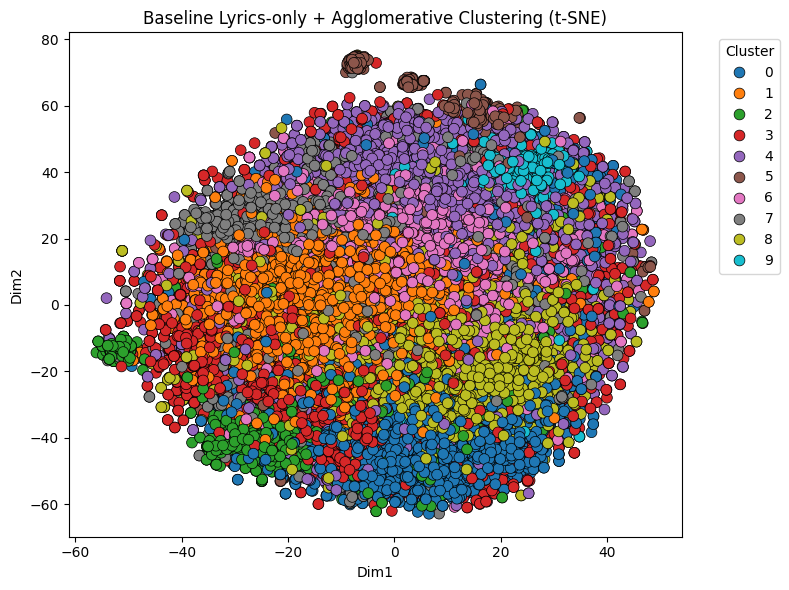

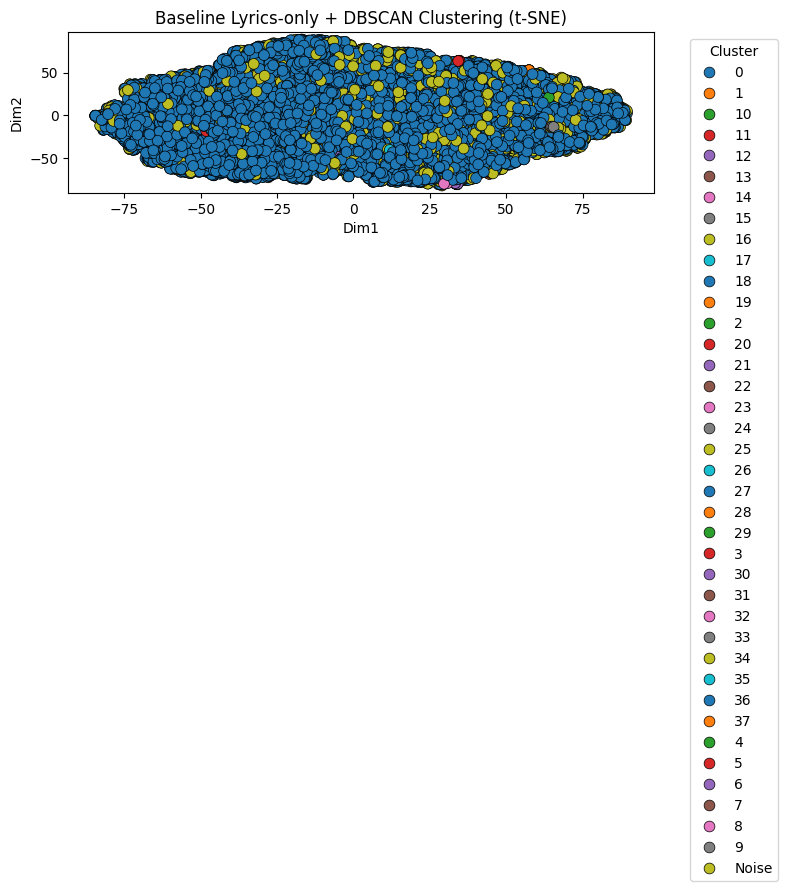

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


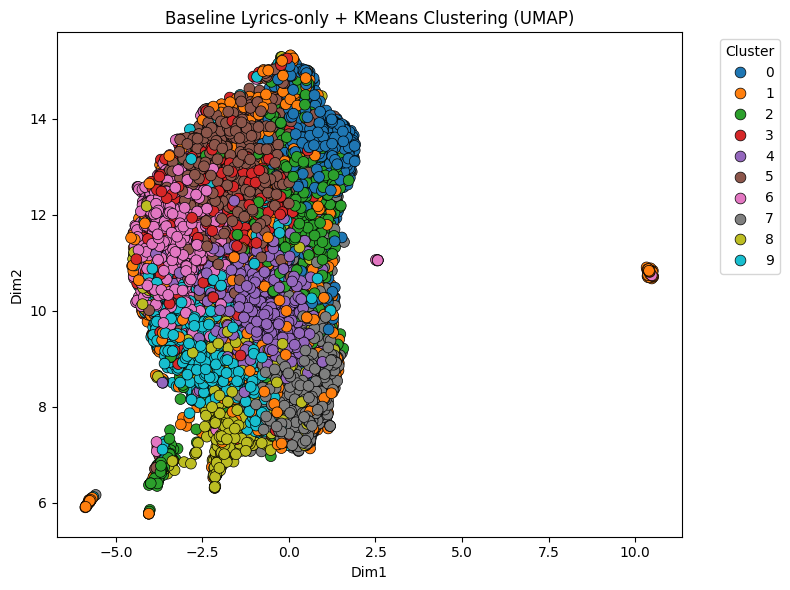

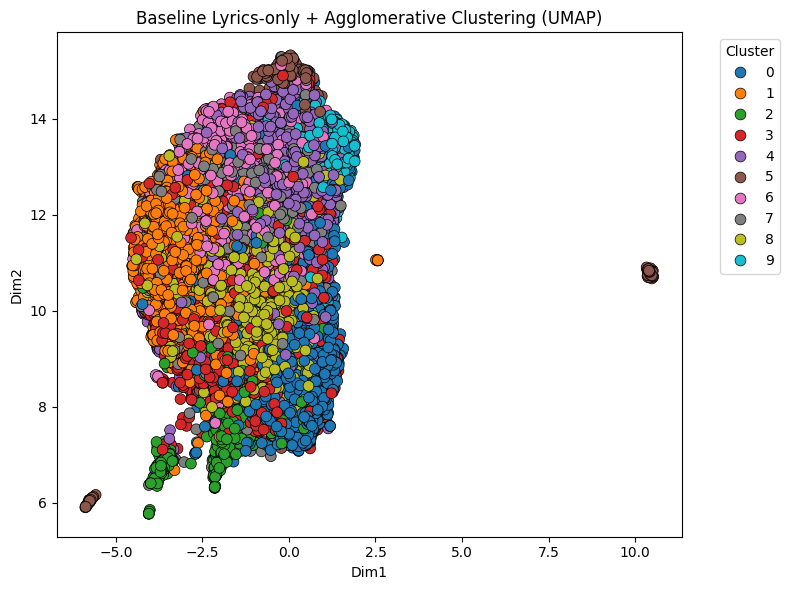

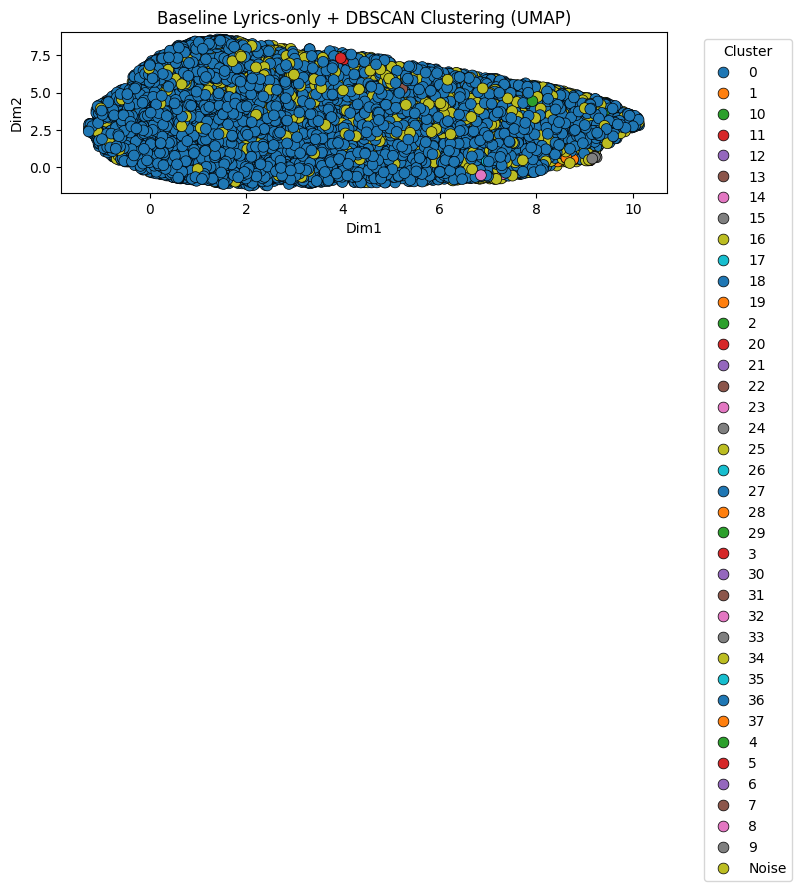

In [66]:
def plot_scatter_lyrics(X_2d, labels, method_name, reducer_name="t-SNE"):
    # Convert labels to string for discrete hue, handle DBSCAN noise
    labels_str = np.array([str(l) if l != -1 else "Noise" for l in labels])
    unique_labels = sorted(np.unique(labels_str))
    
    df_plot = pd.DataFrame({
        "Dim1": X_2d[:, 0],
        "Dim2": X_2d[:, 1],
        "Cluster": labels_str
    })
    
    plt.figure(figsize=(8,6))
    sns.scatterplot(
        data=df_plot,
        x="Dim1",
        y="Dim2",
        hue="Cluster",
        hue_order=unique_labels,
        palette="tab10",
        edgecolor="black",
        linewidth=0.5,
        s=60
    )
    plt.title(f"Baseline Lyrics-only + {method_name} Clustering ({reducer_name})")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Prepare features for t-SNE / UMAP
# Use full scaled embeddings for KMeans / Agglomerative
# Use PCA-reduced embeddings for DBSCAN
X_lyrics_dict = {
    "KMeans": X_lyrics_scaled,
    "Agglomerative": X_lyrics_scaled,
    "DBSCAN": PCA(n_components=6, random_state=42).fit_transform(X_lyrics_scaled)
}

# t-SNE visualization
tsne = TSNE(n_components=2, perplexity=50, random_state=42)
for name, labels in results_lyrics.items():
    X_2d = tsne.fit_transform(X_lyrics_dict[name])
    plot_scatter_lyrics(X_2d, labels, name, reducer_name="t-SNE")

# UMAP visualization
reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
for name, labels in results_lyrics.items():
    X_2d = reducer.fit_transform(X_lyrics_dict[name])
    plot_scatter_lyrics(X_2d, labels, name, reducer_name="UMAP")


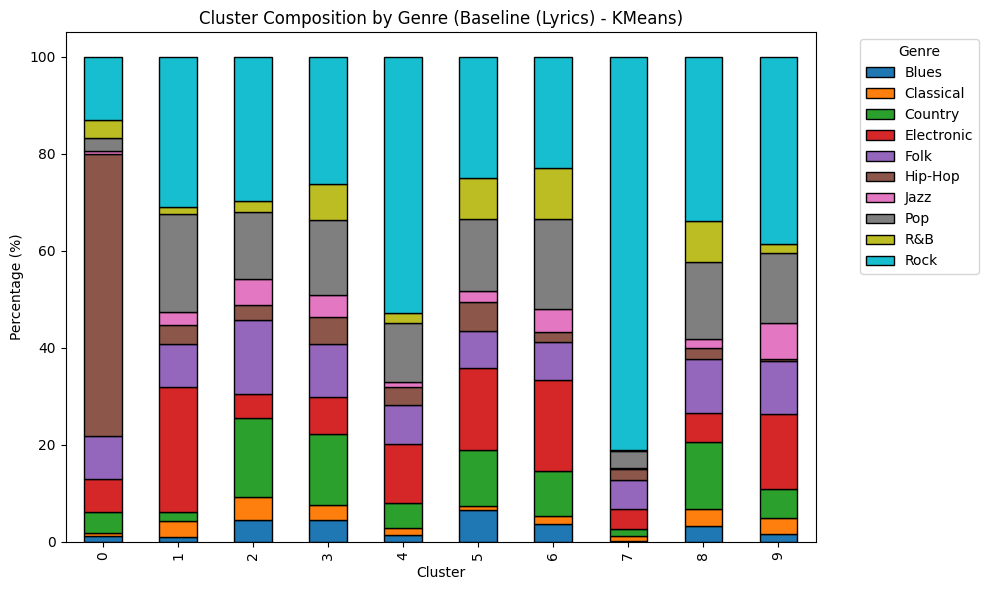


 Cluster Composition Counts (Baseline (Lyrics) - KMeans) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0           24         10       83         134   169     1124    10   53   71   
1           17         62       34         468   160       70    50  367   25   
2           95        100      341         106   321       64   115  288   51   
3           78         50      249         127   187       94    77  263  123   
4           49         48      173         406   269      122    31  407   72   
5          227         32      397         591   264      207    77  515  296   
6          148         60      372         732   313       80   186  735  410   
7            3         27       32          99   142       57     5   82    4   
8           51         53      208          91   170       36    28  242  126   
9           43         92      169         427   3

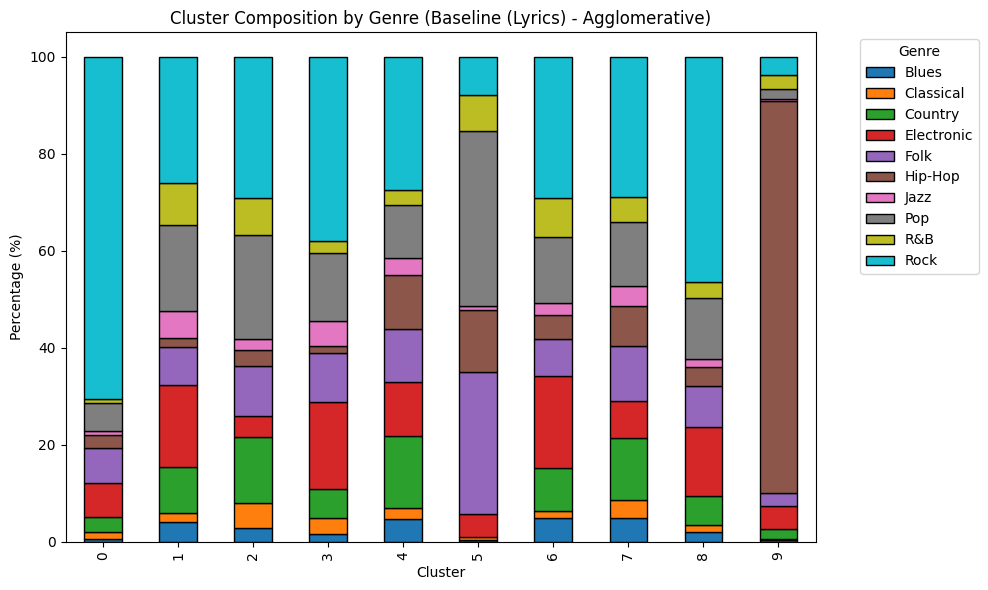


 Cluster Composition Counts (Baseline (Lyrics) - Agglomerative) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
Cluster                                                                         
0           16         50      105         229   234       89    25  190   31   
1          188         93      443         786   369       87   263  828  407   
2           37         63      172          56   128       41    31  269   96   
3           49         93      178         519   296       44   145  412   70   
4          135         65      421         314   310      321    98  308   93   
5            2          4        0          31   189       82     5  233   48   
6          138         42      251         534   216      140    70  385  229   
7           95         69      246         144   220      154    81  250  102   
8           71         54      222         523   312      145    62  462  123   
9            4          1       20         

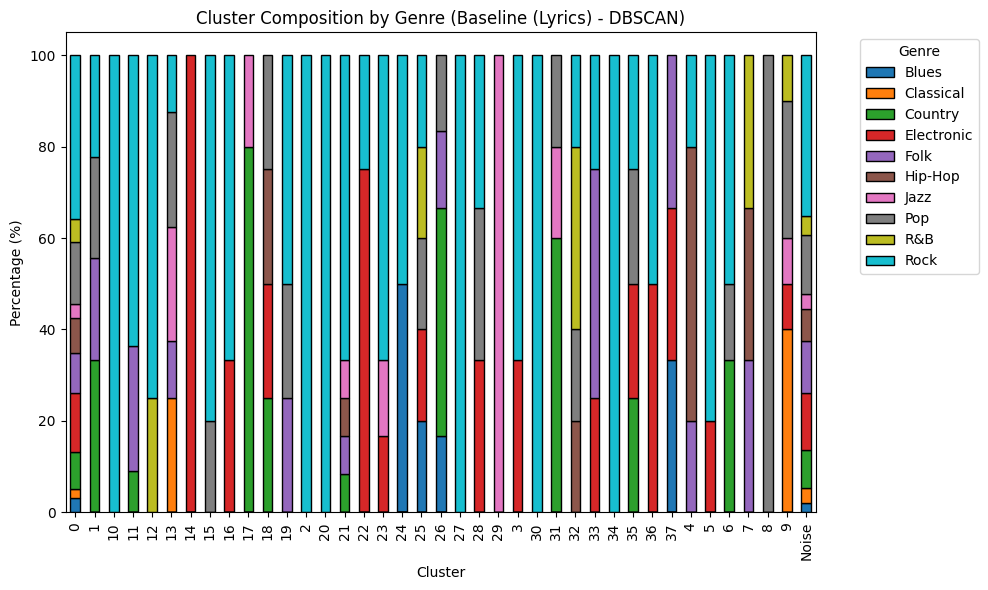


 Cluster Composition Counts (Baseline (Lyrics) - DBSCAN) 
Genre    Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  \
Cluster                                                                     
0          663        420     1765        2761  1912     1627   666  2915   
1            0          0        3           0     2        0     0     2   
10           0          0        0           0     0        0     0     0   
11           0          0        1           0     3        0     0     0   
12           0          0        0           0     0        0     0     0   
13           0          2        0           0     1        0     2     2   
14           0          0        0           1     0        0     0     0   
15           0          0        0           0     0        0     0     1   
16           0          0        0           2     0        0     0     0   
17           0          0        4           0     0        0     1     0   
18           0   

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def cluster_composition(clusters, method_name="KMeans", le=None, true_labels_array=None):
    # Convert clusters to string for consistent labeling (Noise for -1)
    clusters_str = np.array([str(c) if c != -1 else "Noise" for c in clusters])
    
    # Map true labels back to genre names if LabelEncoder provided
    if le is not None:
        genres = le.inverse_transform(true_labels)
    elif true_labels_array is not None:
        genres = true_labels_array
    else:
        genres = clusters  
    
    # Make a DataFrame
    df_clusters = pd.DataFrame({
        "Genre": genres,
        "Cluster": clusters_str
    })
    
    # Compute counts per cluster
    cluster_counts = df_clusters.groupby(["Cluster", "Genre"]).size().unstack(fill_value=0)
    
    # Compute percentages
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar', stacked=True, figsize=(10,6), colormap='tab10', edgecolor='black'
    )
    plt.title(f"Cluster Composition by Genre ({method_name})")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(f"\n Cluster Composition Counts ({method_name}) ")
    print(cluster_counts)
    print(f"\n Cluster Composition Percentages ({method_name}) ")
    print(cluster_percent)

# for Lyrics-only baseline
for name, labels in results_lyrics.items():
    cluster_composition(labels, method_name=f"Baseline (Lyrics) - {name}", le=le)


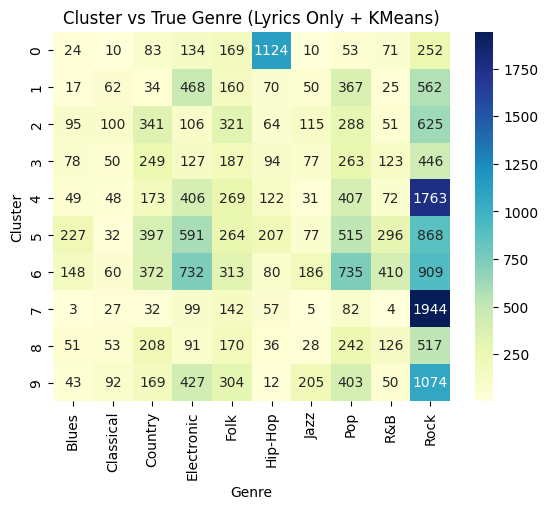

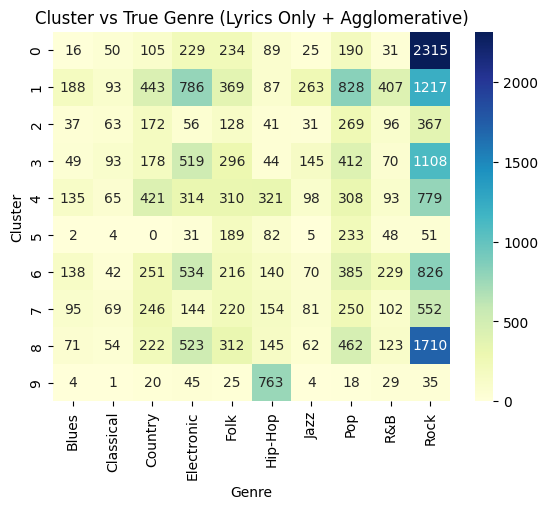

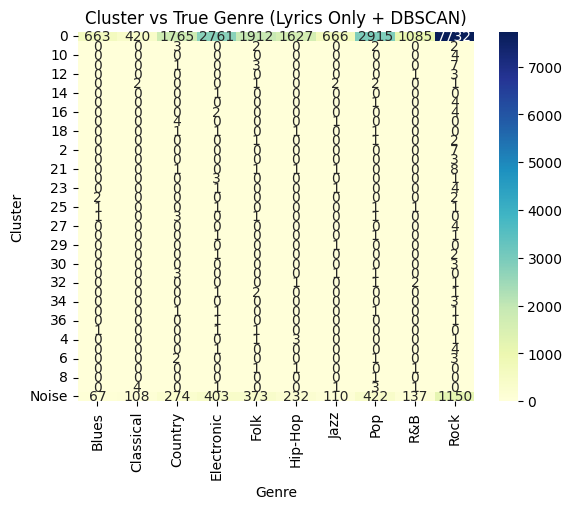

In [ ]:
def cluster_heatmap(clusters, method_name="KMeans"):
    clusters_str = np.array([str(c) if c!=-1 else "Noise" for c in clusters])
    df = pd.DataFrame({"Cluster": clusters_str, "Genre": le.inverse_transform(true_labels)})
    ct = pd.crosstab(df['Cluster'], df['Genre'])
    sns.heatmap(ct, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Cluster vs True Genre ({method_name})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.show()

for name, labels in results_lyrics.items():
    cluster_heatmap(labels, f"Lyrics Only + {name}")